In [2]:
# Mount drive:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


# Import

In [3]:
!pip install pingouin
!pip install pyMechkar

     |████████████████████████████████| 225kB 11.9MB/s 
  Created wheel for pingouin: filename=pingouin-0.3.9-cp36-none-any.whl size=223375 sha256=0b27a933684eaef426b211cd1091a45b831f432e93c2387613daae0b15878067
  Stored in directory: /root/.cache/pip/wheels/6c/d7/26/a23b9ed74061adc5cf8f5e016bbe2902a8ebf63b6471047dbc
  Created wheel for outdated: filename=outdated-0.2.0-cp36-none-any.whl size=4961 sha256=e008b8b1dea39f3a62527502444f3d851a3bc7b4393067a3b4b70eba032f6558
  Stored in directory: /root/.cache/pip/wheels/fd/7c/ef/814f514d31197310872b5abf353feb8fef9d67ee658e1e7e39
  Created wheel for littleutils: filename=littleutils-0.2.2-cp36-none-any.whl size=7051 sha256=bc708ef6af71f6dd9778f2fbacea637de1a134e1b0a7775620a2fef58eff6b88
  Stored in directory: /root/.cache/pip/wheels/53/16/9f/ac67d15c40243754fd73f620e1b9b6dedc20492ecc19a2bae1
Successfully built pingouin outdated littleutils


In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
from datetime import datetime
import matplotlib.pyplot as plt
from collections import Counter
from tqdm import tqdm
tqdm.pandas()
from sklearn.preprocessing import OneHotEncoder
#from pyMechkar import exploreData
import pingouin as pg
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats
import matplotlib.pyplot as plt
import missingno as msno
import fancyimpute
from pyMechkar.analysis import Table1
from pyMechkar.analysis import train_test
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import GridSearchCV
from collections import Counter
from sklearn.model_selection import StratifiedKFold

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Functions

In [5]:
def write_data(df, full_url):
    df.to_csv(full_url, index=False)
    print('Saved csv in {u}'.format(u=str(full_url)))


def get_value_counts(df, col_name):

  value_counts_df = df[col_name].value_counts().reset_index()
  value_counts_df = value_counts_df.rename(columns={'index':col_name,col_name: 'count'})
  value_counts_df = value_counts_df.sort_values(by='count',ascending=False)
  return value_counts_df


def plot_histogram(df, col_name, title, hue_col_name=None):

  if hue_col_name:
    ax = sns.displot(df, x=col_name, hue=hue_col_name)
  else:
    ax = sns.histplot(df[col_name])
  
  plt.suptitle(title)
  plt.show()


def flatten(nested_list):
    for i in nested_list:
        if isinstance(i, (list, tuple)):
            for j in flatten(i):
                yield j
        else:
            yield i


def flatten_list(nested_list):
    return list(flatten(nested_list))


# def read_data(full_url):
#     df = pd.read_csv(full_url, low_memory=False)
#     print('Upload csv from {u}'.format(u=str(full_url)))

#     return df

def read_data(full_url):
    df = pd.read_csv(full_url)
    print('Upload csv from {u}'.format(u=str(full_url)))

    return df


def concat_dfs_by_row(list_of_dfs):
    new_list_Of_dfs = []

    if len(list_of_dfs) < 2:
        print_error('Error: less than two DFs.')
        return None

    col_shape = list_of_dfs[0].shape[1]
    for df in tqdm(list_of_dfs):
        assert df.shape[1] == col_shape
        df.reset_index(drop=True, inplace=True)
        new_list_Of_dfs.append(df)

    all_df = pd.concat(new_list_Of_dfs, axis=0, ignore_index=True)

    return all_df


def filter_transactions(membership_expire_date, churn_date):

  if membership_expire_date < churn_date:
    return 'Yes'
  else:
    return 'No'

def split_date(df,col_name):
    df = df.copy()
    df[col_name+"_"+"Year"] = df[col_name].apply(pd.to_datetime).dt.year
    df[col_name+"_"+"Month"] = df[col_name].apply(pd.to_datetime).dt.month
    df[col_name+"_"+"Day"] = df[col_name].apply(pd.to_datetime).dt.day

    return df

def one_hot_encoder(df,col_name):
    dummy = pd.get_dummies(df[col_name])
    df = pd.concat((df,dummy), axis=1)
    df = df.drop([col_name], axis=1)
    print(df)

    return df

def find_outliers(column):
  outliers = []
  Q1 = column.quantile(.25)
  Q3 = column.quantile(.75)
  IQR = Q3 - Q1
  lower_limit = Q1 - (1.5 * IQR)
  upper_limit = Q3 + (1.5 * IQR)
  for out1 in column:
    if out1 > upper_limit or out1 < lower_limit :
      outliers.append(out1)
  return np.array(outliers)  

def categorial_column_counts(df,column):
  count = df[column].value_counts()
  percent = df[column].value_counts(normalize=True)
  percent100 = df[column].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'

  print('Column counts:{}'.format(column))

  return pd.DataFrame({'counts': count, 'per': percent, 'per100' : percent100}) 

def plt_categorial(column,train,test):
  fig = plt.gcf()

  # Change seaborn plot size
  fig.set_size_inches(10,5)

  plt.subplot(1,2,1)
  sns.countplot(column,data=train ).set_title('Train')

  plt.subplot(1,2,2)
  sns.countplot(column, data=test).set_title('Test')

  plt.tight_layout()
  plt.show() 

def plt_numerical_col_vs_log_or_sqrt(train,test,numerical_column):
  fig, [[ax1, ax2, ax3], [ax4, ax5, ax6]] = plt.subplots(nrows=2, ncols=3, figsize=(20,8))
  ax1.set_xlabel('train_' + numerical_column, fontsize=14)
  ax2.set_xlabel('train_log_' + numerical_column , fontsize=14)
  ax3.set_xlabel('train_sqrt_' + numerical_column , fontsize=14)
  ax4.set_xlabel('test_' + numerical_column, fontsize=14)
  ax5.set_xlabel('test_log_' + numerical_column , fontsize=14)
  ax6.set_xlabel('test_sqrt_' + numerical_column , fontsize=14)
  train[numerical_column].hist(ax=ax1, bins=20)
  np.log10(train[numerical_column] + 1).hist(ax=ax2, bins=20)
  np.sqrt(train[numerical_column]).hist(ax=ax3, bins=20)
  test[numerical_column].hist(ax=ax4, bins=20)
  np.log10(test[numerical_column] + 1).hist(ax=ax5, bins=20)
  np.sqrt(test[numerical_column]).hist(ax=ax6, bins=20)
  plt.show()


def plt_numerical_col_vs_sqrt(train,test,numerical_column):
  fig, [[ax1, ax2], [ax3, ax4]] = plt.subplots(nrows=2, ncols=2, figsize=(20,8))
  ax1.set_xlabel('train_' + numerical_column, fontsize=14)
  ax2.set_xlabel('train_sqrt_' + numerical_column , fontsize=14)
  ax3.set_xlabel('test_' + numerical_column, fontsize=14)
  ax4.set_xlabel('test_sqrt_' + numerical_column , fontsize=14)
  train[numerical_column].hist(ax=ax1, bins=20)
  np.sqrt(train[numerical_column]).hist(ax=ax2, bins=20)
  test[numerical_column].hist(ax=ax3, bins=20)
  np.sqrt(test[numerical_column]).hist(ax=ax4, bins=20)
  plt.show()

def log_transformation(train,test,columns):
  for value in columns:
    train['log_' + value ] = np.log10(train[value] + 1)
    train.drop(value, axis = 1, inplace=True)
    test['log_' + value ] = np.log10(test[value] + 1)
    test.drop(value, axis = 1, inplace=True)
  print("train:")
  display(train)
  print("test:") 
  display(test)

def sqrt_transformation(train,test,columns):
  for value in columns:
    train['sqrt_' + value ] = np.log10(train[value] + 1)
    train.drop(value, axis = 1, inplace=True)
    test['log_' + value ] = np.log10(test[value] + 1)
    test.drop(value, axis = 1, inplace=True)
  print("train:")
  display(train)
  print("test:") 
  display(test) 

def plt_scatterplot_missing_values_imputation(train_unimputed,train_imputed,test_unimputed,test_imputed,numerical_column):
  fig, [[ax1, ax2] , [ax3, ax4]] = plt.subplots(nrows=2, ncols=2, figsize=(15,8))
  ax1.set_xlabel('train_before_imputation: ' + numerical_column, fontsize=14)
  ax2.set_xlabel('train_after_imputation: ' + numerical_column , fontsize=14)
  ax3.set_xlabel('test_before_imputation: ' + numerical_column, fontsize=14)
  ax4.set_xlabel('test_after_imputation: ' + numerical_column , fontsize=14)
  sns.scatterplot(x=train_unimputed.index,y=train_unimputed[numerical_column],ax=ax1)
  sns.scatterplot(x=train_imputed.index,y=train_imputed[numerical_column],hue=train_imputed[numerical_column + '_na'],ax=ax2)
  sns.scatterplot(x=test_unimputed.index,y=test_unimputed[numerical_column],ax=ax3)
  sns.scatterplot(x=test_imputed.index,y=test_imputed[numerical_column],hue=test_imputed[numerical_column + '_na'],ax=ax4)
  plt.show()


def grid_search_per_estimator(x_train, y_train, estimator, param_grid, cv, scoring, stratified=False):
  if stratified:
      kfolds = StratifiedKFold(cv)
  else:
      kfolds = cv
  grid_search_cv = GridSearchCV(estimator, param_grid=param_grid, cv=kfolds, refit=True, verbose=3, scoring=scoring)

  grid_search_cv.fit(x_train, y_train)
  print('Best Estimator: ' + str(grid_search_cv.best_estimator_))
  print("CV " + str(scoring) + " best score for the train set: " + str(grid_search_cv.best_score_))

  # Refit to all train:
  best_estimator = grid_search_cv.best_estimator_.fit(x_train, y_train)

  return best_estimator
  

In [7]:
def write_data(df, full_url):
    df.to_csv(full_url, index=False)
    print('Saved csv in {u}'.format(u=str(full_url)))


def get_value_counts(df, col_name):

  value_counts_df = df[col_name].value_counts().reset_index()
  value_counts_df = value_counts_df.rename(columns={'index':col_name,col_name: 'count'})
  value_counts_df = value_counts_df.sort_values(by='count',ascending=False)
  return value_counts_df


def plot_histogram(df, col_name, title, hue_col_name=None):

  if hue_col_name:
    ax = sns.displot(df, x=col_name, hue=hue_col_name)
  else:
    ax = sns.histplot(df[col_name])
  
  plt.suptitle(title)
  plt.show()


def flatten(nested_list):
    for i in nested_list:
        if isinstance(i, (list, tuple)):
            for j in flatten(i):
                yield j
        else:
            yield i


def flatten_list(nested_list):
    return list(flatten(nested_list))


# def read_data(full_url):
#     df = pd.read_csv(full_url, low_memory=False)
#     print('Upload csv from {u}'.format(u=str(full_url)))

#     return df

def read_data(full_url):
    df = pd.read_csv(full_url)
    print('Upload csv from {u}'.format(u=str(full_url)))

    return df


def concat_dfs_by_row(list_of_dfs):
    new_list_Of_dfs = []

    if len(list_of_dfs) < 2:
        print_error('Error: less than two DFs.')
        return None

    col_shape = list_of_dfs[0].shape[1]
    for df in tqdm(list_of_dfs):
        assert df.shape[1] == col_shape
        df.reset_index(drop=True, inplace=True)
        new_list_Of_dfs.append(df)

    all_df = pd.concat(new_list_Of_dfs, axis=0, ignore_index=True)

    return all_df


def filter_transactions(membership_expire_date, churn_date):

  if membership_expire_date < churn_date:
    return 'Yes'
  else:
    return 'No'

def split_date(df,col_name):
    df = df.copy()
    df[col_name+"_"+"Year"] = df[col_name].apply(pd.to_datetime).dt.year
    df[col_name+"_"+"Month"] = df[col_name].apply(pd.to_datetime).dt.month
    df[col_name+"_"+"Day"] = df[col_name].apply(pd.to_datetime).dt.day

    return df

def one_hot_encoder(df,col_name):
    dummy = pd.get_dummies(df[col_name])
    df = pd.concat((df,dummy), axis=1)
    df = df.drop([col_name], axis=1)
    print(df)

    return df

def find_outliers(column):
  outliers = []
  Q1 = column.quantile(.25)
  Q3 = column.quantile(.75)
  IQR = Q3 - Q1
  lower_limit = Q1 - (1.5 * IQR)
  upper_limit = Q3 + (1.5 * IQR)
  for out1 in column:
    if out1 > upper_limit or out1 < lower_limit :
      outliers.append(out1)
  return np.array(outliers)  

def categorial_column_counts(df,column):
  count = df[column].value_counts()
  percent = df[column].value_counts(normalize=True)
  percent100 = df[column].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'

  print('Column counts:{}'.format(column))

  return pd.DataFrame({'counts': count, 'per': percent, 'per100' : percent100}) 

def plt_categorial(column,train,test):
  fig = plt.gcf()

  # Change seaborn plot size
  fig.set_size_inches(10,5)

  plt.subplot(1,2,1)
  sns.countplot(column,data=train ).set_title('Train')

  plt.subplot(1,2,2)
  sns.countplot(column, data=test).set_title('Test')

  plt.tight_layout()
  plt.show() 

def plt_numerical_col_vs_log_or_sqrt(train,test,numerical_column):
  fig, [[ax1, ax2, ax3], [ax4, ax5, ax6]] = plt.subplots(nrows=2, ncols=3, figsize=(20,8))
  ax1.set_xlabel('train_' + numerical_column, fontsize=14)
  ax2.set_xlabel('train_log_' + numerical_column , fontsize=14)
  ax3.set_xlabel('train_sqrt_' + numerical_column , fontsize=14)
  ax4.set_xlabel('test_' + numerical_column, fontsize=14)
  ax5.set_xlabel('test_log_' + numerical_column , fontsize=14)
  ax6.set_xlabel('test_sqrt_' + numerical_column , fontsize=14)
  train[numerical_column].hist(ax=ax1, bins=20)
  np.log10(train[numerical_column] + 1).hist(ax=ax2, bins=20)
  np.sqrt(train[numerical_column]).hist(ax=ax3, bins=20)
  test[numerical_column].hist(ax=ax4, bins=20)
  np.log10(test[numerical_column] + 1).hist(ax=ax5, bins=20)
  np.sqrt(test[numerical_column]).hist(ax=ax6, bins=20)
  plt.show()


def plt_numerical_col_vs_sqrt(train,test,numerical_column):
  fig, [[ax1, ax2], [ax3, ax4]] = plt.subplots(nrows=2, ncols=2, figsize=(20,8))
  ax1.set_xlabel('train_' + numerical_column, fontsize=14)
  ax2.set_xlabel('train_sqrt_' + numerical_column , fontsize=14)
  ax3.set_xlabel('test_' + numerical_column, fontsize=14)
  ax4.set_xlabel('test_sqrt_' + numerical_column , fontsize=14)
  train[numerical_column].hist(ax=ax1, bins=20)
  np.sqrt(train[numerical_column]).hist(ax=ax2, bins=20)
  test[numerical_column].hist(ax=ax3, bins=20)
  np.sqrt(test[numerical_column]).hist(ax=ax4, bins=20)
  plt.show()

def log_transformation(train,test,columns):
  for value in columns:
    train['log_' + value ] = np.log10(train[value] + 1)
    train.drop(value, axis = 1, inplace=True)
    test['log_' + value ] = np.log10(test[value] + 1)
    test.drop(value, axis = 1, inplace=True)
  print("train:")
  display(train)
  print("test:") 
  display(test)

def sqrt_transformation(train,test,columns):
  for value in columns:
    train['sqrt_' + value ] = np.sqrt(train[value])
    train.drop(value, axis = 1, inplace=True)
    test['sqrt_' + value ] = np.sqrt(test[value])
    test.drop(value, axis = 1, inplace=True)
  print("train:")
  display(train)
  print("test:") 
  display(test)  

def binary_na_column(train,test,columns):
  for value in columns:
    train[value + '_na'] = 0
    train.loc[(train[value].isnull()),[value + '_na']] = 1
    test[value + '_na'] = 0
    test.loc[(train[value].isnull()),[value + '_na']] = 1

def plt_scatterplot():
  for i, value in enumerate(value):  
    sns.scatterplot(x=X_train_imputed.index,y=X_train_imputed[value],hue=X_train_imputed[value+'_na'])
    fig, [[ax1, ax2], [ax3, ax4]] = plt.subplots(nrows=2, ncols=2, figsize=(20,8))
    ax1.set_xlabel('train_' + numerical_column, fontsize=14)
    ax2.set_xlabel('train_sqrt_' + numerical_column , fontsize=14)
    ax3.set_xlabel('test_' + numerical_column, fontsize=14)
    ax4.set_xlabel('test_sqrt_' + numerical_column , fontsize=14)
    train[numerical_column].hist(ax=ax1, bins=20)
    np.sqrt(train[numerical_column]).hist(ax=ax2, bins=20)
    test[numerical_column].hist(ax=ax3, bins=20)
    np.sqrt(test[numerical_column]).hist(ax=ax4, bins=20)
    plt.show()  

# Config

In [6]:
project_url = "drive/MyDrive/DataScience/project/"

# Data Preprocessing

## Load Data

In [7]:
train = pd.read_csv(project_url + "train.csv")
train_v2 = pd.read_csv(project_url + "train_v2.csv")

### Prepare the train data

In [8]:
train

,msno,is_churn
0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1
1,QA7uiXy8vIbUSPOkCf9RwQ3FsT8jVq2OxDr8zqa7bRQ=,1
2,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,1
3,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,1
4,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,1
...,...,...
992926,tUM0yxAj50Vc35vQZ++xMlomdyeLJUW9lEcoPnt3H+g=,0
992927,KQS8etmfGgvE/7Y9gK+E9wdLnRTI0lyyPXaXL3I8E4c=,0
992928,8/jDLgNREuWI9hcKVYp8723nmavn01T+AuMWkK3uM7g=,0
992929,iNV99F1Rml7EMndOeLI0Y/iek6aCj/Qp1Z4dZvR+sak=,0


In [9]:
 train_not_in_train2 = train[~train['msno'].isin(train_v2['msno'])]

In [10]:
full_train = pd.concat((train_not_in_train2, train_v2), axis=0, ignore_index=True).reset_index(drop=True)

In [11]:
full_train

,msno,is_churn
0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1
1,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,1
2,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,1
3,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,1
4,GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=,1
...,...,...
1082185,OHnZbu+EVaP+vN7Z+OfT5OMcp90MWFZonmM0o3pb8FY=,0
1082186,S92bDK//uI6hk3u1vuApro0qJBQOToBozZ7lL1yTC+w=,0
1082187,eUa3xo16vpAjr43Cjlb6Kjf1NTILYyJIkBayJQdXWnw=,0
1082188,iZE41tbAQ65rJq60olkJT4BJzuUAYgQdfbEemXe/TTk=,0


In [12]:
# Check duplicate rows based on all columns.
full_train.drop_duplicates().shape[0] == full_train.shape[0]

True

In [ ]:
# Check duplicates on 'msno' column.
full_train.drop_duplicates(subset=['msno']).shape[0] == full_train.shape[0]

True

In [ ]:
write_data(df=full_train, full_url=project_url+'Data/full_train.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/full_train.csv


In [ ]:
full_train = read_data(full_url=project_url+'Data/full_train.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/full_train.csv


### Prepare the test data

In [ ]:
sample_submission_zero = pd.read_csv(project_url + "sample_submission_zero.csv")
sample_submission_zero_v2 = pd.read_csv(project_url + "sample_submission_v2.csv")

In [ ]:
 samplesub_not_in_samplesub2 = sample_submission_zero[~sample_submission_zero['msno'].isin(sample_submission_zero_v2['msno'])]

In [ ]:
test = pd.concat((samplesub_not_in_samplesub2, sample_submission_zero_v2), axis=0, ignore_index=True).reset_index(drop=True)

In [ ]:
# Check duplicate rows based on all columns.
test.drop_duplicates().shape[0] == test.shape[0]

True

In [ ]:
# Check duplicates on 'msno' column.
test.drop_duplicates(subset=['msno']).shape[0] == test.shape[0]

True

In [ ]:
write_data(df=test, full_url=project_url+'Data/test.csv')

In [ ]:
test = read_data(full_url=project_url+'Data/test.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/test.csv


### Prepare the transactions data

In [ ]:
transactions = pd.read_csv(project_url + "transactions.csv")
transactions_v2 = pd.read_csv(project_url + "transactions_v2.csv")

In [ ]:
full_transactions = pd.concat([transactions, transactions_v2], ignore_index=True)

In [ ]:
write_data(df=full_transactions, full_url=project_url+'Data/full_transactions.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/full_transactions.csv


In [ ]:
full_transactions = read_data(full_url=project_url+'Data/full_transactions.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/full_transactions.csv


In [ ]:
# Check duplicate rows based on all columns.
full_transactions.drop_duplicates().shape[0] == full_transactions.shape[0]

False

In [ ]:
full_transactions = full_transactions.drop_duplicates()

In [ ]:
write_data(df=full_transactions, full_url=project_url+'Data/full_transactions.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/full_transactions.csv


In [ ]:
full_transactions = read_data(full_url=project_url+'Data/full_transactions.csv')


Upload csv from drive/MyDrive/DataScience/project/Data/full_transactions.csv


In [ ]:
full_transactions['transaction_date'] = full_transactions['transaction_date'].str.strip()


### Prepate the members data

In [10]:
members = pd.read_csv(project_url + "members_v3.csv")

In [ ]:
# Check duplicates per row
members.shape[0] == members.drop_duplicates().shape[0]

True

In [ ]:
# Check duplicates for 'msno' (user_id) column
members.drop_duplicates(subset='msno').shape[0] == members.shape[0]

True

In [ ]:
# Check NA(s)
members.isna().sum()

msno                            0
city                            0
bd                              0
gender                    4429505
registered_via                  0
registration_init_time          0
dtype: int64

In [ ]:
# Subset to train and test users only:
members = members[members['msno'].isin(users)]

In [ ]:
members.shape[0]

1018235

In [ ]:
# Handle date format
members['registration_init_time'] = members['registration_init_time'].apply(lambda x: datetime.strptime(str(int(x)), "%Y%m%d").date() if pd.notnull(x) else "NAN" )

In [ ]:
# Split gender to female and male (kind of One Hot Encoding)
dummy = pd.get_dummies(members['gender'])

In [ ]:
dummy

,female,male
0,0,0
1,0,0
2,0,0
3,0,0
4,1,0
...,...,...
6769468,0,0
6769469,0,0
6769470,1,0
6769471,0,0


In [ ]:
# Adding female and male columns to members df
members2 = pd.concat((members,dummy), axis=1)

In [ ]:
# Changing the dummy columns names
members2 = members2.rename(columns={"female":"is_female","male":"is_male"})

In [ ]:
members2.isnull().mean()

msno                      0.000000
city                      0.000000
bd                        0.670917
gender                    0.654335
registered_via            0.000000
registration_init_time    0.000000
is_female                 0.000000
is_male                   0.000000
dtype: float64

In [ ]:
members2

,msno,city,bd,gender,registered_via,registration_init_time,female,male
0,Rb9UwLQTrxzBVwCB6+bCcSQWZ9JiNLC9dXtM1oEsZA8=,1,0,NaN,11,2011-09-11,0,0
1,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,0,NaN,7,2011-09-14,0,0
2,cV358ssn7a0f7jZOwGNWS07wCKVqxyiImJUX6xcIwKw=,1,0,NaN,11,2011-09-15,0,0
3,9bzDeJP6sQodK73K5CBlJ6fgIQzPeLnRl0p5B77XP+g=,1,0,NaN,11,2011-09-15,0,0
4,WFLY3s7z4EZsieHCt63XrsdtfTEmJ+2PnnKLH5GY4Tk=,6,32,female,9,2011-09-15,1,0
...,...,...,...,...,...,...,...,...
6769468,VSGkb3hyBRUtb/b1MQUZbvOkktS3vKLnhMHW0CF8eyU=,1,0,NaN,7,2015-10-20,0,0
6769469,nWjH7glPkZ7jOVaCRwwjlpmp0T1hSWdv8hMJxiWCwKc=,1,0,NaN,7,2015-10-20,0,0
6769470,GH+b5+1tlv7ZZXsA8upBzVXMTLyffKcsF7WoU8b5rOI=,15,26,female,4,2015-10-20,1,0
6769471,XVlwT3fdCFGKqerEKBzUIjK+jzI6jzSke4cDMVhYyjE=,1,0,NaN,4,2015-10-20,0,0


In [ ]:
members2

,msno,city,bd,gender,registered_via,registration_init_time,is_female,is_male
0,Rb9UwLQTrxzBVwCB6+bCcSQWZ9JiNLC9dXtM1oEsZA8=,1,NaN,NaN,11,2011-09-11,0,0
1,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,NaN,NaN,7,2011-09-14,0,0
2,cV358ssn7a0f7jZOwGNWS07wCKVqxyiImJUX6xcIwKw=,1,NaN,NaN,11,2011-09-15,0,0
3,9bzDeJP6sQodK73K5CBlJ6fgIQzPeLnRl0p5B77XP+g=,1,NaN,NaN,11,2011-09-15,0,0
4,WFLY3s7z4EZsieHCt63XrsdtfTEmJ+2PnnKLH5GY4Tk=,6,32.0,female,9,2011-09-15,1,0
...,...,...,...,...,...,...,...,...
6769468,VSGkb3hyBRUtb/b1MQUZbvOkktS3vKLnhMHW0CF8eyU=,1,NaN,NaN,7,2015-10-20,0,0
6769469,nWjH7glPkZ7jOVaCRwwjlpmp0T1hSWdv8hMJxiWCwKc=,1,NaN,NaN,7,2015-10-20,0,0
6769470,GH+b5+1tlv7ZZXsA8upBzVXMTLyffKcsF7WoU8b5rOI=,15,26.0,female,4,2015-10-20,1,0
6769471,XVlwT3fdCFGKqerEKBzUIjK+jzI6jzSke4cDMVhYyjE=,1,NaN,NaN,4,2015-10-20,0,0


In [ ]:
# There are lot of outliers so for this analysis I set up a range in which age should be less than 120 and greater than 10
lower_value = 10
higher_value = 120

In [ ]:
# Defined an acceptable range of ages for users in the workplace and replaced numbers outside of this range with null values.
members2.bd.loc[(members2.bd < lower_value) | (members2.bd > higher_value)] = np.nan

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [ ]:
# create age-groups
bins= [lower_value,20,25,35,45,55,65,higher_value]
labels = ['Age_10-19,','Age_20-24','Age_25-34','Age_35-44','Age_45-54','Age_55-65','Age_65+']
members2['AgeGroup'] = pd.cut(members2['bd'], bins=bins, labels=labels, right=False)

In [ ]:
members2 = one_hot_encoder(df=members2,col_name='AgeGroup')

In [ ]:
members['bd'].dtype

dtype('float64')

In [ ]:
write_data(df=members2, full_url=project_url+'Data/members_v2.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/members_v2.csv


In [9]:
members2 = read_data(full_url=project_url+'Data/members_v2.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/members_v2.csv


In [ ]:
members2 = split_date(df=members2,col_name='registration_init_time')

In [ ]:
members2 = members2.drop(['registration_init_time','gender'], axis=1)

In [ ]:
members2

,msno,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+
0,Rb9UwLQTrxzBVwCB6+bCcSQWZ9JiNLC9dXtM1oEsZA8=,1,NaN,11,0,0,2011,9,11,0,0,0,0,0,0,0
1,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,NaN,7,0,0,2011,9,14,0,0,0,0,0,0,0
2,cV358ssn7a0f7jZOwGNWS07wCKVqxyiImJUX6xcIwKw=,1,NaN,11,0,0,2011,9,15,0,0,0,0,0,0,0
3,9bzDeJP6sQodK73K5CBlJ6fgIQzPeLnRl0p5B77XP+g=,1,NaN,11,0,0,2011,9,15,0,0,0,0,0,0,0
4,WFLY3s7z4EZsieHCt63XrsdtfTEmJ+2PnnKLH5GY4Tk=,6,32.0,9,1,0,2011,9,15,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6769468,VSGkb3hyBRUtb/b1MQUZbvOkktS3vKLnhMHW0CF8eyU=,1,NaN,7,0,0,2015,10,20,0,0,0,0,0,0,0
6769469,nWjH7glPkZ7jOVaCRwwjlpmp0T1hSWdv8hMJxiWCwKc=,1,NaN,7,0,0,2015,10,20,0,0,0,0,0,0,0
6769470,GH+b5+1tlv7ZZXsA8upBzVXMTLyffKcsF7WoU8b5rOI=,15,26.0,4,1,0,2015,10,20,0,0,1,0,0,0,0
6769471,XVlwT3fdCFGKqerEKBzUIjK+jzI6jzSke4cDMVhYyjE=,1,NaN,4,0,0,2015,10,20,0,0,0,0,0,0,0


### Prepate the user_logs data

In [ ]:
users_logs = pd.read_csv(project_url + "users_logs_30M.csv")
user_logs_v2 = pd.read_csv(project_url + "user_logs_v2.csv")

In [ ]:
full_user_logs = pd.concat([users_logs, user_logs_v2], ignore_index=True)

In [ ]:
# Check for rows duplicates
full_user_logs.dropna().shape[0] == full_user_logs.shape[0]

True

In [ ]:
full_user_logs.describe()

,date,num_25,num_50,num_75,num_985,num_100,num_unq,total_secs
count,4.839636e+07,4.839636e+07,4.839636e+07,4.839636e+07,4.839636e+07,4.839636e+07,4.839636e+07,4.839636e+07
mean,2.016230e+07,6.388575e+00,1.590189e+00,9.882101e-01,1.110356e+00,3.054928e+01,2.968282e+01,-8.892359e+11
std,7.940004e+03,1.410572e+01,4.135558e+00,2.085166e+00,3.163005e+00,4.249334e+01,3.317439e+01,9.075359e+13
min,2.015010e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,-9.223372e+15
25%,2.015122e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.000000e+00,8.000000e+00,1.917551e+03
50%,2.016102e+07,2.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.700000e+01,1.900000e+01,4.609534e+03
75%,2.017031e+07,7.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00,3.800000e+01,3.900000e+01,1.009989e+04
max,2.017033e+07,7.112000e+03,9.120000e+02,6.440000e+02,2.417000e+03,4.110700e+04,4.925000e+03,9.223372e+15


In [ ]:
# there is a negative value in the total_secs column of above frame, so I would check for the negative values:
full_user_logs[full_user_logs['total_secs']<0]

,msno,date,num_25,num_50,num_75,num_985,num_100,num_unq,total_secs
4497,8x6zMayYaSYhXQkZhD+YeBI0oNphdou+ODBpbtJpvBQ=,20150909,4,3,1,1,154,141,-9.223372e+15
5730,BtZTCXLQ0MvrlsosU/NsJabEZiz8JJz/rAfqjoGgxs8=,20150808,65,0,1,1,17,79,-9.223372e+15
11600,XoJGWnX0RN5ZUvUTG98Ldj3vlRXNQ3hhIQ1ei63oG7k=,20150430,2,6,0,0,120,118,-9.223372e+15
11750,NnLgT9VXBXCyhubkMQirm1Ns+xjiq+4v6zHmbaxfd+Y=,20150926,12,1,2,4,67,83,-9.223372e+15
12969,zCKbAfdXVRoZGSlmLPxQNwL7j9Lea1BbxdmU42SfJxc=,20160221,12,8,8,8,53,77,-9.223372e+15
...,...,...,...,...,...,...,...,...,...
29966356,42wvSriKv7m9oZKUYTTT/GvSmnLM5+OJ4/L70g2PXrk=,20150927,3,1,0,0,45,42,-9.223372e+15
29971976,6CUGnHRoyyxaOYk7/IsJrkAhzuLSUM2eI9juwYFD8Ck=,20151004,7,3,0,0,12,14,-9.223372e+15
29974622,3+Uk93mPcLTSWarDBZatQJdRKLjTO1F4HiOfLaHbzdM=,20150612,33,28,6,1,14,81,-9.223372e+15
29978577,Nq7c/O9yjph4ToNVIOgu30eAiRxAiX0kJsupNYeidqU=,20150909,1,0,0,0,37,32,-9.223372e+15


In [ ]:
full_user_logs['total_secs'] = np.where(full_user_logs['total_secs'] < 0,0,full_user_logs['total_secs'])

In [ ]:
full_user_logs[full_user_logs['total_secs']<0]

,msno,date,num_25,num_50,num_75,num_985,num_100,num_unq,total_secs


In [ ]:
full_user_logs.describe()

,date,num_25,num_50,num_75,num_985,num_100,num_unq,total_secs
count,4.839636e+07,4.839636e+07,4.839636e+07,4.839636e+07,4.839636e+07,4.839636e+07,4.839636e+07,4.839636e+07
mean,2.016230e+07,6.388575e+00,1.590189e+00,9.882101e-01,1.110356e+00,3.054928e+01,2.968282e+01,1.915559e+09
std,7.940004e+03,1.410572e+01,4.135558e+00,2.085166e+00,3.163005e+00,4.249334e+01,3.317439e+01,4.193148e+12
min,2.015010e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00
25%,2.015122e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.000000e+00,8.000000e+00,1.917551e+03
50%,2.016102e+07,2.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.700000e+01,1.900000e+01,4.609534e+03
75%,2.017031e+07,7.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00,3.800000e+01,3.900000e+01,1.009989e+04
max,2.017033e+07,7.112000e+03,9.120000e+02,6.440000e+02,2.417000e+03,4.110700e+04,4.925000e+03,9.223372e+15


In [ ]:
# converting total seconds to total minutes by dividing it by 60
full_user_logs['total_minutes'] = full_user_logs['total_secs']/60
full_user_logs.drop(columns=['total_secs'],inplace=True)

In [ ]:
# Handle date format
full_user_logs['date'] = full_user_logs['date'].apply(lambda x: datetime.strptime(str(int(x)), "%Y%m%d").date() if pd.notnull(x) else "NAN" )

In [ ]:
full_user_logs

,msno,date,num_25,num_50,num_75,num_985,num_100,num_unq,total_minutes
0,rxIP2f2aN0rYNp+toI0Obt/N/FYQX8hcO1fTmmy2h34=,2015-05-13,0,0,0,0,1,1,4.672250
1,rxIP2f2aN0rYNp+toI0Obt/N/FYQX8hcO1fTmmy2h34=,2015-07-09,9,1,0,0,7,11,27.649133
2,yxiEWwE9VR5utpUecLxVdQ5B7NysUPfrNtGINaM2zA8=,2015-01-05,3,3,0,0,68,36,289.415933
3,yxiEWwE9VR5utpUecLxVdQ5B7NysUPfrNtGINaM2zA8=,2015-03-06,1,0,1,1,97,27,411.121950
4,yxiEWwE9VR5utpUecLxVdQ5B7NysUPfrNtGINaM2zA8=,2015-05-01,3,0,0,0,38,38,160.817150
...,...,...,...,...,...,...,...,...,...
48396357,FGpiy2mB+vXLKziYRcY/xJcJEFJfRDfUqlU+p760f7E=,2017-03-14,0,0,0,0,1,1,4.134300
48396358,iZRjKNMrw5ffEbfXODLhV/0tJLPbOH3am1WYDgqBf8Q=,2017-03-06,0,0,0,0,1,1,5.183333
48396359,yztw4Y0EggG0w2wPkbMZx7ke7saSx7dLSfMheHZG/DQ=,2017-03-31,0,0,0,0,17,1,66.219817
48396360,swCHwkNx30/aENjq30qqaLlm7bUUytbMXdz1bH7g0Jk=,2017-03-07,0,0,0,1,0,1,2.987967


In [ ]:
write_data(df=full_user_logs, full_url=project_url+'Data/full_user_logs.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/full_user_logs.csv


In [9]:
full_user_logs = read_data(full_url=project_url+'Data/full_user_logs.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/full_user_logs.csv


# Data Preprocessing

## Train

In [ ]:
full_train = full_train.drop_duplicates()
full_train['msno'] = full_train['msno'].astype(str)

In [ ]:
# Check for duplicates
full_train.dropna().shape[0] == full_train.shape[0]

True

In [ ]:
full_train.dtypes

msno                   object
is_churn                int64
churn_month            object
churn_date     datetime64[ns]
dtype: object

In [ ]:
# Count 0 and 1 in 'is_churn' column
Counter(full_train['is_churn'])

Counter({0: 1813090, 1: 150801})

In [ ]:
(139749/(139749+988431))*100

12.387119076743073

In [ ]:
# write_data(df=full_train, full_url=project_url+'Data/full_train.csv')

Saved csv in drive/MyDrive/project/Data/full_train.csv


In [ ]:
full_train = read_data(full_url=project_url+'Data/full_train.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/full_train.csv


## Test

In [ ]:
# 'is_churn' column in test containing only 0. Therefore, we will drop the column.
test = test.drop('is_churn',axis=1)

In [ ]:
# Convert user_id ('msno') from Object to str.
test['msno'] = test['msno'].astype(str)

In [ ]:
# Cיheck for duplicates
test.dropna().shape[0] == test.shape[0]

True

In [ ]:
# write_data(df=test, full_url=project_url+'Data/test.csv')

In [ ]:
test = read_data(full_url=project_url+'Data/test.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/test.csv


## Transactions

In [ ]:
# convert user_id ('msno') to str
full_transactions['msno'] = full_transactions['msno'].astype(str)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
# Convert dates format.
full_transactions['transaction_date'] = full_transactions['transaction_date'].apply(lambda x: datetime.strptime(str(int(x)), "%Y%m%d").date() if pd.notnull(x) else "NAN" )
full_transactions['membership_expire_date'] = full_transactions['membership_expire_date'].apply(lambda x: datetime.strptime(str(int(x)), "%Y%m%d").date() if pd.notnull(x) else "NAN" )

In [ ]:
# Check num of rows
full_transactions.shape[0]

17858127

In [ ]:
# Check for NA(s)
full_transactions.isna().sum()

msno                      0
payment_method_id         0
payment_plan_days         0
plan_list_price           0
actual_amount_paid        0
is_auto_renew             0
transaction_date          0
membership_expire_date    0
is_cancel                 0
dtype: int64

In [30]:
max(full_transactions.actual_amount_paid)

2000

In [ ]:
users = []
train_users = list(full_train['msno'])
test_users = list(test['msno'])
users.append(train_users)
users.append(test_users)
users = flatten_list(nested_list=users)

In [ ]:
len(users)

3842322

In [ ]:
# Subset to train and test users only:
full_transactions = full_transactions[full_transactions['msno'].isin(users)]

In [ ]:
full_transactions.shape[0]

17861218

In [ ]:
# write_data(df=full_transactions, full_url=project_url+'Data/full_transactions.csv')

Saved csv in drive/MyDrive/project/Data/full_transactions.csv


In [ ]:
full_transactions = read_data(full_url=project_url+'Data/full_transactions.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/full_transactions.csv


In [ ]:
# Filter transactions per churn date:
full_train['trainOrTest'] = 'Train'
test['trainOrTest'] = 'Test'
target_df = pd.concat([full_train, test], ignore_index=True)

In [ ]:
full_transactions = pd.merge(full_transactions, target_df, on='msno', how='left')
full_transactions['membership_expire_date'] = pd.to_datetime(full_transactions['membership_expire_date'])

In [ ]:
pos_full_transactions = full_transactions[full_transactions['is_churn']==1]
not_pos_full_transactions = full_transactions[full_transactions['is_churn']!=1]
not_pos_full_transactions['keep'] = 'Yes'

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
del full_transactions

In [ ]:
pos_full_transactions['churn_date'] = pd.to_datetime(pos_full_transactions['churn_date'])

In [ ]:
pos_full_transactions['keep'] = pos_full_transactions.progress_apply(lambda x: filter_transactions(membership_expire_date=x['membership_expire_date'],
                                                                                                    churn_date=x['churn_date']), axis=1)

100%|██████████| 1817877/1817877 [00:51<00:00, 35548.11it/s]


In [ ]:
pos_full_transactions = pos_full_transactions[pos_full_transactions['keep']=='Yes'].reset_index(drop=True)

In [ ]:
pos_full_transactions = pos_full_transactions.drop(['is_churn','churn_month','trainOrTest','keep'],axis=1)

In [ ]:
write_data(df=pos_full_transactions, full_url=project_url+'Data/pos_full_transactions.csv')

Saved csv in drive/MyDrive/project/Data/pos_full_transactions.csv


In [ ]:
not_pos_full_transactions.head(4)

,msno,payment_method_id,payment_plan_days,plan_list_price,actual_amount_paid,is_auto_renew,transaction_date,membership_expire_date,is_cancel,is_churn,churn_month,churn_date,trainOrTest,keep
0,YyO+tlZtAXYXoZhNr3Vg3+dfVQvrBVGO8j1mfqe4ZHc=,41,30,129,129,1,2015-09-30,2015-11-01,0,0.0,FEB,2017-03-01,Train,Yes
1,AZtu6Wl0gPojrEQYB8Q3vBSmE2wnZ3hi1FbK1rQQ0A4=,41,30,149,149,1,2015-09-30,2015-10-31,0,0.0,FEB,2017-03-01,Train,Yes
2,AZtu6Wl0gPojrEQYB8Q3vBSmE2wnZ3hi1FbK1rQQ0A4=,41,30,149,149,1,2015-09-30,2015-10-31,0,0.0,MAR,2017-04-01,Train,Yes
3,AZtu6Wl0gPojrEQYB8Q3vBSmE2wnZ3hi1FbK1rQQ0A4=,41,30,149,149,1,2015-09-30,2015-10-31,0,NaN,MAR,2017-04-01,Test,Yes


In [ ]:
not_pos_full_transactions = not_pos_full_transactions.drop(['is_churn','churn_month','trainOrTest','keep'],axis=1)

In [ ]:
write_data(df=not_pos_full_transactions, full_url=project_url+'Data/not_pos_full_transactions.csv')

Saved csv in drive/MyDrive/project/Data/not_pos_full_transactions.csv


In [ ]:
pos_full_transactions = read_data(full_url=project_url+'Data/pos_full_transactions.csv')

Upload csv from drive/MyDrive/project/Data/pos_full_transactions.csv


In [ ]:
not_pos_full_transactions = read_data(full_url=project_url+'Data/not_pos_full_transactions.csv')

In [ ]:
full_transactions = concat_dfs_by_row(list_of_dfs=[pos_full_transactions, not_pos_full_transactions])

100%|██████████| 2/2 [00:00<00:00, 2619.80it/s]


In [ ]:
full_transactions.shape[0]

63921677

In [ ]:
write_data(df=full_transactions, full_url=project_url+'Data/full_transactions.csv')

Saved csv in drive/MyDrive/project/Data/full_transactions.csv


In [14]:
full_transactions = read_data(full_url=project_url+'Data/full_transactions.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/full_transactions.csv


In [16]:
min(full_transactions.payment_method_id)

2

### Transactions New Features

In [ ]:
full_transactions['discount_price'] = full_transactions['plan_list_price'] - full_transactions['actual_amount_paid']

In [ ]:
full_transactions['is_discount'] = full_transactions['discount_price'].apply(lambda x: 1 if x > 0 else 0)

In [ ]:
full_transactions['membership_duration'] = pd.to_datetime(full_transactions['membership_expire_date']) - pd.to_datetime(full_transactions['transaction_date'])
np.timedelta64(366,'D')


numpy.timedelta64(366,'D')

In [ ]:
full_transactions['amt_by_day'] = full_transactions['actual_amount_paid'] / full_transactions['payment_plan_days']

In [ ]:
full_transactions

,msno,payment_method_id,payment_plan_days,plan_list_price,actual_amount_paid,is_auto_renew,transaction_date,membership_expire_date,is_cancel,discount_price,is_discount,membership_duration,amt_by_day
0,YyO+tlZtAXYXoZhNr3Vg3+dfVQvrBVGO8j1mfqe4ZHc=,41,30,129,129,1,2015-09-30,2015-11-01,0,0,0,32 days,4.300000
1,AZtu6Wl0gPojrEQYB8Q3vBSmE2wnZ3hi1FbK1rQQ0A4=,41,30,149,149,1,2015-09-30,2015-10-31,0,0,0,31 days,4.966667
2,yvj6zyBUaqdbUQSrKsrZ+xNDVM62knauSZJzakS9OW4=,39,30,149,149,1,2015-09-30,2015-11-21,0,0,0,52 days,4.966667
3,KN7I82kjY0Tn76Ny95ncqBUVbO7b8AXrOPqZutKpxIM=,21,30,149,149,1,2015-09-30,2015-11-07,0,0,0,38 days,4.966667
4,m5ptKif9BjdUghHXXomSezy5ohJiHm85PE13f/3kQaw=,39,30,149,149,1,2015-09-30,2015-11-28,0,0,0,59 days,4.966667
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17858122,zviO0RLvsXAzgz894wMm5b9Nxp8yxFAuqHY1Nq0lq3M=,36,30,180,180,1,2017-03-16,2017-04-15,0,0,0,30 days,6.000000
17858123,zwF50wwaJI2TBKWhB42HRBJ6EQK0jgSo1Xmwb9Jq3SU=,32,180,536,536,0,2017-02-15,2017-08-17,0,0,0,183 days,2.977778
17858124,zx/h5MzQQmsSat04wSfGpHp6N8aWLLwM1+7OV7ujmPY=,41,30,149,149,1,2017-03-06,2017-04-06,0,0,0,31 days,4.966667
17858125,zxvgjIKjy18Fm+cIWUfYKr68z09+ILBxuMW0DnbeUZ8=,41,30,99,99,1,2017-03-08,2017-04-08,0,0,0,31 days,3.300000


In [ ]:
full_transactions.dtypes

msno                       object
payment_method_id           int64
payment_plan_days           int64
plan_list_price             int64
actual_amount_paid          int64
is_auto_renew               int64
transaction_date           object
membership_expire_date     object
is_cancel                   int64
discount_price              int64
is_discount                 int64
membership_duration         int64
amt_by_day                float64
dtype: object

In [ ]:
full_transactions.head()

,msno,payment_method_id,payment_plan_days,plan_list_price,actual_amount_paid,is_auto_renew,transaction_date,membership_expire_date,is_cancel,discount_price,is_discount,membership_duration,amt_by_day
0,YyO+tlZtAXYXoZhNr3Vg3+dfVQvrBVGO8j1mfqe4ZHc=,41,30,129,129,1,2015-09-30,2015-11-01,0,0,0,32 days,4.300000
1,AZtu6Wl0gPojrEQYB8Q3vBSmE2wnZ3hi1FbK1rQQ0A4=,41,30,149,149,1,2015-09-30,2015-10-31,0,0,0,31 days,4.966667
2,yvj6zyBUaqdbUQSrKsrZ+xNDVM62knauSZJzakS9OW4=,39,30,149,149,1,2015-09-30,2015-11-21,0,0,0,52 days,4.966667
3,KN7I82kjY0Tn76Ny95ncqBUVbO7b8AXrOPqZutKpxIM=,21,30,149,149,1,2015-09-30,2015-11-07,0,0,0,38 days,4.966667
4,m5ptKif9BjdUghHXXomSezy5ohJiHm85PE13f/3kQaw=,39,30,149,149,1,2015-09-30,2015-11-28,0,0,0,59 days,4.966667


In [ ]:
full_transactions

,msno,payment_method_id,payment_plan_days,plan_list_price,actual_amount_paid,is_auto_renew,transaction_date,membership_expire_date,is_cancel,discount_price,is_discount,membership_duration,amt_by_day
0,YyO+tlZtAXYXoZhNr3Vg3+dfVQvrBVGO8j1mfqe4ZHc=,41,30,129,129,1,2015-09-30,2015-11-01,0,0,0,32,4.300000
1,AZtu6Wl0gPojrEQYB8Q3vBSmE2wnZ3hi1FbK1rQQ0A4=,41,30,149,149,1,2015-09-30,2015-10-31,0,0,0,31,4.966667
2,yvj6zyBUaqdbUQSrKsrZ+xNDVM62knauSZJzakS9OW4=,39,30,149,149,1,2015-09-30,2015-11-21,0,0,0,52,4.966667
3,KN7I82kjY0Tn76Ny95ncqBUVbO7b8AXrOPqZutKpxIM=,21,30,149,149,1,2015-09-30,2015-11-07,0,0,0,38,4.966667
4,m5ptKif9BjdUghHXXomSezy5ohJiHm85PE13f/3kQaw=,39,30,149,149,1,2015-09-30,2015-11-28,0,0,0,59,4.966667
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17858122,zviO0RLvsXAzgz894wMm5b9Nxp8yxFAuqHY1Nq0lq3M=,36,30,180,180,1,2017-03-16,2017-04-15,0,0,0,30,6.000000
17858123,zwF50wwaJI2TBKWhB42HRBJ6EQK0jgSo1Xmwb9Jq3SU=,32,180,536,536,0,2017-02-15,2017-08-17,0,0,0,183,2.977778
17858124,zx/h5MzQQmsSat04wSfGpHp6N8aWLLwM1+7OV7ujmPY=,41,30,149,149,1,2017-03-06,2017-04-06,0,0,0,31,4.966667
17858125,zxvgjIKjy18Fm+cIWUfYKr68z09+ILBxuMW0DnbeUZ8=,41,30,99,99,1,2017-03-08,2017-04-08,0,0,0,31,3.300000


In [ ]:
# Extract num of days from string 'membership_duration'
full_transactions['membership_duration'] = full_transactions['membership_duration'].apply(lambda x: x.rpartition(' d')[0] )


In [ ]:
# Convert 'membership_duration' type from object to int in order to aggregate to mean
full_transactions['membership_duration'] = full_transactions['membership_duration'].astype(int)

In [ ]:
agg_variables = {'transaction_date' : ['count'],
            'payment_method_id':[lambda x: stats.mode(x)[0][0]], # the mode of payment_method_id
            'payment_plan_days':['mean'], # the mean of payment_plan_days
            'plan_list_price':['mean'], # the mean of plan list price
            'actual_amount_paid':['mean'], # the mean of actual_amount_paid
            'is_auto_renew':[lambda x: stats.mode(x)[0][0]], # the mode of is_auto_renew
            'is_cancel':[lambda x: stats.mode(x)[0][0]], # the mode of is_cancel or not
            'discount_price':['mean'], # the mean of discount
            'is_discount':[lambda x: stats.mode(x)[0][0]],# the mode of is discount or not
            'membership_duration':['mean'], # the mean of membership_duration
            'amt_by_day':['mean']} # the mean of amount paid per day


In [ ]:
full_transactions_gb = full_transactions.groupby('msno', as_index=False).agg(agg_variables, as_index=False)

In [ ]:
# Changed the columns names based on the new features we created on the group by stage
full_transactions_gb.columns = ['msno','transactions_count','payment_method_id_mode','payment_plan_days_mean','plan_list_price_mean','actual_amount_paid_mean','is_auto_renew_mode','is_cancel_mode','discount_price_mean','is_discount_mode','membership_duration_mean','amt_by_day_mean']

In [ ]:
# Check duplicate rows based on all columns.
full_transactions_gb.shape[0] == full_transactions_gb.drop_duplicates().shape[0]

True

In [ ]:
full_transactions_gb['amt_by_day_mean']

0          3.300000
1               inf
2               inf
3          4.966667
4               inf
             ...   
1143467    5.009722
1143468         inf
1143469         inf
1143470    4.966667
1143471    3.300000
Name: amt_by_day_mean, Length: 1143472, dtype: float64

In [ ]:
# Replace inf (infinity) with 0 
full_transactions_gb['amt_by_day_mean'] = full_transactions_gb['amt_by_day_mean'].replace([np.inf, -np.inf], 0)

In [ ]:
# Verify that infinity was removed
full_transactions_gb[full_transactions_gb['amt_by_day_mean'] == np.inf].shape[0]

0

In [ ]:
# Verify that there are no user_id duplications after the group by stage  
full_transactions_gb['msno'].drop_duplicates().shape[0] == full_transactions_gb.shape[0]

True

In [ ]:
write_data(df=full_transactions_gb, full_url=project_url+'Data/transactions_v3.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/transactions_v3.csv


In [ ]:
full_transactions_gb = read_data(full_url=project_url+'Data/transactions_v3.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/transactions_v3.csv


In [ ]:
full_transactions_gb

,msno,transactions_count,payment_method_id_mode,payment_plan_days_mean,plan_list_price_mean,actual_amount_paid_mean,is_auto_renew_mode,is_cancel_mode,discount_price_mean,is_discount_mode,membership_duration_mean,amt_by_day_mean
0,+++hVY1rZox/33YtvDgmKA2Frg/2qhkz12B9ylCvh8o=,5,41,30.000000,99.000000,99.000000,1,0,0.000000,0,30.000000,3.300000
1,+++l/EXNMLTijfLBa8p2TUVVVp2aFGSuUI/h7mLmthw=,21,39,28.714286,141.904762,149.000000,1,0,-7.095238,0,49.095238,0.000000
2,+++snpr7pmobhLKUgSHTv/mpkqgBT0tQJ0zQj6qKrqc=,27,41,28.888889,143.481481,149.000000,1,0,-5.518519,0,30.407407,0.000000
3,++/9R3sX37CjxbY/AaGvbwr3QkwElKBCtSvVzhCBDOk=,13,41,30.000000,149.000000,149.000000,1,0,0.000000,0,30.461538,4.966667
4,++/UDNo9DLrxT8QVGiDi1OnWfczAdEwThaVyD0fXO50=,21,39,28.714286,141.904762,149.000000,1,0,-7.095238,0,53.095238,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
1143467,zzyHq6TK2+cBkeGFUHvh12Z7UxFZiSM7dOOSllSBPDw=,24,41,30.000000,150.291667,150.291667,1,0,0.000000,0,27.875000,5.009722
1143468,zzz1Dc3P9s53HAowRTrm3fNsWju5yeN4YBfNDq7Z99Q=,18,39,28.500000,140.722222,149.000000,1,0,-8.277778,0,46.611111,0.000000
1143469,zzz4xr5LLzoxUqD6LfKiieCt8Or4dUWFQ0RA5gmkx8I=,26,41,28.846154,142.115385,136.307692,1,0,5.807692,0,30.307692,0.000000
1143470,zzzF1KsGfHH3qI6qiSNSXC35UXmVKMVFdxkp7xmDMc0=,2,40,30.000000,149.000000,149.000000,1,0,0.000000,0,28.500000,4.966667


## Members

In [ ]:
members.shape[0]

6769473

In [ ]:
members['msno'] = members['msno'].astype(str)

In [ ]:
members.drop_duplicates(subset='msno').shape[0] == members.shape[0]

True

In [ ]:
members.isna().sum()

msno                            0
city                            0
bd                              0
gender                    4429505
registered_via                  0
registration_init_time          0
dtype: int64

In [ ]:
# Subset to train and test users only:
members = members[members['msno'].isin(users)]

In [ ]:
members.shape[0]

1018235

In [ ]:
members['registration_init_time'] = members['registration_init_time'].apply(lambda x: datetime.strptime(str(int(x)), "%Y%m%d").date() if pd.notnull(x) else "NAN" )

In [ ]:
members

,msno,city,bd,gender,registered_via,registration_init_time
0,Rb9UwLQTrxzBVwCB6+bCcSQWZ9JiNLC9dXtM1oEsZA8=,1,0,NaN,11,2011-09-11
1,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,0,NaN,7,2011-09-14
2,cV358ssn7a0f7jZOwGNWS07wCKVqxyiImJUX6xcIwKw=,1,0,NaN,11,2011-09-15
3,9bzDeJP6sQodK73K5CBlJ6fgIQzPeLnRl0p5B77XP+g=,1,0,NaN,11,2011-09-15
4,WFLY3s7z4EZsieHCt63XrsdtfTEmJ+2PnnKLH5GY4Tk=,6,32,female,9,2011-09-15
...,...,...,...,...,...,...
6769468,VSGkb3hyBRUtb/b1MQUZbvOkktS3vKLnhMHW0CF8eyU=,1,0,NaN,7,2015-10-20
6769469,nWjH7glPkZ7jOVaCRwwjlpmp0T1hSWdv8hMJxiWCwKc=,1,0,NaN,7,2015-10-20
6769470,GH+b5+1tlv7ZZXsA8upBzVXMTLyffKcsF7WoU8b5rOI=,15,26,female,4,2015-10-20
6769471,XVlwT3fdCFGKqerEKBzUIjK+jzI6jzSke4cDMVhYyjE=,1,0,NaN,4,2015-10-20


In [ ]:
members

,msno,city,bd,gender,registered_via,registration_init_time
0,Rb9UwLQTrxzBVwCB6+bCcSQWZ9JiNLC9dXtM1oEsZA8=,1,NaN,NaN,11,2011-09-11
1,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,NaN,NaN,7,2011-09-14
2,cV358ssn7a0f7jZOwGNWS07wCKVqxyiImJUX6xcIwKw=,1,NaN,NaN,11,2011-09-15
3,9bzDeJP6sQodK73K5CBlJ6fgIQzPeLnRl0p5B77XP+g=,1,NaN,NaN,11,2011-09-15
4,WFLY3s7z4EZsieHCt63XrsdtfTEmJ+2PnnKLH5GY4Tk=,6,32.0,female,9,2011-09-15
...,...,...,...,...,...,...
6769468,VSGkb3hyBRUtb/b1MQUZbvOkktS3vKLnhMHW0CF8eyU=,1,NaN,NaN,7,2015-10-20
6769469,nWjH7glPkZ7jOVaCRwwjlpmp0T1hSWdv8hMJxiWCwKc=,1,NaN,NaN,7,2015-10-20
6769470,GH+b5+1tlv7ZZXsA8upBzVXMTLyffKcsF7WoU8b5rOI=,15,26.0,female,4,2015-10-20
6769471,XVlwT3fdCFGKqerEKBzUIjK+jzI6jzSke4cDMVhYyjE=,1,NaN,NaN,4,2015-10-20


In [ ]:
dummy = pd.get_dummies(members['gender'])

In [ ]:
dummy

,female,male
0,0,0
1,0,0
2,0,0
3,0,0
4,1,0
...,...,...
6769468,0,0
6769469,0,0
6769470,1,0
6769471,0,0


In [ ]:
members2 = pd.concat((members,dummy), axis=1)

In [ ]:
members2

,msno,city,bd,gender,registered_via,registration_init_time,female,male
0,Rb9UwLQTrxzBVwCB6+bCcSQWZ9JiNLC9dXtM1oEsZA8=,1,0,NaN,11,2011-09-11,0,0
1,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,0,NaN,7,2011-09-14,0,0
2,cV358ssn7a0f7jZOwGNWS07wCKVqxyiImJUX6xcIwKw=,1,0,NaN,11,2011-09-15,0,0
3,9bzDeJP6sQodK73K5CBlJ6fgIQzPeLnRl0p5B77XP+g=,1,0,NaN,11,2011-09-15,0,0
4,WFLY3s7z4EZsieHCt63XrsdtfTEmJ+2PnnKLH5GY4Tk=,6,32,female,9,2011-09-15,1,0
...,...,...,...,...,...,...,...,...
6769468,VSGkb3hyBRUtb/b1MQUZbvOkktS3vKLnhMHW0CF8eyU=,1,0,NaN,7,2015-10-20,0,0
6769469,nWjH7glPkZ7jOVaCRwwjlpmp0T1hSWdv8hMJxiWCwKc=,1,0,NaN,7,2015-10-20,0,0
6769470,GH+b5+1tlv7ZZXsA8upBzVXMTLyffKcsF7WoU8b5rOI=,15,26,female,4,2015-10-20,1,0
6769471,XVlwT3fdCFGKqerEKBzUIjK+jzI6jzSke4cDMVhYyjE=,1,0,NaN,4,2015-10-20,0,0


In [ ]:
members2 = members2.drop(['registration_init_time','gender'], axis=1)

In [ ]:
members2 = members2.rename(columns={"female":"is_female","male":"is_male"})

In [ ]:
members2

,msno,city,bd,gender,registered_via,registration_init_time,is_female,is_male
0,Rb9UwLQTrxzBVwCB6+bCcSQWZ9JiNLC9dXtM1oEsZA8=,1,NaN,NaN,11,2011-09-11,0,0
1,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,NaN,NaN,7,2011-09-14,0,0
2,cV358ssn7a0f7jZOwGNWS07wCKVqxyiImJUX6xcIwKw=,1,NaN,NaN,11,2011-09-15,0,0
3,9bzDeJP6sQodK73K5CBlJ6fgIQzPeLnRl0p5B77XP+g=,1,NaN,NaN,11,2011-09-15,0,0
4,WFLY3s7z4EZsieHCt63XrsdtfTEmJ+2PnnKLH5GY4Tk=,6,32.0,female,9,2011-09-15,1,0
...,...,...,...,...,...,...,...,...
6769468,VSGkb3hyBRUtb/b1MQUZbvOkktS3vKLnhMHW0CF8eyU=,1,NaN,NaN,7,2015-10-20,0,0
6769469,nWjH7glPkZ7jOVaCRwwjlpmp0T1hSWdv8hMJxiWCwKc=,1,NaN,NaN,7,2015-10-20,0,0
6769470,GH+b5+1tlv7ZZXsA8upBzVXMTLyffKcsF7WoU8b5rOI=,15,26.0,female,4,2015-10-20,1,0
6769471,XVlwT3fdCFGKqerEKBzUIjK+jzI6jzSke4cDMVhYyjE=,1,NaN,NaN,4,2015-10-20,0,0


In [ ]:
# Clean bd (age):
lower_value = 10
higher_value = 120

In [ ]:
# Defined an acceptable range of ages for users in the workplace and replaced numbers outside of this range with null values.
members2.bd.loc[(members2.bd < lower_value) | (members2.bd > higher_value)] = np.nan

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [ ]:
members2.isnull().mean()

msno                      0.000000
city                      0.000000
bd                        0.670917
gender                    0.654335
registered_via            0.000000
registration_init_time    0.000000
is_female                 0.000000
is_male                   0.000000
dtype: float64

In [ ]:
members['bd'].dtype

dtype('float64')

In [ ]:
write_data(df=members2, full_url=project_url+'Data/members_v2.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/members_v2.csv


In [ ]:
members2 = read_data(full_url=project_url+'Data/members_v2.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/members_v2.csv


In [ ]:
members2 = split_date(df=members2,col_name='registration_init_time')

In [ ]:
members2

,msno,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,AgeGroup
0,Rb9UwLQTrxzBVwCB6+bCcSQWZ9JiNLC9dXtM1oEsZA8=,1,NaN,11,0,0,2011,9,11,NaN
1,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,NaN,7,0,0,2011,9,14,NaN
2,cV358ssn7a0f7jZOwGNWS07wCKVqxyiImJUX6xcIwKw=,1,NaN,11,0,0,2011,9,15,NaN
3,9bzDeJP6sQodK73K5CBlJ6fgIQzPeLnRl0p5B77XP+g=,1,NaN,11,0,0,2011,9,15,NaN
4,WFLY3s7z4EZsieHCt63XrsdtfTEmJ+2PnnKLH5GY4Tk=,6,32.0,9,1,0,2011,9,15,Age_25-34
...,...,...,...,...,...,...,...,...,...,...
6769468,VSGkb3hyBRUtb/b1MQUZbvOkktS3vKLnhMHW0CF8eyU=,1,NaN,7,0,0,2015,10,20,NaN
6769469,nWjH7glPkZ7jOVaCRwwjlpmp0T1hSWdv8hMJxiWCwKc=,1,NaN,7,0,0,2015,10,20,NaN
6769470,GH+b5+1tlv7ZZXsA8upBzVXMTLyffKcsF7WoU8b5rOI=,15,26.0,4,1,0,2015,10,20,Age_25-34
6769471,XVlwT3fdCFGKqerEKBzUIjK+jzI6jzSke4cDMVhYyjE=,1,NaN,4,0,0,2015,10,20,NaN


In [ ]:
# create age-groups
bins= [lower_value,20,25,35,45,55,65,higher_value]
labels = ['Age_10-19,','Age_20-24','Age_25-34','Age_35-44','Age_45-54','Age_55-65','Age_65+']
members2['AgeGroup'] = pd.cut(members2['bd'], bins=bins, labels=labels, right=False)

In [ ]:
members2 = one_hot_encoder(df=members2,col_name='AgeGroup')

In [ ]:
members2

,msno,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+
0,Rb9UwLQTrxzBVwCB6+bCcSQWZ9JiNLC9dXtM1oEsZA8=,1,NaN,11,0,0,2011,9,11,0,0,0,0,0,0,0
1,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,NaN,7,0,0,2011,9,14,0,0,0,0,0,0,0
2,cV358ssn7a0f7jZOwGNWS07wCKVqxyiImJUX6xcIwKw=,1,NaN,11,0,0,2011,9,15,0,0,0,0,0,0,0
3,9bzDeJP6sQodK73K5CBlJ6fgIQzPeLnRl0p5B77XP+g=,1,NaN,11,0,0,2011,9,15,0,0,0,0,0,0,0
4,WFLY3s7z4EZsieHCt63XrsdtfTEmJ+2PnnKLH5GY4Tk=,6,32.0,9,1,0,2011,9,15,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6769468,VSGkb3hyBRUtb/b1MQUZbvOkktS3vKLnhMHW0CF8eyU=,1,NaN,7,0,0,2015,10,20,0,0,0,0,0,0,0
6769469,nWjH7glPkZ7jOVaCRwwjlpmp0T1hSWdv8hMJxiWCwKc=,1,NaN,7,0,0,2015,10,20,0,0,0,0,0,0,0
6769470,GH+b5+1tlv7ZZXsA8upBzVXMTLyffKcsF7WoU8b5rOI=,15,26.0,4,1,0,2015,10,20,0,0,1,0,0,0,0
6769471,XVlwT3fdCFGKqerEKBzUIjK+jzI6jzSke4cDMVhYyjE=,1,NaN,4,0,0,2015,10,20,0,0,0,0,0,0,0


## Users logs

### Users logs New Features

In [ ]:
user_logs_agg_variables = {'date' : ['count'],
            'num_25':['sum'], 
            'num_50':['sum'], 
            'num_75':['sum'],
            'num_985':['sum'],
            'num_100':['sum'],
            'num_unq':['sum'],
            'total_minutes':['sum'],
            } # the sum of all user_logs variables            							

In [ ]:
user_logs_gb = full_user_logs.groupby('msno', as_index=False).agg(user_logs_agg_variables, as_index=False)


In [ ]:
user_logs_gb.columns = ['msno','user_logs_count','sum_num_25','sum_num_50','sum_num_75','sum_num_985','sum_num_100','sum_num_unq','sum_total_minutes']

In [ ]:
user_logs_gb

,msno,user_logs_count,sum_num_25,sum_num_50,sum_num_75,sum_num_985,sum_num_100,sum_num_unq,sum_total_minutes
0,+++FOrTS7ab3tIgIh8eWwX4FqRv8w/FoiOuyXsFvphY=,4,16,7,3,5,98,99,468.027067
1,+++IZseRRiQS9aaSkH6cMYU6bGDcxUieAi/tH67sC5s=,74,139,29,26,20,5656,5199,23133.887883
2,+++dz9ZCWE2HB/47pJU82NJXQzQuZDx1Wm50YSk/kKk=,2,3,0,0,1,105,94,455.744467
3,+++hVY1rZox/33YtvDgmKA2Frg/2qhkz12B9ylCvh8o=,39,233,113,92,194,776,1075,4224.339150
4,+++l/EXNMLTijfLBa8p2TUVVVp2aFGSuUI/h7mLmthw=,64,85,34,40,41,1197,1135,5084.414550
...,...,...,...,...,...,...,...,...,...
2006679,zzz9+ZF4+GMyt63oU8xfjo1EkvRqH5OINlES0RUJI6I=,4,16,3,1,2,2,17,25.543883
2006680,zzzF1KsGfHH3qI6qiSNSXC35UXmVKMVFdxkp7xmDMc0=,11,10,1,1,1,232,202,992.094650
2006681,zzztPAN9xjMytpZ0RN2gU9mScDULJnHQZK8eZb4uELU=,4,9,7,1,2,0,16,20.855467
2006682,zzztsqkufVj9DPVJDM3FxDkhlbCL5z4aiYxgPSGkIK4=,4,2,0,0,4,16,9,86.098833


In [ ]:
user_logs_agg_variables_mean = {'num_25':['mean'], 
            'num_50':['mean'],  
            'num_75':['mean'],
            'num_985':['mean'],
            'num_100':['mean'],
            'num_unq':['mean'],
            'total_minutes':['mean']}

In [ ]:
user_logs_gb_1 = full_user_logs.groupby('msno', as_index=False).agg(user_logs_agg_variables_mean, as_index=False)

In [ ]:
user_logs_gb_1.columns = ['msno','mean_num_25','mean_num_50','mean_num_75','mean_num_985','mean_num_100','mean_num_unq','mean_total_minutes']

In [ ]:
user_logs_gb_1

,msno,mean_num_25,mean_num_50,mean_num_75,mean_num_985,mean_num_100,mean_num_unq,mean_total_minutes
0,+++FOrTS7ab3tIgIh8eWwX4FqRv8w/FoiOuyXsFvphY=,4.000000,1.750000,0.750000,1.250000,24.500000,24.750000,117.006767
1,+++IZseRRiQS9aaSkH6cMYU6bGDcxUieAi/tH67sC5s=,1.878378,0.391892,0.351351,0.270270,76.432432,70.256757,312.620107
2,+++dz9ZCWE2HB/47pJU82NJXQzQuZDx1Wm50YSk/kKk=,1.500000,0.000000,0.000000,0.500000,52.500000,47.000000,227.872233
3,+++hVY1rZox/33YtvDgmKA2Frg/2qhkz12B9ylCvh8o=,5.974359,2.897436,2.358974,4.974359,19.897436,27.564103,108.316388
4,+++l/EXNMLTijfLBa8p2TUVVVp2aFGSuUI/h7mLmthw=,1.328125,0.531250,0.625000,0.640625,18.703125,17.734375,79.443977
...,...,...,...,...,...,...,...,...
2006679,zzz9+ZF4+GMyt63oU8xfjo1EkvRqH5OINlES0RUJI6I=,4.000000,0.750000,0.250000,0.500000,0.500000,4.250000,6.385971
2006680,zzzF1KsGfHH3qI6qiSNSXC35UXmVKMVFdxkp7xmDMc0=,0.909091,0.090909,0.090909,0.090909,21.090909,18.363636,90.190423
2006681,zzztPAN9xjMytpZ0RN2gU9mScDULJnHQZK8eZb4uELU=,2.250000,1.750000,0.250000,0.500000,0.000000,4.000000,5.213867
2006682,zzztsqkufVj9DPVJDM3FxDkhlbCL5z4aiYxgPSGkIK4=,0.500000,0.000000,0.000000,1.000000,4.000000,2.250000,21.524708


In [ ]:
user_logs_gb2 = pd.merge(user_logs_gb, user_logs_gb_1, on='msno', how='left')

In [ ]:
user_logs_gb2

,msno,user_logs_count,sum_num_25,sum_num_50,sum_num_75,sum_num_985,sum_num_100,sum_num_unq,sum_total_minutes,mean_num_25,mean_num_50,mean_num_75,mean_num_985,mean_num_100,mean_num_unq,mean_total_minutes
0,+++FOrTS7ab3tIgIh8eWwX4FqRv8w/FoiOuyXsFvphY=,4,16,7,3,5,98,99,468.027067,4.000000,1.750000,0.750000,1.250000,24.500000,24.750000,117.006767
1,+++IZseRRiQS9aaSkH6cMYU6bGDcxUieAi/tH67sC5s=,74,139,29,26,20,5656,5199,23133.887883,1.878378,0.391892,0.351351,0.270270,76.432432,70.256757,312.620107
2,+++dz9ZCWE2HB/47pJU82NJXQzQuZDx1Wm50YSk/kKk=,2,3,0,0,1,105,94,455.744467,1.500000,0.000000,0.000000,0.500000,52.500000,47.000000,227.872233
3,+++hVY1rZox/33YtvDgmKA2Frg/2qhkz12B9ylCvh8o=,39,233,113,92,194,776,1075,4224.339150,5.974359,2.897436,2.358974,4.974359,19.897436,27.564103,108.316388
4,+++l/EXNMLTijfLBa8p2TUVVVp2aFGSuUI/h7mLmthw=,64,85,34,40,41,1197,1135,5084.414550,1.328125,0.531250,0.625000,0.640625,18.703125,17.734375,79.443977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2006679,zzz9+ZF4+GMyt63oU8xfjo1EkvRqH5OINlES0RUJI6I=,4,16,3,1,2,2,17,25.543883,4.000000,0.750000,0.250000,0.500000,0.500000,4.250000,6.385971
2006680,zzzF1KsGfHH3qI6qiSNSXC35UXmVKMVFdxkp7xmDMc0=,11,10,1,1,1,232,202,992.094650,0.909091,0.090909,0.090909,0.090909,21.090909,18.363636,90.190423
2006681,zzztPAN9xjMytpZ0RN2gU9mScDULJnHQZK8eZb4uELU=,4,9,7,1,2,0,16,20.855467,2.250000,1.750000,0.250000,0.500000,0.000000,4.000000,5.213867
2006682,zzztsqkufVj9DPVJDM3FxDkhlbCL5z4aiYxgPSGkIK4=,4,2,0,0,4,16,9,86.098833,0.500000,0.000000,0.000000,1.000000,4.000000,2.250000,21.524708


In [ ]:
# Check duplicates for 'msno' (user_id) column
user_logs_gb2.drop_duplicates(subset='msno').shape[0] == user_logs_gb2.shape[0]

True

In [ ]:
write_data(df=user_logs_gb2, full_url=project_url+'Data/user_logs_gb.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/user_logs_gb.csv


In [ ]:
user_logs_gb = read_data(full_url=project_url+'Data/user_logs_gb.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/user_logs_gb.csv


## Merge Data

In [ ]:
full_train.shape[0]

1082190

In [ ]:
# Merge train & user logs
train_merge1 = pd.merge(full_train, user_logs_gb2, on='msno', how='left')

In [ ]:
# Merge train & transcations
train_merge1 = pd.merge(train_merge1, full_transactions_gb, on='msno', how='left')

In [ ]:
# Merge train & members
train_merge1 = pd.merge(train_merge1, members2, on='msno', how='left')

In [ ]:
write_data(df=train_merge1, full_url=project_url+'Data/train_flat_file.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/train_flat_file.csv


In [15]:
train_flat_file = read_data(full_url=project_url+'Data/train_flat_file.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/train_flat_file.csv


In [ ]:
train_flat_file

,msno,is_churn,user_logs_count,sum_num_25,sum_num_50,sum_num_75,sum_num_985,sum_num_100,sum_num_unq,sum_total_minutes,mean_num_25,mean_num_50,mean_num_75,mean_num_985,mean_num_100,mean_num_unq,mean_total_minutes,transactions_count,payment_method_id_mode,payment_plan_days_mean,plan_list_price_mean,actual_amount_paid_mean,is_auto_renew_mode,is_cancel_mode,discount_price_mean,is_discount_mode,membership_duration_mean,amt_by_day_mean,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+
0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1,4.0,6.0,2.0,3.0,1.0,74.0,82.0,338.823733,1.500000,0.500000,0.750000,0.250000,18.500000,20.500000,84.705933,2,38,18.500000,74.500000,74.500000,0,0,0.000000,0,18.500000,2.483333,18.0,36.0,9.0,1.0,0.0,2005.0,4.0,6.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,1,15.0,56.0,12.0,11.0,26.0,670.0,641.0,2705.907467,3.733333,0.800000,0.733333,1.733333,44.666667,42.733333,180.393831,10,39,30.000000,149.200000,149.200000,1,0,0.000000,0,31.300000,4.973333,11.0,27.0,9.0,1.0,0.0,2005.0,10.0,16.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,1,61.0,526.0,165.0,151.0,142.0,1274.0,1356.0,6021.554383,8.622951,2.704918,2.475410,2.327869,20.885246,22.229508,98.714006,3,17,283.333333,645.666667,645.666667,0,0,0.000000,0,148.000000,3.109214,13.0,23.0,9.0,1.0,0.0,2005.0,11.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,1,77.0,136.0,48.0,63.0,272.0,6314.0,6600.0,28083.772183,1.766234,0.623377,0.818182,3.532468,82.000000,85.714286,364.724314,9,38,97.222222,450.333333,450.333333,0,0,0.000000,0,102.888889,4.893955,3.0,27.0,9.0,0.0,1.0,2005.0,12.0,28.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=,1,48.0,84.0,34.0,20.0,25.0,768.0,674.0,3344.093800,1.750000,0.708333,0.416667,0.520833,16.000000,14.041667,69.668621,22,33,21.818182,108.363636,149.000000,1,0,-40.636364,0,29.045455,0.000000,6.0,23.0,9.0,1.0,0.0,2006.0,3.0,31.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082185,OHnZbu+EVaP+vN7Z+OfT5OMcp90MWFZonmM0o3pb8FY=,0,57.0,123.0,39.0,16.0,22.0,644.0,629.0,2720.062950,2.157895,0.684211,0.280702,0.385965,11.298246,11.035088,47.720403,27,40,29.037037,143.481481,143.481481,1,0,0.000000,0,29.444444,0.000000,13.0,28.0,7.0,0.0,1.0,2011.0,8.0,31.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1082186,S92bDK//uI6hk3u1vuApro0qJBQOToBozZ7lL1yTC+w=,0,9.0,51.0,17.0,10.0,10.0,37.0,83.0,237.491767,5.666667,1.888889,1.111111,1.111111,4.111111,9.222222,26.387974,9,41,30.000000,99.000000,99.000000,1,0,0.000000,0,30.444444,3.300000,1.0,NaN,7.0,0.0,0.0,2011.0,9.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1082187,eUa3xo16vpAjr43Cjlb6Kjf1NTILYyJIkBayJQdXWnw=,0,4.0,0.0,0.0,1.0,0.0,397.0,358.0,1719.234533,0.000000,0.000000,0.250000,0.000000,99.250000,89.500000,429.808633,20,41,30.000000,99.000000,99.000000,1,0,0.000000,0,30.450000,3.300000,1.0,NaN,7.0,0.0,0.0,2011.0,9.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1082188,iZE41tbAQ65rJq60olkJT4BJzuUAYgQdfbEemXe/TTk=,0,63.0,142.0,36.0,28.0,26.0,836.0,875.0,3405.102850,2.253968,0.571429,0.444444,0.412698,13.269841,13.888889,54.049252,21,39,28.714286,141.904762,149.000000,1,0,-7.095238,0,42.428571,0.000000,5.0,25.0,9.0,1.0,0.0,2011.0,9.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
# Check duplicates for 'msno' (user_id) column
train_flat_file.drop_duplicates(subset='msno').shape[0] == train_flat_file.shape[0]

True

In [ ]:
# Merge test & user logs
test_merge = pd.merge(test, user_logs_gb2, on='msno', how='left')

In [ ]:
# Merge test & transcations
test_merge = pd.merge(test_merge, full_transactions_gb, on='msno', how='left')

In [ ]:
# Merge test & members
test_merge = pd.merge(test_merge, members2, on='msno', how='left')

In [ ]:
write_data(df=test_merge, full_url=project_url+'Data/test_flat_file.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/test_flat_file.csv


In [ ]:
test_flat_file = read_data(full_url=project_url+'Data/test_flat_file.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/test_flat_file.csv


In [ ]:
# Check duplicates for 'msno' (user_id) column
test_flat_file.drop_duplicates(subset='msno').shape[0] == test_flat_file.shape[0]

True

# EDA

## Descriptive Statistics

In [ ]:
train_flat_file.describe(include='all')

,msno,is_churn,user_logs_count,sum_num_25,sum_num_50,sum_num_75,sum_num_985,sum_num_100,sum_num_unq,sum_total_minutes,mean_num_25,mean_num_50,mean_num_75,mean_num_985,mean_num_100,mean_num_unq,mean_total_minutes,transactions_count,payment_method_id_mode,payment_plan_days_mean,plan_list_price_mean,actual_amount_paid_mean,is_auto_renew_mode,is_cancel_mode,discount_price_mean,is_discount_mode,membership_duration_mean,amt_by_day_mean,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+
count,1082190,1.082190e+06,902177.000000,902177.000000,902177.000000,902177.000000,902177.000000,902177.000000,902177.000000,9.021770e+05,902177.000000,902177.000000,902177.000000,902177.000000,902177.000000,902177.000000,9.021770e+05,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,961431.000000,440593.000000,961431.000000,961431.000000,961431.000000,961431.000000,961431.000000,961431.000000,961431.000000,961431.000000,961431.000000,961431.000000,961431.000000,961431.000000,961431.000000
unique,1082190,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,ZwTcR2Acv8MHoFqLl4/cODWeoXXhY3zOHrHh8smAIKg=,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1.242665e-01,38.549935,245.119138,60.279756,37.766222,42.266172,1170.314409,1139.124858,1.031070e+09,5.768664,1.431712,0.870875,0.947889,25.617720,25.537020,2.519888e+07,1.629063e+01,3.876192e+01,3.699553e+01,1.590569e+02,1.616401e+02,8.472357e-01,3.234183e-05,-2.583134e+00,1.177242e-03,4.146898e+01,2.870628e+00,6.005729,29.733865,6.854863,0.217745,0.242058,2013.224126,6.560553,15.686675,0.036092,0.106741,0.205727,0.076691,0.025321,0.005949,0.001745
std,NaN,3.298855e-01,24.156209,363.365411,79.387172,47.376265,70.846000,1549.387807,1277.048406,4.578337e+11,6.785527,1.610436,0.829658,1.185512,23.548899,17.967947,1.262596e+10,8.832994e+00,3.957929e+00,4.237035e+01,1.796933e+02,1.797827e+02,3.597603e-01,5.686898e-03,1.328711e+01,3.429078e-02,9.233496e+01,2.014508e+00,6.458137,9.217963,1.980482,0.412713,0.428329,2.992138,3.633880,8.746209,0.186519,0.308784,0.404232,0.266100,0.157097,0.076903,0.041741
min,NaN,0.000000e+00,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.150000e-03,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.150000e-03,1.000000e+00,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.788000e+03,0.000000e+00,-8.587000e+03,0.000000e+00,1.000000,10.000000,3.000000,0.000000,0.000000,2004.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,0.000000e+00,19.000000,49.000000,13.000000,9.000000,9.000000,260.000000,295.000000,1.206952e+03,2.250000,0.592593,0.400000,0.410256,12.269231,14.200000,5.730850e+01,9.000000e+00,3.800000e+01,2.896296e+01,9.900000e+01,9.900000e+01,1.000000e+00,0.000000e+00,-4.777778e+00,0.000000e+00,2.966667e+01,0.000000e+00,1.000000,23.000000,7.000000,0.000000,0.000000,2012.000000,3.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,NaN,0.000000e+00,36.000000,135.000000,35.000000,23.000000,24.000000,703.000000,752.000000,3.178725e+03,4.068966,1.033898,0.689655,0.714286,19.625000,21.434783,8.860899e+01,1.700000e+01,4.100000e+01,3.000000e+01,1.360435e+02,1.423333e+02,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.038889e+01,3.300000e+00,1.000000,28.000000,7.000000,0.000000,0.000000,2014.000000,7.00000

In [ ]:
test_flat_file.describe(include='all')

,msno,is_churn,user_logs_count,sum_num_25,sum_num_50,sum_num_75,sum_num_985,sum_num_100,sum_num_unq,sum_total_minutes,mean_num_25,mean_num_50,mean_num_75,mean_num_985,mean_num_100,mean_num_unq,mean_total_minutes,transactions_count,payment_method_id_mode,payment_plan_days_mean,plan_list_price_mean,actual_amount_paid_mean,is_auto_renew_mode,is_cancel_mode,discount_price_mean,is_discount_mode,membership_duration_mean,amt_by_day_mean,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+
count,1076941,1076941.0,900500.000000,900500.000000,900500.000000,900500.000000,900500.000000,900500.000000,900500.000000,9.005000e+05,900500.000000,900500.000000,900500.000000,900500.000000,900500.000000,900500.000000,9.005000e+05,1.076941e+06,1.076941e+06,1.076941e+06,1.076941e+06,1.076941e+06,1.076941e+06,1.076941e+06,1.076941e+06,1.076941e+06,1.076941e+06,1.076941e+06,956565.000000,433017.000000,956565.000000,956565.000000,956565.000000,956565.000000,956565.000000,956565.000000,956565.000000,956565.000000,956565.000000,956565.000000,956565.000000,956565.000000,956565.000000
unique,1076941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,ZwTcR2Acv8MHoFqLl4/cODWeoXXhY3zOHrHh8smAIKg=,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,0.0,38.234754,244.033875,60.016784,37.524458,41.916419,1162.861584,1129.731703,6.828385e+08,5.866437,1.456618,0.879127,0.949504,25.574608,25.543292,1.879482e+07,1.590633e+01,3.875198e+01,3.709031e+01,1.595176e+02,1.619384e+02,8.477177e-01,1.299978e-05,-2.420814e+00,2.106894e-03,4.101364e+01,2.911913e+00,5.950565,29.745186,6.850309,0.215881,0.239421,2013.290905,6.507988,15.670437,0.035423,0.105276,0.203494,0.075883,0.024997,0.005884,0.001722
std,NaN,0.0,24.202667,362.810491,79.227320,46.927132,69.971563,1574.875654,1274.733459,3.239857e+11,7.052296,1.735382,0.883492,1.188534,23.981103,18.075068,1.112206e+10,9.052500e+00,3.956840e+00,4.310097e+01,1.841973e+02,1.843119e+02,3.592944e-01,3.605500e-03,1.382319e+01,4.585255e-02,1.092666e+02,2.005459e+00,6.444539,9.212296,1.980482,0.411432,0.426730,3.006786,3.629865,8.725996,0.184845,0.306908,0.402597,0.264811,0.156115,0.076478,0.041459
min,NaN,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.150000e-03,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.150000e-03,1.000000e+00,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.788000e+03,0.000000e+00,-8.584500e+03,0.000000e+00,1.000000,10.000000,3.000000,0.000000,0.000000,2004.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,0.0,18.000000,49.000000,13.000000,8.000000,9.000000,253.000000,289.000000,1.177790e+03,2.258065,0.595745,0.400000,0.409091,12.178571,14.166667,5.701272e+01,8.000000e+00,3.800000e+01,2.896552e+01,9.900000e+01,9.900000e+01,1.000000e+00,0.000000e+00,-4.448276e+00,0.000000e+00,2.986667e+01,0.000000e+00,1.000000,23.000000,7.000000,0.000000,0.000000,2012.000000,3.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,NaN,0.0,35.000000,135.000000,35.000000,23.000000,24.000000,692.000000,741.000000,3.131672e+03,4.107143,1.040816,0.692308,0.714286,19.548387,21.410256,8.834941e+01,1.600000e+01,4.100000e+01,3.000000e+01,1.355862e+02,1.418571e+02,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.038889e+01,3.300000e+00,1.000000,28.000000,7.000000,0.000000,0.000000,2014.000000,7.000000,16.000000,0.000000,0.000000,0.000000,0.000000,

In [ ]:
# Check each of the variable statistics


## Distribution of variables and Relationship with the outcome

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3704: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


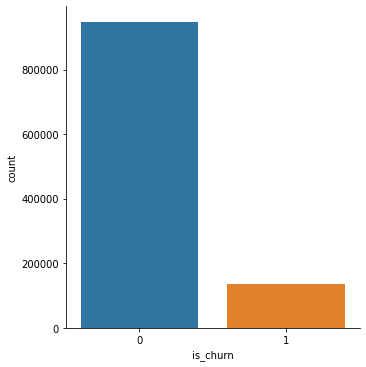

In [ ]:
sns.factorplot('is_churn', data=train_flat_file, kind='count')

In [ ]:
is_churn_0 = ((train_flat_file[train_flat_file['is_churn'] == 0].shape[0]) / (train_flat_file['is_churn'].shape[0])) * 100
is_churn_1 = ((train_flat_file[train_flat_file['is_churn'] == 1].shape[0]) / (train_flat_file['is_churn'].shape[0])) * 100
print('Number of data points equal to 0 in Y "is_churn" target:'+ '%.2f' %is_churn_0 + ' %')
print('Number of data points equal to 0 in Y "is_churn" target:'+ '%.2f' %is_churn_1 + ' %')

Number of data points equal to 0 in Y "is_churn" target:87.57 %
Number of data points equal to 0 in Y "is_churn" target:12.43 %


In [ ]:
# By looking at this plot, we can get clear picture about data imbalanceness. 

## Categorical variable analysis

In [ ]:
train_flat_file

,msno,is_churn,user_logs_count,sum_num_25,sum_num_50,sum_num_75,sum_num_985,sum_num_100,sum_num_unq,sum_total_minutes,mean_num_25,mean_num_50,mean_num_75,mean_num_985,mean_num_100,mean_num_unq,mean_total_minutes,transactions_count,payment_method_id_mode,payment_plan_days_mean,plan_list_price_mean,actual_amount_paid_mean,is_auto_renew_mode,is_cancel_mode,discount_price_mean,is_discount_mode,membership_duration_mean,amt_by_day_mean,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+
0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1,4.0,6.0,2.0,3.0,1.0,74.0,82.0,338.823733,1.500000,0.500000,0.750000,0.250000,18.500000,20.500000,84.705933,2,38,18.500000,74.500000,74.500000,0,0,0.000000,0,18.500000,2.483333,18.0,36.0,9.0,1.0,0.0,2005.0,4.0,6.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,1,15.0,56.0,12.0,11.0,26.0,670.0,641.0,2705.907467,3.733333,0.800000,0.733333,1.733333,44.666667,42.733333,180.393831,10,39,30.000000,149.200000,149.200000,1,0,0.000000,0,31.300000,4.973333,11.0,27.0,9.0,1.0,0.0,2005.0,10.0,16.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,1,61.0,526.0,165.0,151.0,142.0,1274.0,1356.0,6021.554383,8.622951,2.704918,2.475410,2.327869,20.885246,22.229508,98.714006,3,17,283.333333,645.666667,645.666667,0,0,0.000000,0,148.000000,3.109214,13.0,23.0,9.0,1.0,0.0,2005.0,11.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,1,77.0,136.0,48.0,63.0,272.0,6314.0,6600.0,28083.772183,1.766234,0.623377,0.818182,3.532468,82.000000,85.714286,364.724314,9,38,97.222222,450.333333,450.333333,0,0,0.000000,0,102.888889,4.893955,3.0,27.0,9.0,0.0,1.0,2005.0,12.0,28.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=,1,48.0,84.0,34.0,20.0,25.0,768.0,674.0,3344.093800,1.750000,0.708333,0.416667,0.520833,16.000000,14.041667,69.668621,22,33,21.818182,108.363636,149.000000,1,0,-40.636364,0,29.045455,0.000000,6.0,23.0,9.0,1.0,0.0,2006.0,3.0,31.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082185,OHnZbu+EVaP+vN7Z+OfT5OMcp90MWFZonmM0o3pb8FY=,0,57.0,123.0,39.0,16.0,22.0,644.0,629.0,2720.062950,2.157895,0.684211,0.280702,0.385965,11.298246,11.035088,47.720403,27,40,29.037037,143.481481,143.481481,1,0,0.000000,0,29.444444,0.000000,13.0,28.0,7.0,0.0,1.0,2011.0,8.0,31.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1082186,S92bDK//uI6hk3u1vuApro0qJBQOToBozZ7lL1yTC+w=,0,9.0,51.0,17.0,10.0,10.0,37.0,83.0,237.491767,5.666667,1.888889,1.111111,1.111111,4.111111,9.222222,26.387974,9,41,30.000000,99.000000,99.000000,1,0,0.000000,0,30.444444,3.300000,1.0,NaN,7.0,0.0,0.0,2011.0,9.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1082187,eUa3xo16vpAjr43Cjlb6Kjf1NTILYyJIkBayJQdXWnw=,0,4.0,0.0,0.0,1.0,0.0,397.0,358.0,1719.234533,0.000000,0.000000,0.250000,0.000000,99.250000,89.500000,429.808633,20,41,30.000000,99.000000,99.000000,1,0,0.000000,0,30.450000,3.300000,1.0,NaN,7.0,0.0,0.0,2011.0,9.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1082188,iZE41tbAQ65rJq60olkJT4BJzuUAYgQdfbEemXe/TTk=,0,63.0,142.0,36.0,28.0,26.0,836.0,875.0,3405.102850,2.253968,0.571429,0.444444,0.412698,13.269841,13.888889,54.049252,21,39,28.714286,141.904762,149.000000,1,0,-7.095238,0,42.428571,0.000000,5.0,25.0,9.0,1.0,0.0,2011.0,9.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
print('Train')
display(categorial_column_counts(df=train_flat_file,column = 'is_auto_renew_mode'))
print('test')
display(categorial_column_counts(df=test_flat_file,column = 'is_auto_renew_mode'))

Train
Column counts:is_auto_renew_mode


,counts,per,per100
1,916870,0.847236,84.7%
0,165320,0.152764,15.3%


test
Column counts:is_auto_renew_mode


,counts,per,per100
1,912942,0.847718,84.8%
0,163999,0.152282,15.2%


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


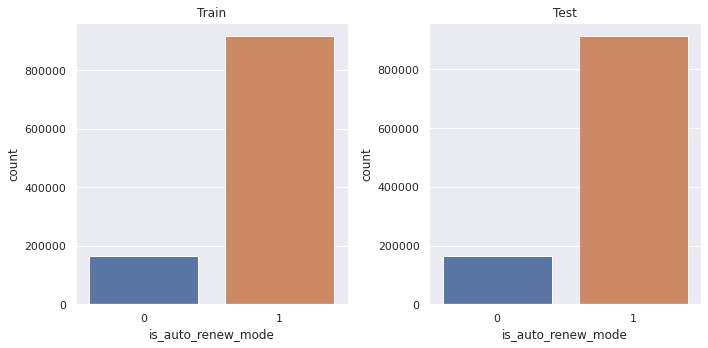

In [ ]:
plt_categorial(column='is_auto_renew_mode',train=train_flat_file,test=test_flat_file)

In [ ]:
print('\033[1m' + 'Train:\n')
display(categorial_column_counts(df=train_flat_file,column = 'is_cancel_mode'))
print('\033[1m' + '\nTest:\n')
display(categorial_column_counts(df=test_flat_file,column = 'is_cancel_mode'))
print('\033[0m')

Train:

Column counts:is_cancel_mode


,counts,per,per100
0,1082155,0.999968,100.0%
1,35,0.000032,0.0%



Test:

Column counts:is_cancel_mode


,counts,per,per100
0,1076927,0.999987,100.0%
1,14,0.000013,0.0%


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


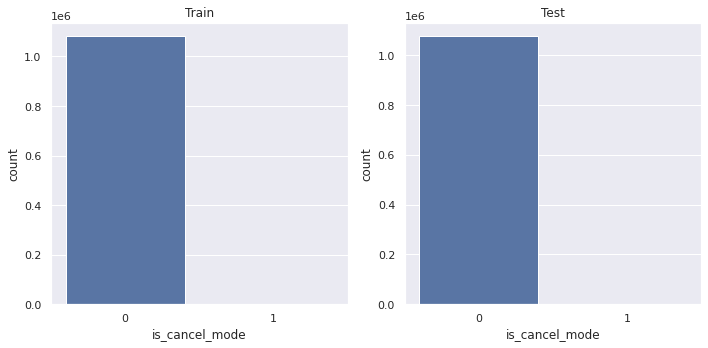

In [ ]:
plt_categorial(column='is_cancel_mode',train=train_flat_file,test=test_flat_file)

In [ ]:
print('\033[1m' + 'Train:\n')
display(categorial_column_counts(df=train_flat_file,column = 'is_discount_mode'))
print('\033[1m' + '\nTest:\n')
display(categorial_column_counts(df=test_flat_file,column = 'is_discount_mode'))
print('\033[0m')

Train:

Column counts:is_discount_mode


,counts,per,per100
0,1080916,0.998823,99.9%
1,1274,0.001177,0.1%



Test:

Column counts:is_discount_mode


,counts,per,per100
0,1074672,0.997893,99.8%
1,2269,0.002107,0.2%


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


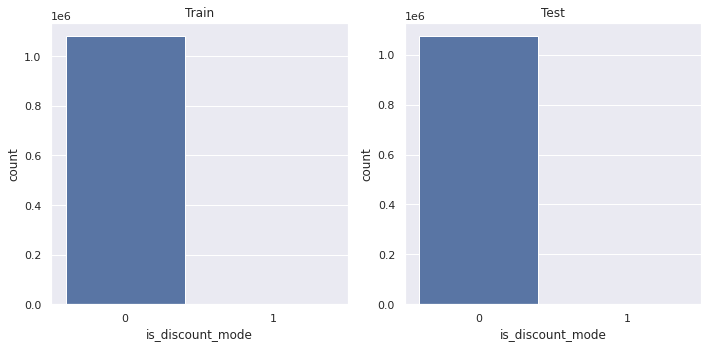

In [ ]:
plt_categorial(column='is_discount_mode',train=train_flat_file,test=test_flat_file)

In [ ]:
print('\033[1m' + 'Train:\n')
display(categorial_column_counts(df=train_flat_file,column = 'city'))
print('\033[1m' + '\nTest:\n')
display(categorial_column_counts(df=test_flat_file,column = 'city'))
print('\033[0m')

Train:

Column counts:city


,counts,per,per100
1.0,487285,0.506833,50.7%
13.0,109714,0.114115,11.4%
5.0,80406,0.083632,8.4%
4.0,53817,0.055976,5.6%
15.0,48909,0.050871,5.1%
22.0,47512,0.049418,4.9%
6.0,29475,0.030657,3.1%
14.0,22489,0.023391,2.3%
12.0,13125,0.013652,1.4%
9.0,10690,0.011119,1.1%



Test:

Column counts:city


,counts,per,per100
1.0,489977,0.512226,51.2%
13.0,108039,0.112945,11.3%
5.0,79216,0.082813,8.3%
4.0,52913,0.055316,5.5%
15.0,47827,0.049999,5.0%
22.0,46866,0.048994,4.9%
6.0,29052,0.030371,3.0%
14.0,22118,0.023122,2.3%
12.0,12888,0.013473,1.3%
9.0,10538,0.011017,1.1%


/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3704: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3710: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


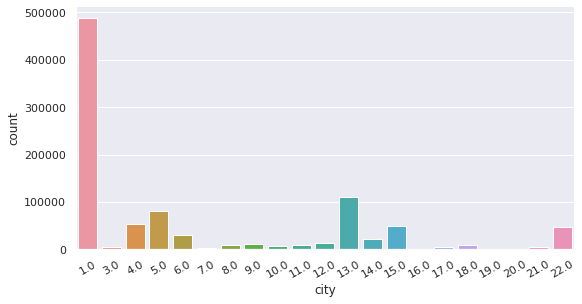

In [ ]:
# Train.city label dist:
ax = sns.factorplot('city', data=train_flat_file, kind='count',size=4, aspect = 2)
ax.set_xticklabels(rotation=30)
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3704: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3710: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


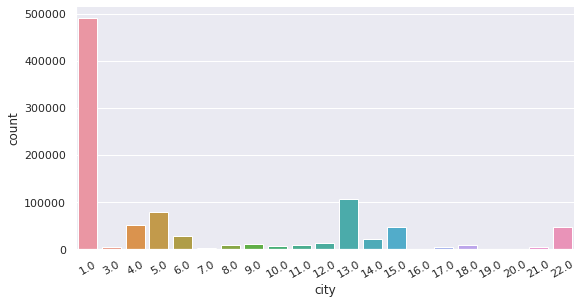

In [ ]:
# Test.city label dist:
ax = sns.factorplot('city', data=test_flat_file, kind='count',size=4, aspect = 2)
ax.set_xticklabels(rotation=30)
plt.show()

In [ ]:
print('\033[1m' + 'Train:\n')
display(categorial_column_counts(df=train_flat_file,column = 'registered_via'))
print('\033[1m' + '\nTest:\n')
display(categorial_column_counts(df=test_flat_file,column = 'registered_via'))
print('\033[0m')

Train:

Column counts:registered_via


,counts,per,per100
7.0,500653,0.520737,52.1%
9.0,267049,0.277762,27.8%
3.0,125687,0.130729,13.1%
4.0,64349,0.066930,6.7%
13.0,3693,0.003841,0.4%



Test:

Column counts:registered_via


,counts,per,per100
7.0,500531,0.523259,52.3%
9.0,262341,0.274253,27.4%
3.0,124115,0.129751,13.0%
4.0,65431,0.068402,6.8%
13.0,4147,0.004335,0.4%


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


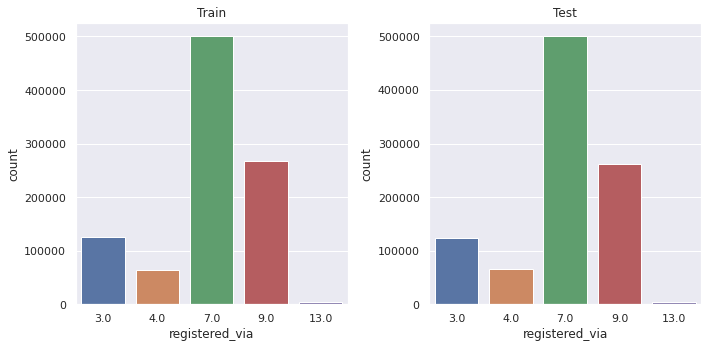

In [ ]:
plt_categorial(column='registered_via',train=train_flat_file,test=test_flat_file)

[Text(0, 0.5, '65+')]

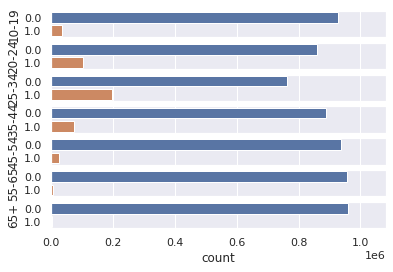

<Figure size 576x288 with 0 Axes>

In [ ]:
# sns.countplot(train_flat_file.loc[:, train_flat_file.columns.isin(['Age_10-19,','Age_20-24','Age_25-34','Age_35-44','Age_45-54','Age_55-65','Age_65+'])])
sns.set(style="darkgrid")
fig, ax =plt.subplots(7,1)
max_count = max([max(train_flat_file[i].value_counts()) for i in train_flat_file.columns])
plt.figure(figsize=(8,4))
A=sns.countplot(y=train_flat_file['Age_10-19,'],ax=ax[0],order=train_flat_file['Age_10-19,'].value_counts().iloc[:2].index)
B=sns.countplot(y=train_flat_file['Age_20-24'],ax=ax[1],order=train_flat_file['Age_20-24'].value_counts().iloc[:2].index)
C=sns.countplot(y=train_flat_file['Age_25-34'],ax=ax[2],order=train_flat_file['Age_25-34'].value_counts().iloc[:2].index)
D=sns.countplot(y=train_flat_file['Age_35-44'],ax=ax[3],order=train_flat_file['Age_35-44'].value_counts().iloc[:2].index)
E=sns.countplot(y=train_flat_file['Age_45-54'],ax=ax[4],order=train_flat_file['Age_45-54'].value_counts().iloc[:2].index)
F=sns.countplot(y=train_flat_file['Age_55-65'],ax=ax[5],order=train_flat_file['Age_55-65'].value_counts().iloc[:2].index)
G=sns.countplot(y=train_flat_file['Age_65+'],ax=ax[6],order=train_flat_file['Age_65+'].value_counts().iloc[:2].index)


ax[0].set_xlim(0,max_count)
ax[1].set_xlim(0,max_count)
ax[2].set_xlim(0,max_count)
ax[3].set_xlim(0,max_count)
ax[4].set_xlim(0,max_count)
ax[5].set_xlim(0,max_count)
ax[6].set_xlim(0,max_count)

A.set(xticklabels=[],ylabel='10-19')
B.set(xticklabels=[],ylabel='20-24')
C.set(xticklabels=[],ylabel='25-34')
D.set(xticklabels=[],ylabel='35-44')
E.set(xticklabels=[],ylabel='45-54')
F.set(xticklabels=[],ylabel='55-65')
G.set(ylabel='65+')

## Numerical variable analysis

## Correlations

In [ ]:
train_flat_file

,msno,is_churn,user_logs_count,sum_num_25,sum_num_50,sum_num_75,sum_num_985,sum_num_100,sum_num_unq,sum_total_minutes,mean_num_25,mean_num_50,mean_num_75,mean_num_985,mean_num_100,mean_num_unq,mean_total_minutes,transactions_count,payment_method_id_mode,payment_plan_days_mean,plan_list_price_mean,actual_amount_paid_mean,is_auto_renew_mode,is_cancel_mode,discount_price_mean,is_discount_mode,membership_duration_mean,amt_by_day_mean,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+
0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1,4.0,6.0,2.0,3.0,1.0,74.0,82.0,338.823733,1.500000,0.500000,0.750000,0.250000,18.500000,20.500000,84.705933,2,38,18.500000,74.500000,74.500000,0,0,0.000000,0,18.500000,2.483333,18.0,36.0,9.0,1.0,0.0,2005.0,4.0,6.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,1,15.0,56.0,12.0,11.0,26.0,670.0,641.0,2705.907467,3.733333,0.800000,0.733333,1.733333,44.666667,42.733333,180.393831,10,39,30.000000,149.200000,149.200000,1,0,0.000000,0,31.300000,4.973333,11.0,27.0,9.0,1.0,0.0,2005.0,10.0,16.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,1,61.0,526.0,165.0,151.0,142.0,1274.0,1356.0,6021.554383,8.622951,2.704918,2.475410,2.327869,20.885246,22.229508,98.714006,3,17,283.333333,645.666667,645.666667,0,0,0.000000,0,148.000000,3.109214,13.0,23.0,9.0,1.0,0.0,2005.0,11.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,1,77.0,136.0,48.0,63.0,272.0,6314.0,6600.0,28083.772183,1.766234,0.623377,0.818182,3.532468,82.000000,85.714286,364.724314,9,38,97.222222,450.333333,450.333333,0,0,0.000000,0,102.888889,4.893955,3.0,27.0,9.0,0.0,1.0,2005.0,12.0,28.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=,1,48.0,84.0,34.0,20.0,25.0,768.0,674.0,3344.093800,1.750000,0.708333,0.416667,0.520833,16.000000,14.041667,69.668621,22,33,21.818182,108.363636,149.000000,1,0,-40.636364,0,29.045455,0.000000,6.0,23.0,9.0,1.0,0.0,2006.0,3.0,31.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082185,OHnZbu+EVaP+vN7Z+OfT5OMcp90MWFZonmM0o3pb8FY=,0,57.0,123.0,39.0,16.0,22.0,644.0,629.0,2720.062950,2.157895,0.684211,0.280702,0.385965,11.298246,11.035088,47.720403,27,40,29.037037,143.481481,143.481481,1,0,0.000000,0,29.444444,0.000000,13.0,28.0,7.0,0.0,1.0,2011.0,8.0,31.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1082186,S92bDK//uI6hk3u1vuApro0qJBQOToBozZ7lL1yTC+w=,0,9.0,51.0,17.0,10.0,10.0,37.0,83.0,237.491767,5.666667,1.888889,1.111111,1.111111,4.111111,9.222222,26.387974,9,41,30.000000,99.000000,99.000000,1,0,0.000000,0,30.444444,3.300000,1.0,NaN,7.0,0.0,0.0,2011.0,9.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1082187,eUa3xo16vpAjr43Cjlb6Kjf1NTILYyJIkBayJQdXWnw=,0,4.0,0.0,0.0,1.0,0.0,397.0,358.0,1719.234533,0.000000,0.000000,0.250000,0.000000,99.250000,89.500000,429.808633,20,41,30.000000,99.000000,99.000000,1,0,0.000000,0,30.450000,3.300000,1.0,NaN,7.0,0.0,0.0,2011.0,9.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1082188,iZE41tbAQ65rJq60olkJT4BJzuUAYgQdfbEemXe/TTk=,0,63.0,142.0,36.0,28.0,26.0,836.0,875.0,3405.102850,2.253968,0.571429,0.444444,0.412698,13.269841,13.888889,54.049252,21,39,28.714286,141.904762,149.000000,1,0,-7.095238,0,42.428571,0.000000,5.0,25.0,9.0,1.0,0.0,2011.0,9.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
num_cols = ["user_logs_count","sum_num_25","sum_num_50","sum_num_75","sum_num_985","sum_num_100","sum_num_unq",
            "sum_total_minutes","mean_num_25","mean_num_50","mean_num_75","mean_num_985","mean_num_100","mean_num_unq",
            "mean_total_minutes","transactions_count","payment_method_id_mode","payment_plan_days_mean","plan_list_price_mean",
            "actual_amount_paid_mean","discount_price_mean","membership_duration_mean","amt_by_day_mean",
            "registration_init_time_Month","registration_init_time_Day"]

In [ ]:
train_num = train_flat_file[num_cols]


### Pairwise correlation

In [ ]:
# Calculate the pairwise Spearman correlation
corr = pg.pairwise_corr(train_flat_file, columns=num_cols, method='spearman')
# Sort the correlation by p-values and display the first rows
corr.sort_values(by=['p-unc'])[['X', 'Y', 'n', 'r', 'p-unc']]

,X,Y,n,r,p-unc
0,user_logs_count,sum_num_25,902177,0.766493,0.000000
159,sum_total_minutes,discount_price_mean,902177,-0.207309,0.000000
160,sum_total_minutes,membership_duration_mean,902177,0.145422,0.000000
161,sum_total_minutes,amt_by_day_mean,902177,-0.115614,0.000000
164,mean_num_25,mean_num_50,902177,0.744019,0.000000
...,...,...,...,...,...
243,mean_num_unq,registration_init_time_Month,902147,-0.001361,0.196082
220,mean_num_985,registration_init_time_Month,902147,-0.001331,0.206213
284,plan_list_price_mean,registration_init_time_Day,961431,-0.001113,0.275198
187,mean_num_50,payment_plan_days_mean,902177,0.001101,0.295848


In [ ]:
higher_corr = corr[(corr['r'] >= 0.7) ]
higher_corr

,X,Y,method,tail,n,r,CI95%,r2,adj_r2,z,p-unc,power
0,user_logs_count,sum_num_25,spearman,two-sided,902177,0.766493,"[0.77, 0.77]",0.587511,0.587510,1.011769,0.0,1.0
1,user_logs_count,sum_num_50,spearman,two-sided,902177,0.780465,"[0.78, 0.78]",0.609126,0.609125,1.046559,0.0,1.0
2,user_logs_count,sum_num_75,spearman,two-sided,902177,0.815343,"[0.81, 0.82]",0.664784,0.664784,1.142765,0.0,1.0
3,user_logs_count,sum_num_985,spearman,two-sided,902177,0.813713,"[0.81, 0.81]",0.662129,0.662128,1.137921,0.0,1.0
4,user_logs_count,sum_num_100,spearman,two-sided,902177,0.857615,"[0.86, 0.86]",0.735504,0.735503,1.284258,0.0,1.0
5,user_logs_count,sum_num_unq,spearman,two-sided,902177,0.877465,"[0.88, 0.88]",0.769945,0.769944,1.364641,0.0,1.0
6,user_logs_count,sum_total_minutes,spearman,two-sided,902177,0.870124,"[0.87, 0.87]",0.757116,0.757115,1.333590,0.0,1.0
24,sum_num_25,sum_num_50,spearman,two-sided,902177,0.898394,"[0.9, 0.9]",0.807112,0.807111,1.463830,0.0,1.0
25,sum_num_25,sum_num_75,spearman,two-sided,902177,0.886838,"[0.89, 0.89]",0.786481,0.786480,1.406916,0.0,1.0
26,sum_num_25,sum_num_985,spearman,two-sided,902177,0.853757,"[0.85, 0.85]",0.728900,0.728900,1.269849,0.0,1.0


In [ ]:
# Calculate the Pearson correlation between "is_churn" and the personality dimensions
corr = pg.pairwise_corr(train_flat_file, columns=[["is_churn"], num_cols], method='pearson')
corr.sort_values(by=['p-unc'])[['X', 'Y', 'n', 'r', 'p-unc']]

,X,Y,n,r,p-unc
0,is_churn,user_logs_count,902177,-0.101848,0.000000e+00
18,is_churn,plan_list_price_mean,1082190,0.327220,0.000000e+00
17,is_churn,payment_plan_days_mean,1082190,0.322725,0.000000e+00
16,is_churn,payment_method_id_mode,1082190,-0.232550,0.000000e+00
15,is_churn,transactions_count,1082190,-0.206766,0.000000e+00
21,is_churn,membership_duration_mean,1082190,0.168765,0.000000e+00
19,is_churn,actual_amount_paid_mean,1082190,0.322710,0.000000e+00
20,is_churn,discount_price_mean,1082190,0.058821,0.000000e+00
6,is_churn,sum_num_unq,902177,-0.043437,0.000000e+00
5,is_churn,sum_num_100,902177,-0.040943,0.000000e+00


### Correlation Matrix

In [ ]:
train_flat_file.corr().round(2)

,is_churn,user_logs_count,sum_num_25,sum_num_50,sum_num_75,sum_num_985,sum_num_100,sum_num_unq,sum_total_minutes,mean_num_25,mean_num_50,mean_num_75,mean_num_985,mean_num_100,mean_num_unq,mean_total_minutes,transactions_count,payment_method_id_mode,payment_plan_days_mean,plan_list_price_mean,actual_amount_paid_mean,is_auto_renew_mode,is_cancel_mode,discount_price_mean,is_discount_mode,membership_duration_mean,amt_by_day_mean,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+
is_churn,1.00,-0.10,-0.03,-0.03,-0.03,-0.03,-0.04,-0.04,0.00,0.03,0.04,0.04,0.03,0.01,0.03,0.00,-0.21,-0.23,0.32,0.33,0.32,-0.41,0.01,0.06,0.03,0.17,0.10,0.09,-0.10,-0.09,0.07,0.08,0.01,-0.02,-0.00,0.11,0.09,0.03,0.01,-0.00,-0.00,0.01
user_logs_count,-0.10,1.00,0.52,0.58,0.63,0.49,0.62,0.72,0.00,0.14,0.13,0.21,0.20,0.32,0.36,0.00,0.43,-0.06,0.06,0.10,0.11,-0.01,-0.00,-0.16,-0.02,0.06,-0.28,0.24,-0.06,0.08,0.16,0.17,-0.31,-0.00,-0.00,0.02,0.14,0.19,0.03,0.04,0.00,-0.00
sum_num_25,-0.03,0.52,1.00,0.70,0.70,0.49,0.31,0.55,0.00,0.75,0.41,0.46,0.34,0.15,0.41,-0.00,0.16,-0.05,0.03,0.05,0.05,-0.08,-0.00,-0.06,-0.01,0.02,-0.09,0.11,-0.13,0.01,0.08,0.08,-0.10,-0.00,-0.00,0.07,0.12,0.06,-0.04,0.01,-0.00,-0.00
sum_num_50,-0.03,0.58,0.70,1.00,0.90,0.58,0.38,0.57,0.00,0.45,0.68,0.65,0.40,0.20,0.40,0.00,0.18,-0.07,0.04,0.06,0.07,-0.09,-0.00,-0.08,-0.01,0.03,-0.11,0.15,-0.13,0.02,0.10,0.10,-0.13,-0.00,-0.00,0.08,0.15,0.08,-0.03,0.02,-0.00,-0.00
sum_num_75,-0.03,0.63,0.70,0.90,1.00,0.67,0.43,0.61,0.00,0.42,0.54,0.72,0.47,0.23,0.40,0.00,0.20,-0.06,0.04,0.06,0.07,-0.08,-0.00,-0.08,-0.01,0.03,-0.12,0.15,-0.12,0.02,0.09,0.12,-0.14,-0.00,-0.00,0.06,0.14,0.09,-0.03,0.02,-0.00,-0.00
sum_num_985,-0.03,0.49,0.49,0.58,0.67,1.00,0.39,0.52,0.00,0.28,0.30,0.44,0.84,0.24,0.36,-0.00,0.16,-0.05,0.03,0.05,0.05,-0.05,-0.00,-0.07,-0.01,0.02,-0.10,0.13,-0.09,0.02,0.07,0.10,-0.12,-0.00,-0.00,0.04,0.11,0.08,-0.02,0.01,-0.00,-0.00
sum_num_100,-0.04,0.62,0.31,0.38,0.43,0.39,1.00,0.88,-0.00,0.08,0.09,0.16,0.20,0.85,0.71,-0.00,0.21,-0.08,0.05,0.07,0.08,-0.02,-0.00,-0.10,-0.01,0.04,-0.15,0.18,-0.01,0.05,0.12,0.13,-0.19,-0.00,-0.00,0.00,0.08,0.15,0.05,0.02,0.00,0.00
sum_num_unq,-0.04,0.72,0.55,0.57,0.61,0.52,0.88,1.00,0.00,0.27,0.23,0.30,0.30,0.68,0.81,-0.00,0.25,-0.08,0.06,0.08,0.09,-0.04,-0.00,-0.11,-0.01,0.04,-0.17,0.20,-0.06,0.04,0.13,0.14,-0.20,-0.00,-0.00,0.02,0.12,0.16,0.02,0.02,0.00,-0.00
sum_total_minutes,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,1.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.83,0.00,-0.00,0.01,0.01,0.01,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00
mean_num_25,0.03,0.14,0.75,0.45,0.42,0.28,0.08,0.27,-0.00,1.00,0.52,0.51,0.32,0.05,0.40,-0.00,-0.04,-0.05,0.01,0.02,0.02,-0.10,0.00,0.01,0.00,-0.00,0.04,0.02,-0.15,-0.04,0.02,0.02,0.04,-0.00,-0.00,0.09,0.07,-0.01,-0.06,-0.01,-0.01,0.00


Text(0.5, 1.0, 'Correlation matrix')

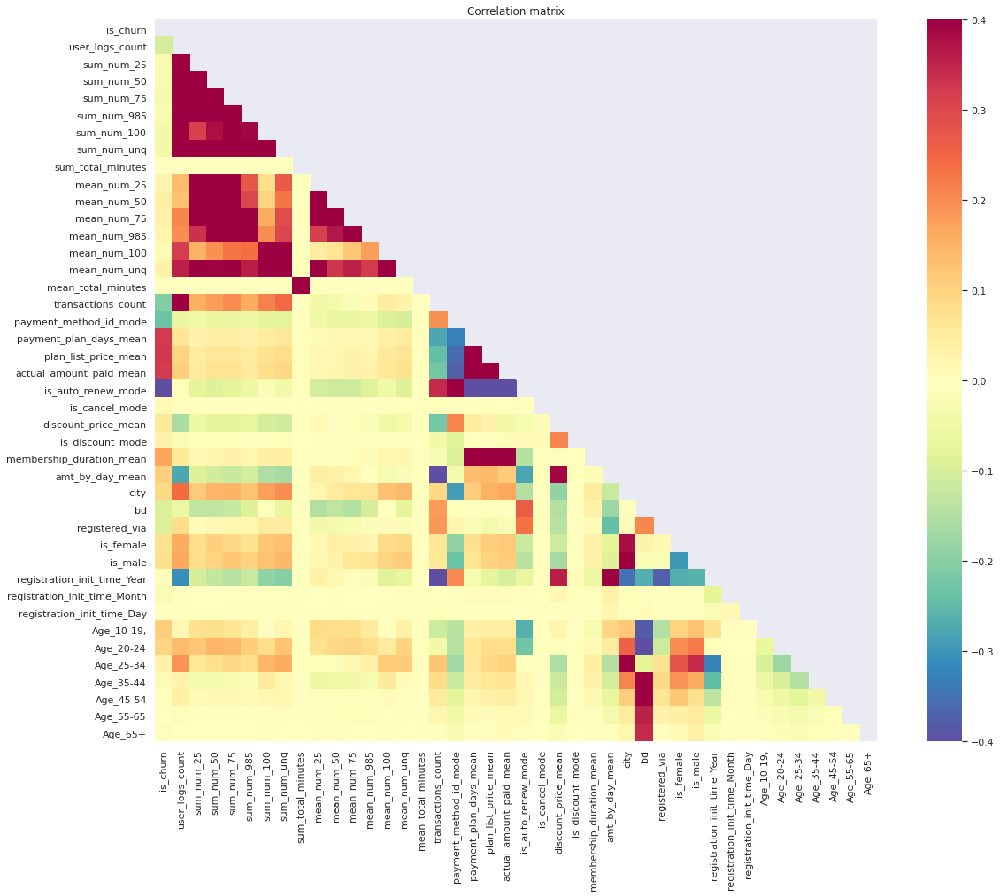

In [ ]:
corrs = train_flat_file.corr()
mask = np.zeros_like(corrs)
mask[np.triu_indices_from(mask)] = True
plt.subplots(figsize=(20,15))
sns.heatmap(corrs, cmap='Spectral_r', mask=mask, square=True, vmin=-.4, vmax=.4)
plt.title('Correlation matrix')

## Outliers

### Numerical Variable Analysis + Find Out Outliers

In [ ]:
numeric_col = ["user_logs_count","sum_num_25","sum_num_50","sum_num_75","sum_num_985","sum_num_100","sum_num_unq",
            "sum_total_minutes","mean_num_25","mean_num_50","mean_num_75","mean_num_985","mean_num_100","mean_num_unq",
            "mean_total_minutes","transactions_count","payment_method_id_mode","payment_plan_days_mean","plan_list_price_mean",
            "actual_amount_paid_mean","discount_price_mean","membership_duration_mean","amt_by_day_mean",
            "registration_init_time_Month","registration_init_time_Day"]

In [ ]:
outliers_cols = []
for name in numeric_col: 
  print(name + ": %s" %len(find_outliers(train_flat_file[name])))
  if (len(find_outliers(train_flat_file[name])) > 0) :
    outliers_cols.append(name)

user_logs_count: 0
sum_num_25: 66084
sum_num_50: 61068
sum_num_75: 56203
sum_num_985: 62101
sum_num_100: 58786
sum_num_unq: 48514
sum_total_minutes: 56216
mean_num_25: 56823
mean_num_50: 55561
mean_num_75: 46400
mean_num_985: 52243
mean_num_100: 60313
mean_num_unq: 46480
mean_total_minutes: 58906
transactions_count: 620
payment_method_id_mode: 98881
payment_plan_days_mean: 165937
plan_list_price_mean: 60620
actual_amount_paid_mean: 61634
discount_price_mean: 106023
membership_duration_mean: 255037
amt_by_day_mean: 0
registration_init_time_Month: 0
registration_init_time_Day: 0


In [ ]:
outliers_cols

['sum_num_25',
 'sum_num_50',
 'sum_num_75',
 'sum_num_985',
 'sum_num_100',
 'sum_num_unq',
 'sum_total_minutes',
 'mean_num_25',
 'mean_num_50',
 'mean_num_75',
 'mean_num_985',
 'mean_num_100',
 'mean_num_unq',
 'mean_total_minutes',
 'transactions_count',
 'payment_method_id_mode',
 'payment_plan_days_mean',
 'plan_list_price_mean',
 'actual_amount_paid_mean',
 'discount_price_mean',
 'membership_duration_mean']

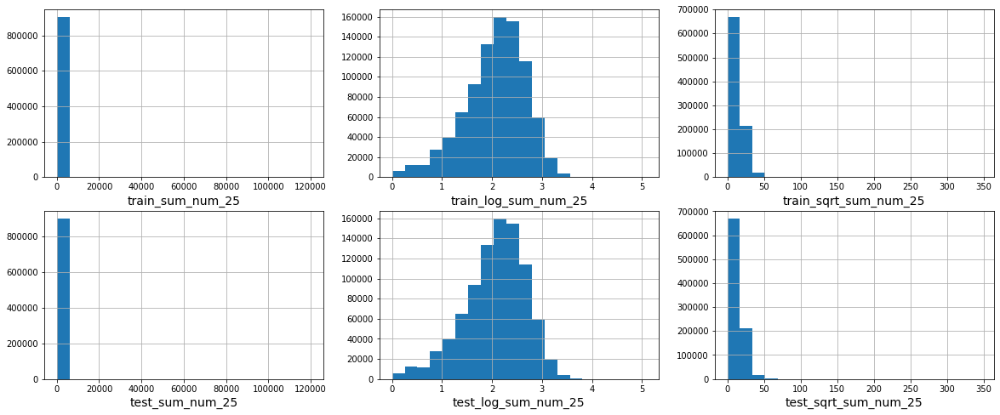

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='sum_num_25')   

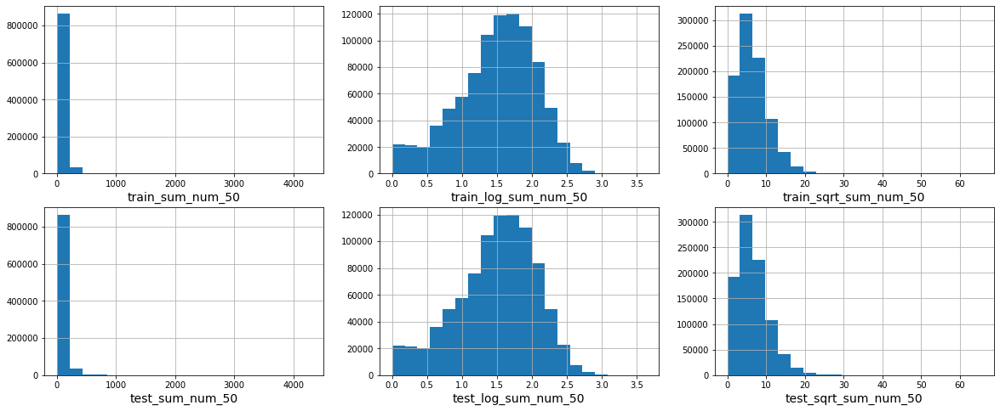

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='sum_num_50')

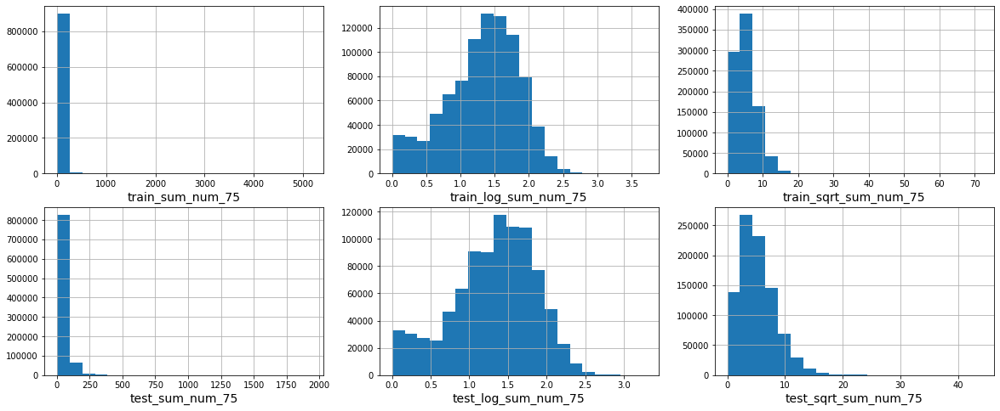

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='sum_num_75')

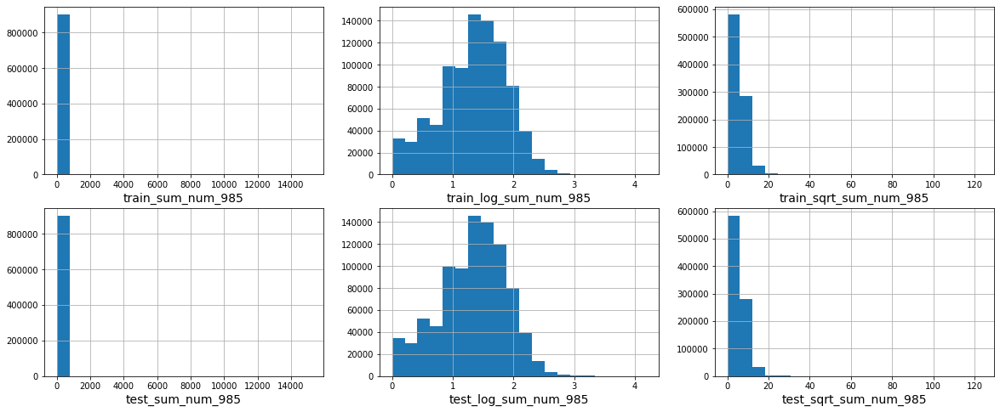

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='sum_num_985')

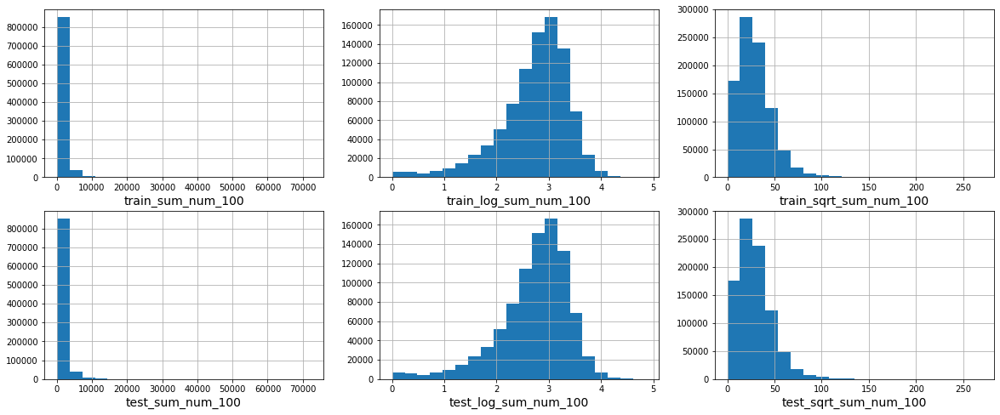

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='sum_num_100')

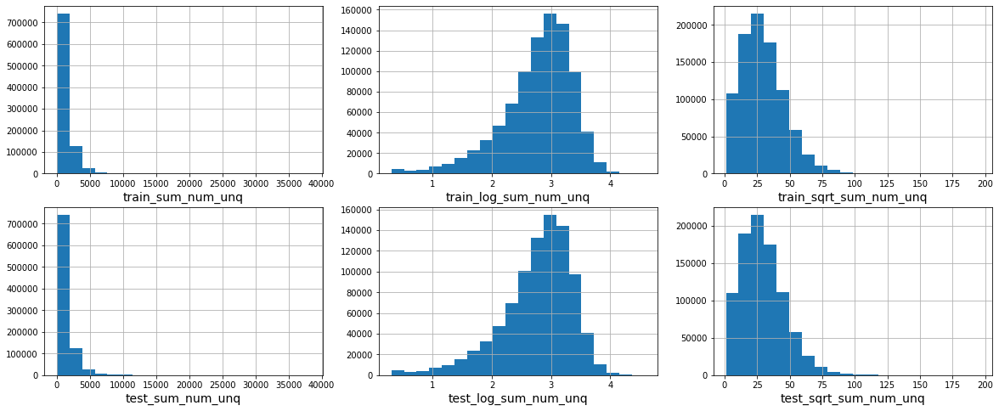

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='sum_num_unq')

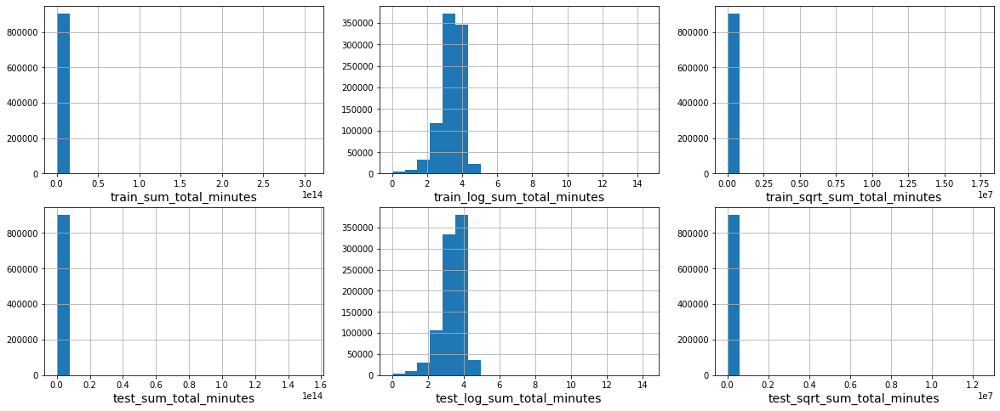

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='sum_total_minutes')

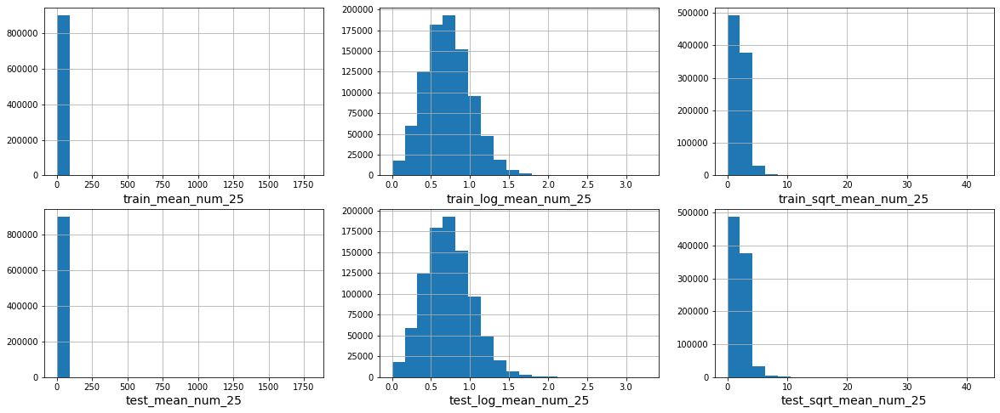

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='mean_num_25')

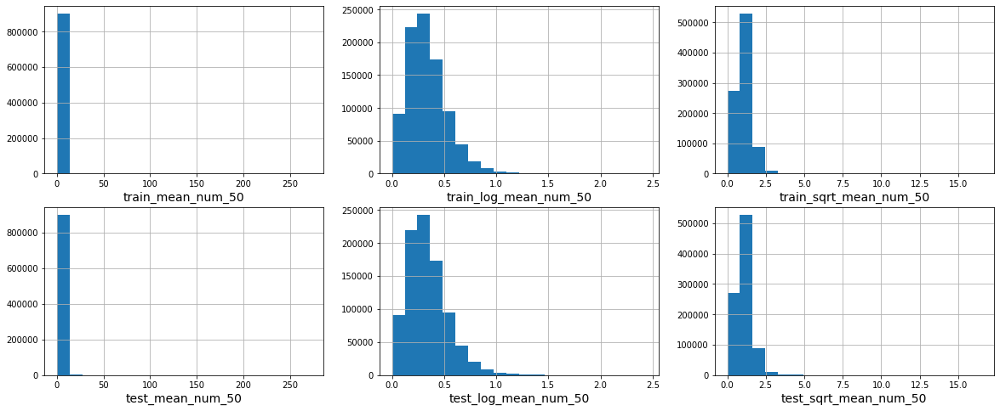

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='mean_num_50')

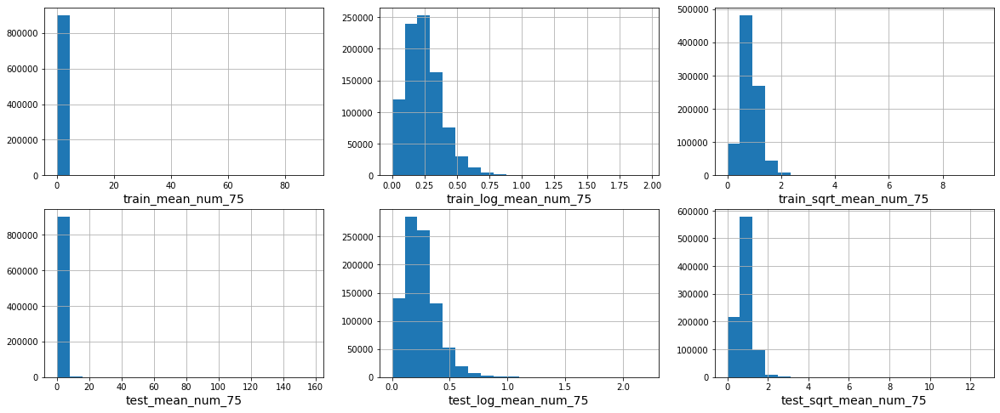

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='mean_num_75')

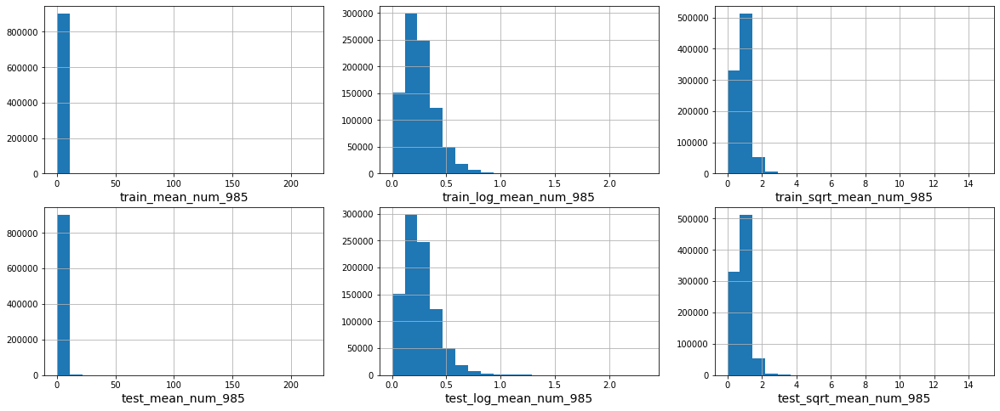

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='mean_num_985')

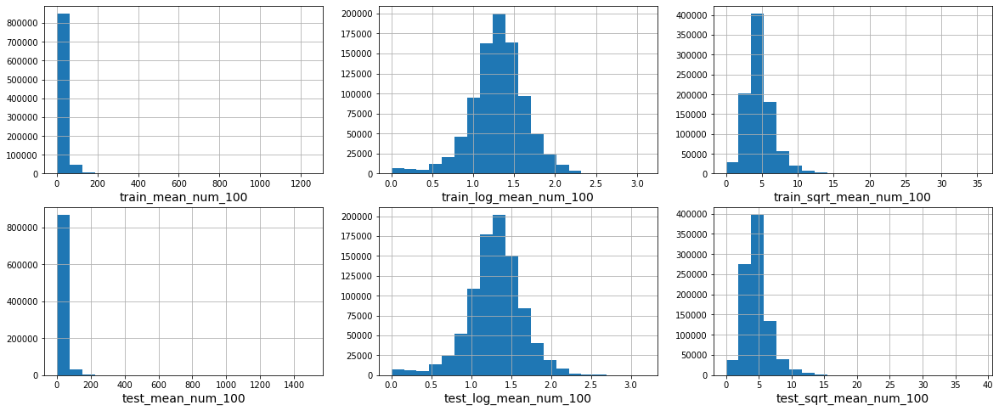

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='mean_num_100')

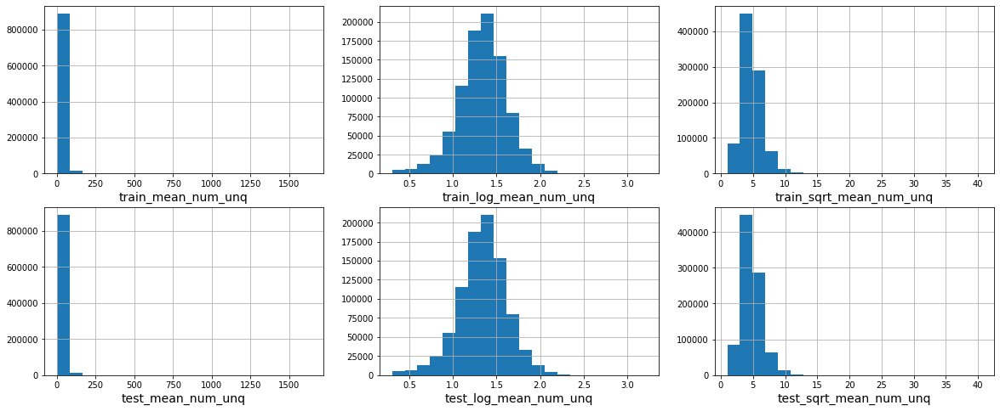

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='mean_num_unq')

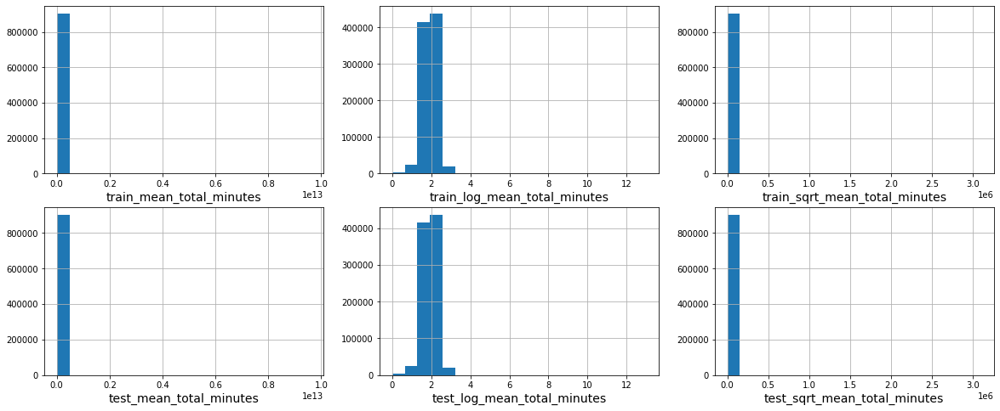

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='mean_total_minutes')

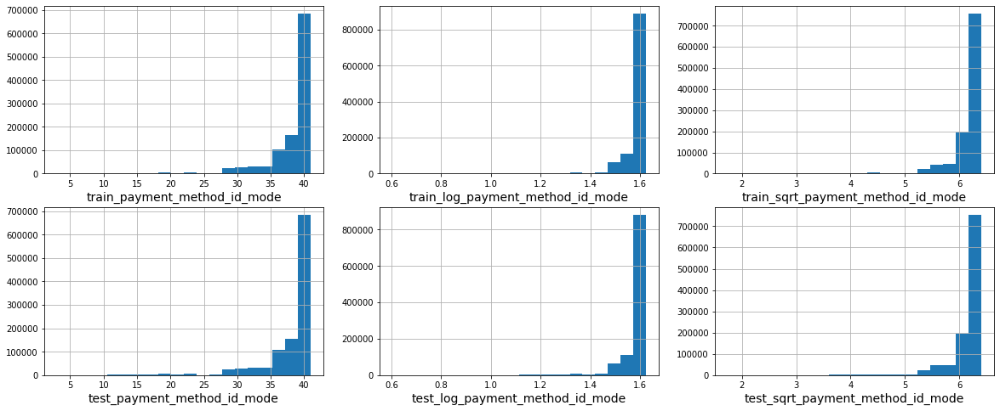

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='payment_method_id_mode')

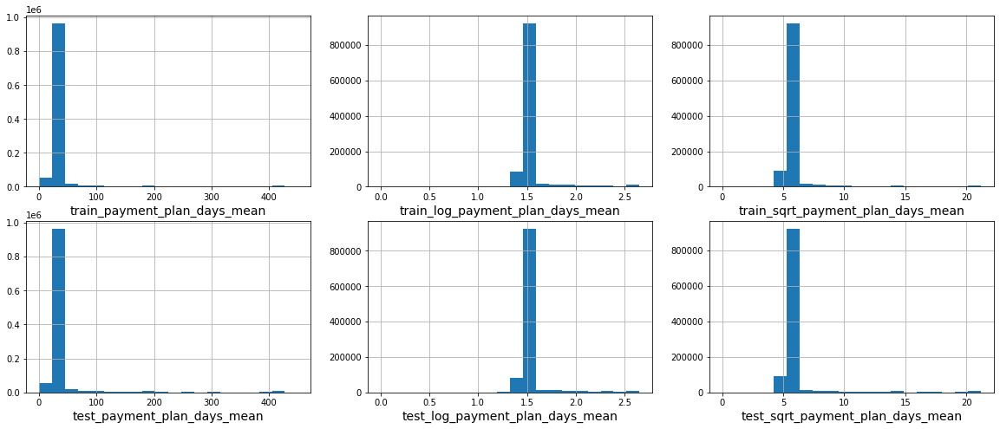

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='payment_plan_days_mean')

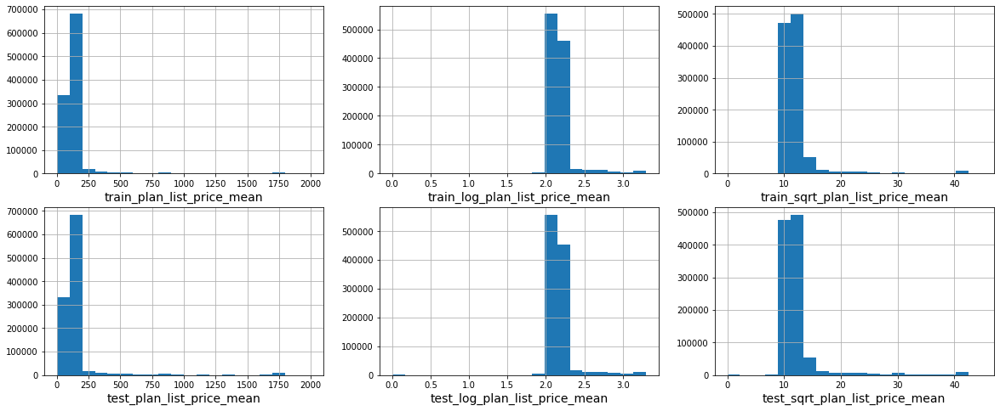

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='plan_list_price_mean')

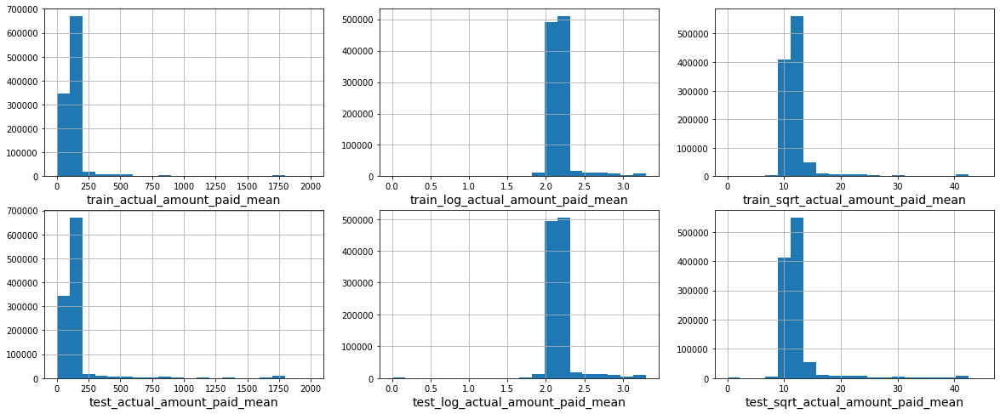

In [ ]:
plt_numerical_col_vs_log_or_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='actual_amount_paid_mean')

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


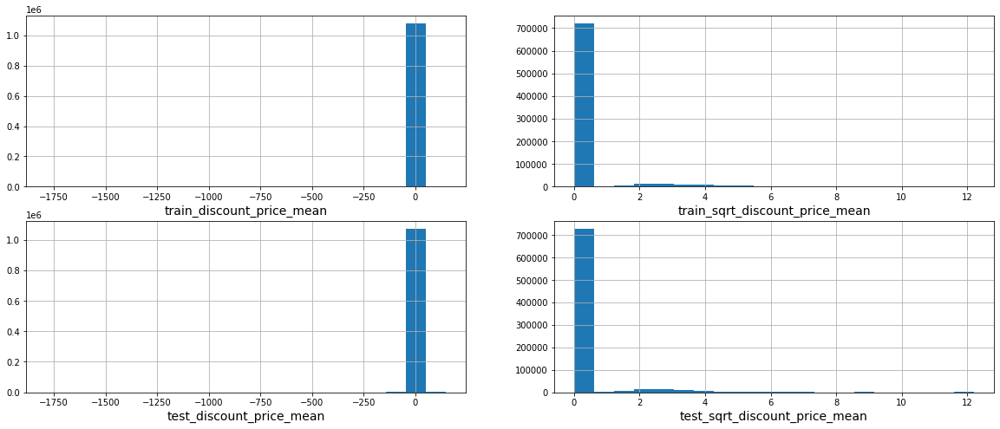

In [ ]:
plt_numerical_col_vs_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='discount_price_mean')

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


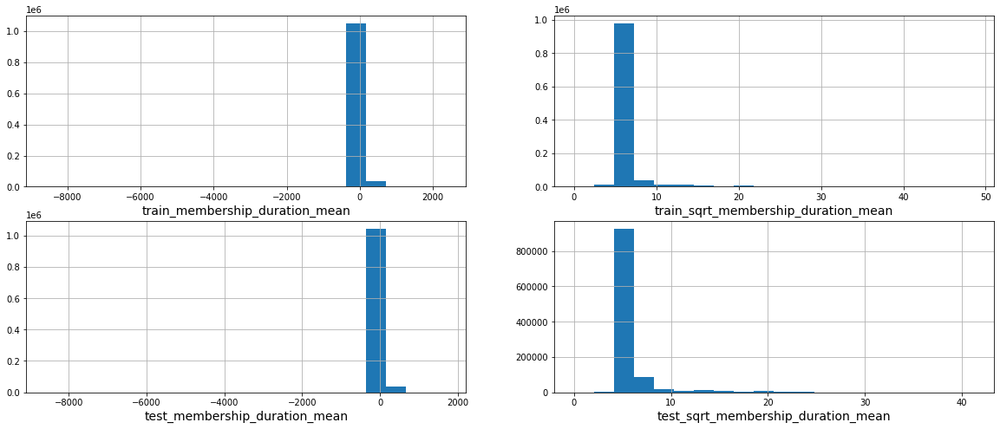

In [ ]:
plt_numerical_col_vs_sqrt(train=train_flat_file,test=test_flat_file,numerical_column='membership_duration_mean')

In [ ]:
train_flat_file_v1 = train_flat_file.copy()

In [ ]:
test_flat_file_v1 = test_flat_file.copy()

In [ ]:
# Feature engineering city column with bin encoding technic
train_flat_file_v1['city'].value_counts()

1.0     487285
13.0    109714
5.0      80406
4.0      53817
15.0     48909
22.0     47512
6.0      29475
14.0     22489
12.0     13125
9.0      10690
11.0     10262
18.0      8807
8.0       8713
10.0      7405
17.0      6112
21.0      6039
3.0       5737
7.0       2959
16.0      1058
20.0       764
19.0       153
Name: city, dtype: int64

In [ ]:
# Frequency encoding using value_counts function 
city_freq_prcnt_train = train_flat_file_v1['city'].value_counts(normalize=True)*100
city_freq_prcnt_test = test_flat_file_v1['city'].value_counts(normalize=True)*100

# Mapping the encoded values with original data 
train_flat_file_v1['city_freq_prcnt'] = train_flat_file_v1['city'].apply(lambda x : city_freq_prcnt_train[x] if pd.notnull(x) else x)
test_flat_file_v1['city_freq_prcnt'] = test_flat_file_v1['city'].apply(lambda x : city_freq_prcnt_test[x] if pd.notnull(x) else x)

In [ ]:
# Based on the comparison histograms , decided to transform most of columns to log dist. 
# Removed 'discount_price_mean' and 'membership_duration_mean' from outliers_cols list since they contains negative values.

# items to be removed 
unwanted_cols = {'discount_price_mean', 'membership_duration_mean'}  
outliers_cols = [ele for ele in outliers_cols if ele not in unwanted_cols] 

log_transformation(train=train_flat_file_v1,test=test_flat_file_v1,columns=outliers_cols)

train:


,msno,is_churn,user_logs_count,is_auto_renew_mode,is_cancel_mode,discount_price_mean,is_discount_mode,membership_duration_mean,amt_by_day_mean,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,log_transactions_count,log_payment_method_id_mode,log_payment_plan_days_mean,log_plan_list_price_mean,log_actual_amount_paid_mean
0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1,4.0,0,0,0.000000,0,18.500000,2.483333,18.0,36.0,9.0,1.0,0.0,2005.0,4.0,6.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.845098,0.477121,0.602060,0.301030,1.875061,1.919078,2.531254,0.397940,0.176091,0.243038,0.096910,1.290035,1.332438,1.933011,0.477121,1.591065,1.290035,1.877947,1.877947
1,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,1,15.0,1,0,0.000000,0,31.300000,4.973333,11.0,27.0,9.0,1.0,0.0,2005.0,10.0,16.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.755875,1.113943,1.079181,1.431364,2.826723,2.807535,3.432473,0.675167,0.255273,0.238882,0.436693,1.659599,1.640813,2.258623,1.041393,1.602060,1.491362,2.176670,2.176670
2,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,1,61.0,0,0,0.000000,0,148.000000,3.109214,13.0,23.0,9.0,1.0,0.0,2005.0,11.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.721811,2.220108,2.181844,2.155336,3.105510,3.132580,3.779781,0.983308,0.568779,0.541006,0.522166,1.340151,1.366040,1.998756,0.602060,1.255273,2.453828,2.810680,2.810680
3,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,1,77.0,0,0,0.000000,0,102.888889,4.893955,3.0,27.0,9.0,0.0,1.0,2005.0,12.0,28.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.136721,1.690196,1.806180,2.436163,3.800373,3.819610,4.448471,0.441889,0.210419,0.259637,0.656335,1.919078,1.938091,2.563154,1.000000,1.591065,1.992210,2.654497,2.654497
4,GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=,1,48.0,1,0,-40.636364,0,29.045455,0.000000,6.0,23.0,9.0,1.0,0.0,2006.0,3.0,31.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.929419,1.544068,1.322219,1.414973,2.885926,2.829304,3.524408,0.439333,0.232573,0.151268,0.182082,1.230449,1.177296,1.849227,1.361728,1.531479,1.358281,2.038873,2.176091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082185,OHnZbu+EVaP+vN7Z+OfT5OMcp90MWFZonmM0o3pb8FY=,0,57.0,1,0,0.000000,0,29.444444,0.000000,13.0,28.0,7.0,0.0,1.0,2011.0,8.0,31.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.093422,1.602060,1.230449,1.361728,2.809560,2.799341,3.434739,0.499398,0.226396,0.107448,0.141752,1.089843,1.080449,1.687711,1.447158,1.612784,1.477657,2.159812,2.159812
1082186,S92bDK//uI6hk3u1vuApro0qJBQOToBozZ7lL1yTC+w=,0,9.0,1,0,0.000000,0,30.444444,3.300000,1.0,NaN,7.0,0.0,0.0,2011.0,9.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.716003,1.255273,1.041393,1.041393,1.579784,1.924279,2.377473,0.823909,0.460731,0.324511,0.324511,0.708515,1.009545,1.437560,1.000000,1.623249,1.491362,2.000000,2.000000
1082187,eUa3xo16vpAjr43Cjlb6Kjf1NTILYyJIkBayJQdXWnw=,0,4.0,1,0,0.000000,0,30.450000,3.300000,1.0,NaN,7.0,0.0,0.0,2011.0,9.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.301030,0.000000,2.599883,2.555094,3.235588,0.000000,0.000000,0.096910,0.000000,2.001084,1.956649,2.634284,1.322219,1.623249,1.491362,2.000000,2.000000
1082188,iZE41tbAQ65rJq60olkJT4BJzuUAYgQdfbEemXe/TTk=,0,63.0,1,0,-7.095238,0,42.428571,0.000000,5.0,25.0,9.0,1.0,0.0,2011.0,9.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.155336,1.568202,1.462398,1.431364,2.922725,2.942504,3.532258,0.512413,0.196295,0.159701,0.150049,1.154419,1.172862,1.740751,1.342423,1.602060,1.472965,2.155047,2.176091


test:


,msno,is_churn,user_logs_count,is_auto_renew_mode,is_cancel_mode,discount_price_mean,is_discount_mode,membership_duration_mean,amt_by_day_mean,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,log_transactions_count,log_payment_method_id_mode,log_payment_plan_days_mean,log_plan_list_price_mean,log_actual_amount_paid_mean
0,ugx0CjOMzazClkFzU2xasmDZaoIqOUAZPsH1q0teWCg=,0,15.0,1,0,-99.333333,0,25.166667,0.000000,5.0,28.0,3.0,0.0,1.0,2013.0,12.0,23.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.285557,1.397940,1.146128,1.079181,2.910624,2.551450,3.464663,1.139879,0.414973,0.271067,0.238882,1.741939,1.392110,2.290652,0.845098,1.505150,1.041393,1.704722,2.176091
1,zLo9f73nGGT1p21ltZC3ChiRnAVvgibMyazbCxvWPcg=,0,45.0,0,0,0.000000,0,32.350000,4.636667,13.0,18.0,3.0,0.0,1.0,2013.0,12.0,27.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.993877,2.029384,1.792392,1.672098,2.789581,3.159868,3.491144,1.359625,0.525764,0.372093,0.305829,1.166331,1.519682,1.844055,1.322219,1.591065,1.550228,2.176381,2.176381
2,8iF/+8HY8lJKFrTc7iR9ZYGCG2Ecrogbc2Vy5YhsfhQ=,0,NaN,1,0,-10.642857,0,474.142857,0.000000,1.0,NaN,7.0,0.0,0.0,2014.0,1.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.462398,1.623249,1.447712,2.127221,2.160404
3,K6fja4+jmoZ5xG6BypqX80Uw/XKpMgrEMdG2edFOxnA=,0,30.0,1,0,-13.343750,0,182.375000,0.000000,13.0,35.0,7.0,1.0,0.0,2014.0,1.0,25.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.397940,1.301030,1.204120,1.146128,3.068928,2.904716,3.695176,0.255273,0.213075,0.176091,0.156347,1.602422,1.443002,2.220589,1.518514,1.623249,1.450057,2.020284,2.072342
4,ibIHVYBqxGwrSExE63/omeDD99M5vYB3CN2HzkEY+eM=,0,16.0,1,0,-7.095238,0,26.428571,0.000000,22.0,NaN,3.0,0.0,0.0,2014.0,1.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.568202,1.204120,0.903090,1.176091,2.365488,2.418301,3.023307,0.511883,0.287242,0.157608,0.273001,1.188577,1.238360,1.825318,1.342423,1.612784,1.471571,2.155047,2.176091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1076936,8nS1SbsI9+9vN07m8GyfmsWv/A9H8dUlbIbjbZ2a/Nk=,0,14.0,1,0,0.000000,0,30.461538,3.300000,1.0,NaN,7.0,0.0,0.0,2013.0,7.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.770852,0.845098,0.778151,0.698970,2.201397,2.307496,2.878511,0.711204,0.154902,0.132626,0.109144,1.089400,1.188326,1.739788,1.146128,1.623249,1.491362,2.000000,2.000000
1076937,KsOpJUA4P2pEaSl0afZhyl1QBaLHXTw33IYuQsnKdxE=,0,NaN,1,0,-4.448276,0,29.620690,0.000000,1.0,NaN,7.0,0.0,0.0,2011.0,6.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.477121,1.623249,1.476622,2.016313,2.034532
1076938,NIcI2YUj9v2tC/NRtreLz1wxwLczQacJ2Ek9RJKgarI=,0,10.0,1,0,0.000000,0,30.444444,3.300000,1.0,NaN,7.0,0.0,0.0,2016.0,7.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.041393,0.698970,0.602060,0.477121,2.167317,2.173186,2.836483,0.301030,0.146128,0.113943,0.079181,1.193125,1.198657,1.842142,1.000000,1.623249,1.491362,2.000000,2.000000
1076939,b8MlVUtzUhQrIqKcqVKPENOIUo/5EiZxfExBkkfoBxY=,0,85.0,1,0,0.000000,0,31.407407,4.300000,1.0,NaN,7.0,0.0,0.0,2011.0,1.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.803457,2.255273,2.107210,2.041393,3.396374,3.474653,4.066216,0.927914,0.492185,0.396917,0.358383,1.481358,1.557295,2.139918,1.447158,1.623249,1.491362,2.113943,2.113943


In [ ]:
# Verified the percentage outliers change between the original column to the log column:
rows = []
for name in outliers_cols: 
  outliers_before_log = len(find_outliers(train_flat_file[name]))
  outliers_after_log = len(find_outliers(train_flat_file_v1['log_'+ name]))
  percentage_change = (len(find_outliers(train_flat_file[name]))-len(find_outliers(train_flat_file_v1['log_'+ name])))/len(find_outliers(train_flat_file[name]))
  rows.append([name, outliers_before_log, outliers_after_log, percentage_change])
df_outliers = pd.DataFrame(rows, columns=["column_name", "outliers_before_log", "outliers_after_log", "percentage_change"])
display(df_outliers)

,column_name,outliers_before_log,outliers_after_log,percentage_change
0,sum_num_25,66084,18734,0.716512
1,sum_num_50,61068,21932,0.640859
2,sum_num_75,56203,252,0.995516
3,sum_num_985,62101,860,0.986152
4,sum_num_100,58786,33819,0.424710
5,sum_num_unq,48514,28685,0.408727
6,sum_total_minutes,56216,32225,0.426765
7,mean_num_25,56823,7056,0.875825
8,mean_num_50,55561,19300,0.652634
9,mean_num_75,46400,20378,0.560819


In [ ]:
df_outliers['column_name'][df_outliers['percentage_change'] < 0 ]

14        transactions_count
16    payment_plan_days_mean
Name: column_name, dtype: object

In [ ]:
# Transform columns with negative values to sqrt distrabution.
sqrt_cols = ['discount_price_mean', 'membership_duration_mean']
sqrt_transformation(train=train_flat_file_v1,test=test_flat_file_v1,columns=sqrt_cols)  


/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


train:


,msno,is_churn,user_logs_count,is_auto_renew_mode,is_cancel_mode,is_discount_mode,amt_by_day_mean,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,log_transactions_count,log_payment_method_id_mode,log_payment_plan_days_mean,log_plan_list_price_mean,log_actual_amount_paid_mean,sqrt_discount_price_mean,sqrt_membership_duration_mean
0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1,4.0,0,0,0,2.483333,18.0,36.0,9.0,1.0,0.0,2005.0,4.0,6.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.845098,0.477121,0.602060,0.301030,1.875061,1.919078,2.531254,0.397940,0.176091,0.243038,0.096910,1.290035,1.332438,1.933011,0.477121,1.591065,1.290035,1.877947,1.877947,0.0,4.301163
1,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,1,15.0,1,0,0,4.973333,11.0,27.0,9.0,1.0,0.0,2005.0,10.0,16.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.755875,1.113943,1.079181,1.431364,2.826723,2.807535,3.432473,0.675167,0.255273,0.238882,0.436693,1.659599,1.640813,2.258623,1.041393,1.602060,1.491362,2.176670,2.176670,0.0,5.594640
2,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,1,61.0,0,0,0,3.109214,13.0,23.0,9.0,1.0,0.0,2005.0,11.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.721811,2.220108,2.181844,2.155336,3.105510,3.132580,3.779781,0.983308,0.568779,0.541006,0.522166,1.340151,1.366040,1.998756,0.602060,1.255273,2.453828,2.810680,2.810680,0.0,12.165525
3,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,1,77.0,0,0,0,4.893955,3.0,27.0,9.0,0.0,1.0,2005.0,12.0,28.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.136721,1.690196,1.806180,2.436163,3.800373,3.819610,4.448471,0.441889,0.210419,0.259637,0.656335,1.919078,1.938091,2.563154,1.000000,1.591065,1.992210,2.654497,2.654497,0.0,10.143416
4,GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=,1,48.0,1,0,0,0.000000,6.0,23.0,9.0,1.0,0.0,2006.0,3.0,31.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.929419,1.544068,1.322219,1.414973,2.885926,2.829304,3.524408,0.439333,0.232573,0.151268,0.182082,1.230449,1.177296,1.849227,1.361728,1.531479,1.358281,2.038873,2.176091,NaN,5.389384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082185,OHnZbu+EVaP+vN7Z+OfT5OMcp90MWFZonmM0o3pb8FY=,0,57.0,1,0,0,0.000000,13.0,28.0,7.0,0.0,1.0,2011.0,8.0,31.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.093422,1.602060,1.230449,1.361728,2.809560,2.799341,3.434739,0.499398,0.226396,0.107448,0.141752,1.089843,1.080449,1.687711,1.447158,1.612784,1.477657,2.159812,2.159812,0.0,5.426274
1082186,S92bDK//uI6hk3u1vuApro0qJBQOToBozZ7lL1yTC+w=,0,9.0,1,0,0,3.300000,1.0,NaN,7.0,0.0,0.0,2011.0,9.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.716003,1.255273,1.041393,1.041393,1.579784,1.924279,2.377473,0.823909,0.460731,0.324511,0.324511,0.708515,1.009545,1.437560,1.000000,1.623249,1.491362,2.000000,2.000000,0.0,5.517648
1082187,eUa3xo16vpAjr43Cjlb6Kjf1NTILYyJIkBayJQdXWnw=,0,4.0,1,0,0,3.300000,1.0,NaN,7.0,0.0,0.0,2011.0,9.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.301030,0.000000,2.599883,2.555094,3.235588,0.000000,0.000000,0.096910,0.000000,2.001084,1.956649,2.634284,1.322219,1.623249,1.491362,2.000000,2.000000,0.0,5.518152
1082188,iZE41tbAQ65rJq60olkJT4BJzuUAYgQdfbEemXe/TTk=,0,63.0,1,0,0,0.000000,5.0,25.0,9.0,1.0,0.0,2011.0,9.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.155336,1.568202,1.462398,1.431364,2.922725,2.942504,3.532258,0.512413,0.196295,0.159701,0.150049,1.154419,1.172862,1.740751,1.342423,1.602060,1.472965,2.155047,2.176091,NaN,6.513722


test:


,msno,is_churn,user_logs_count,is_auto_renew_mode,is_cancel_mode,is_discount_mode,amt_by_day_mean,city,bd,registered_via,is_female,is_male,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,"Age_10-19,",Age_20-24,Age_25-34,Age_35-44,Age_45-54,Age_55-65,Age_65+,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,log_transactions_count,log_payment_method_id_mode,log_payment_plan_days_mean,log_plan_list_price_mean,log_actual_amount_paid_mean,sqrt_discount_price_mean,sqrt_membership_duration_mean
0,ugx0CjOMzazClkFzU2xasmDZaoIqOUAZPsH1q0teWCg=,0,15.0,1,0,0,0.000000,5.0,28.0,3.0,0.0,1.0,2013.0,12.0,23.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.285557,1.397940,1.146128,1.079181,2.910624,2.551450,3.464663,1.139879,0.414973,0.271067,0.238882,1.741939,1.392110,2.290652,0.845098,1.505150,1.041393,1.704722,2.176091,NaN,5.016639
1,zLo9f73nGGT1p21ltZC3ChiRnAVvgibMyazbCxvWPcg=,0,45.0,0,0,0,4.636667,13.0,18.0,3.0,0.0,1.0,2013.0,12.0,27.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.993877,2.029384,1.792392,1.672098,2.789581,3.159868,3.491144,1.359625,0.525764,0.372093,0.305829,1.166331,1.519682,1.844055,1.322219,1.591065,1.550228,2.176381,2.176381,0.0,5.687706
2,8iF/+8HY8lJKFrTc7iR9ZYGCG2Ecrogbc2Vy5YhsfhQ=,0,NaN,1,0,0,0.000000,1.0,NaN,7.0,0.0,0.0,2014.0,1.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.462398,1.623249,1.447712,2.127221,2.160404,NaN,21.774822
3,K6fja4+jmoZ5xG6BypqX80Uw/XKpMgrEMdG2edFOxnA=,0,30.0,1,0,0,0.000000,13.0,35.0,7.0,1.0,0.0,2014.0,1.0,25.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.397940,1.301030,1.204120,1.146128,3.068928,2.904716,3.695176,0.255273,0.213075,0.176091,0.156347,1.602422,1.443002,2.220589,1.518514,1.623249,1.450057,2.020284,2.072342,NaN,13.504629
4,ibIHVYBqxGwrSExE63/omeDD99M5vYB3CN2HzkEY+eM=,0,16.0,1,0,0,0.000000,22.0,NaN,3.0,0.0,0.0,2014.0,1.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.568202,1.204120,0.903090,1.176091,2.365488,2.418301,3.023307,0.511883,0.287242,0.157608,0.273001,1.188577,1.238360,1.825318,1.342423,1.612784,1.471571,2.155047,2.176091,NaN,5.140873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1076936,8nS1SbsI9+9vN07m8GyfmsWv/A9H8dUlbIbjbZ2a/Nk=,0,14.0,1,0,0,3.300000,1.0,NaN,7.0,0.0,0.0,2013.0,7.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.770852,0.845098,0.778151,0.698970,2.201397,2.307496,2.878511,0.711204,0.154902,0.132626,0.109144,1.089400,1.188326,1.739788,1.146128,1.623249,1.491362,2.000000,2.000000,0.0,5.519197
1076937,KsOpJUA4P2pEaSl0afZhyl1QBaLHXTw33IYuQsnKdxE=,0,NaN,1,0,0,0.000000,1.0,NaN,7.0,0.0,0.0,2011.0,6.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.477121,1.623249,1.476622,2.016313,2.034532,NaN,5.442489
1076938,NIcI2YUj9v2tC/NRtreLz1wxwLczQacJ2Ek9RJKgarI=,0,10.0,1,0,0,3.300000,1.0,NaN,7.0,0.0,0.0,2016.0,7.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.041393,0.698970,0.602060,0.477121,2.167317,2.173186,2.836483,0.301030,0.146128,0.113943,0.079181,1.193125,1.198657,1.842142,1.000000,1.623249,1.491362,2.000000,2.000000,0.0,5.517648
1076939,b8MlVUtzUhQrIqKcqVKPENOIUo/5EiZxfExBkkfoBxY=,0,85.0,1,0,0,4.300000,1.0,NaN,7.0,0.0,0.0,2011.0,1.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.803457,2.255273,2.107210,2.041393,3.396374,3.474653,4.066216,0.927914,0.492185,0.396917,0.358383,1.481358,1.557295,2.139918,1.447158,1.623249,1.491362,2.113943,2.113943,0.0,5.604231


In [ ]:
# Verified the percentage outliers change between the original column to the sqrt column:
rows = []
for name in sqrt_cols: 
  outliers_before_sqrt = len(find_outliers(train_flat_file[name]))
  outliers_after_sqrt = len(find_outliers(train_flat_file_v1['sqrt_'+ name]))
  percentage_change = (len(find_outliers(train_flat_file[name]))-len(find_outliers(train_flat_file_v1['sqrt_'+ name])))/len(find_outliers(train_flat_file[name]))
  rows.append([name, outliers_before_sqrt, outliers_after_sqrt, percentage_change])
df_outliers_sqrt = pd.DataFrame(rows, columns=['column_name', 'outliers_before_sqrt', 'outliers_after_sqrt', 'percentage_change'])
display(df_outliers_sqrt)

,column_name,outliers_before_sqrt,outliers_after_sqrt,percentage_change
0,discount_price_mean,106023,72990,0.311564
1,membership_duration_mean,255037,253789,0.004893


In [ ]:
# transactions_count is better than log_transactions_count since it has less outliers.
train_flat_file_v1['transactions_count'] = train_flat_file['transactions_count']
train_flat_file_v1.drop('log_transactions_count', axis = 1, inplace=True)
test_flat_file_v1['transactions_count'] = test_flat_file['transactions_count']
train_flat_file_v1.drop('log_transactions_count', axis = 1, inplace=True)
test_flat_file_v1.drop('log_transactions_count', axis = 1, inplace=True)

In [ ]:
# "payment_plan_days_mean" is better than "log_payment_plan_days_mean" since it has less outliers.
train_flat_file_v1['payment_plan_days_mean'] = train_flat_file['payment_plan_days_mean']
train_flat_file_v1.drop('log_payment_plan_days_mean', axis = 1, inplace=True)
test_flat_file_v1['payment_plan_days_mean'] = test_flat_file['payment_plan_days_mean']
test_flat_file_v1.drop('log_payment_plan_days_mean', axis = 1, inplace=True)

In [ ]:
write_data(df=train_flat_file_v1, full_url=project_url+'Data/train_flat_file_v1.csv')
write_data(df=test_flat_file_v1, full_url=project_url+'Data/test_flat_file_v1.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/train_flat_file_v1.csv
Saved csv in drive/MyDrive/DataScience/project/Data/test_flat_file_v1.csv


In [37]:
train_flat_file_v1 = read_data(full_url=project_url+'Data/train_flat_file_v1.csv')
test_flat_file_v1 = read_data(full_url=project_url+'Data/test_flat_file_v1.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/train_flat_file_v1.csv
Upload csv from drive/MyDrive/DataScience/project/Data/test_flat_file_v1.csv


## Missing Values

### Analysis

In [ ]:
train_flat_file_v1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1082190 entries, 0 to 1082189
Data columns (total 64 columns):
 #   Column                            Non-Null Count    Dtype  
---  ------                            --------------    -----  
 0   msno                              1082190 non-null  object 
 1   is_churn                          1082190 non-null  int64  
 2   user_logs_count                   902177 non-null   float64
 3   is_auto_renew_mode                1082190 non-null  int64  
 4   is_cancel_mode                    1082190 non-null  int64  
 5   is_discount_mode                  1082190 non-null  int64  
 6   amt_by_day_mean                   1082190 non-null  float64
 7   city                              961431 non-null   float64
 8   bd                                440593 non-null   float64
 9   registered_via                    961431 non-null   float64
 10  is_female                         961431 non-null   float64
 11  is_male                           961

In [ ]:
test_flat_file_v1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1076941 entries, 0 to 1076940
Data columns (total 65 columns):
 #   Column                            Non-Null Count    Dtype  
---  ------                            --------------    -----  
 0   msno                              1076941 non-null  object 
 1   is_churn                          1076941 non-null  int64  
 2   user_logs_count                   900500 non-null   float64
 3   is_auto_renew_mode                1076941 non-null  int64  
 4   is_cancel_mode                    1076941 non-null  int64  
 5   is_discount_mode                  1076941 non-null  int64  
 6   amt_by_day_mean                   1076941 non-null  float64
 7   city                              956565 non-null   float64
 8   bd                                433017 non-null   float64
 9   registered_via                    956565 non-null   float64
 10  is_female                         956565 non-null   float64
 11  is_male                           956

In [ ]:
print(train_flat_file_v1.isnull().sum())

msno                                  0
is_churn                              0
user_logs_count                  180013
is_auto_renew_mode                    0
is_cancel_mode                        0
is_discount_mode                      0
amt_by_day_mean                       0
city                             120759
bd                               641597
registered_via                   120759
is_female                        120759
is_male                          120759
registration_init_time_Year      120759
registration_init_time_Month     120759
registration_init_time_Day       120759
Age_10-19,                       120759
Age_20-24                        120759
Age_25-34                        120759
Age_35-44                        120759
Age_45-54                        120759
Age_55-65                        120759
Age_65+                          120759
log_sum_num_25                   180013
log_sum_num_50                   180013
log_sum_num_75                   180013


In [ ]:
print(test_flat_file_v1.isnull().sum())

msno                                     0
is_churn                                 0
user_logs_count                     176441
is_auto_renew_mode                       0
is_cancel_mode                           0
                                     ...  
log_mean_total_minutes_na                0
sqrt_discount_price_mean_na              0
sqrt_membership_duration_mean_na         0
payment_plan_days_mean                   0
city_freq_prcnt                     120376
Length: 65, dtype: int64


### Checking the Missing Mechanisms


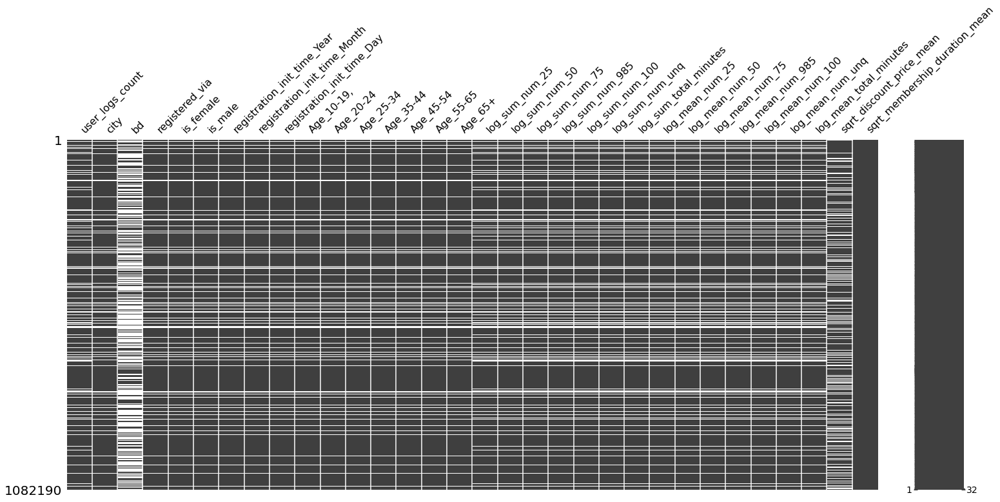

In [ ]:
### plot the missingness (nullity) matrix
missingdata_df = train_flat_file_v1.columns[train_flat_file_v1.isnull().any()].tolist()
msno.matrix(train_flat_file_v1[missingdata_df])

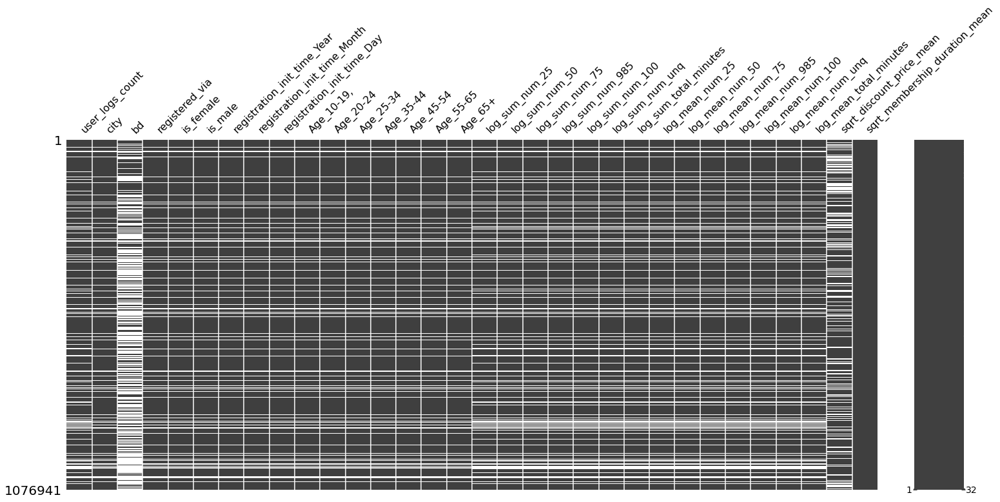

In [ ]:
### plot the missingness (nullity) matrix
missingdata_df_test = test_flat_file_v1.columns[test_flat_file_v1.isnull().any()].tolist()
msno.matrix(test_flat_file_v1[missingdata_df_test])

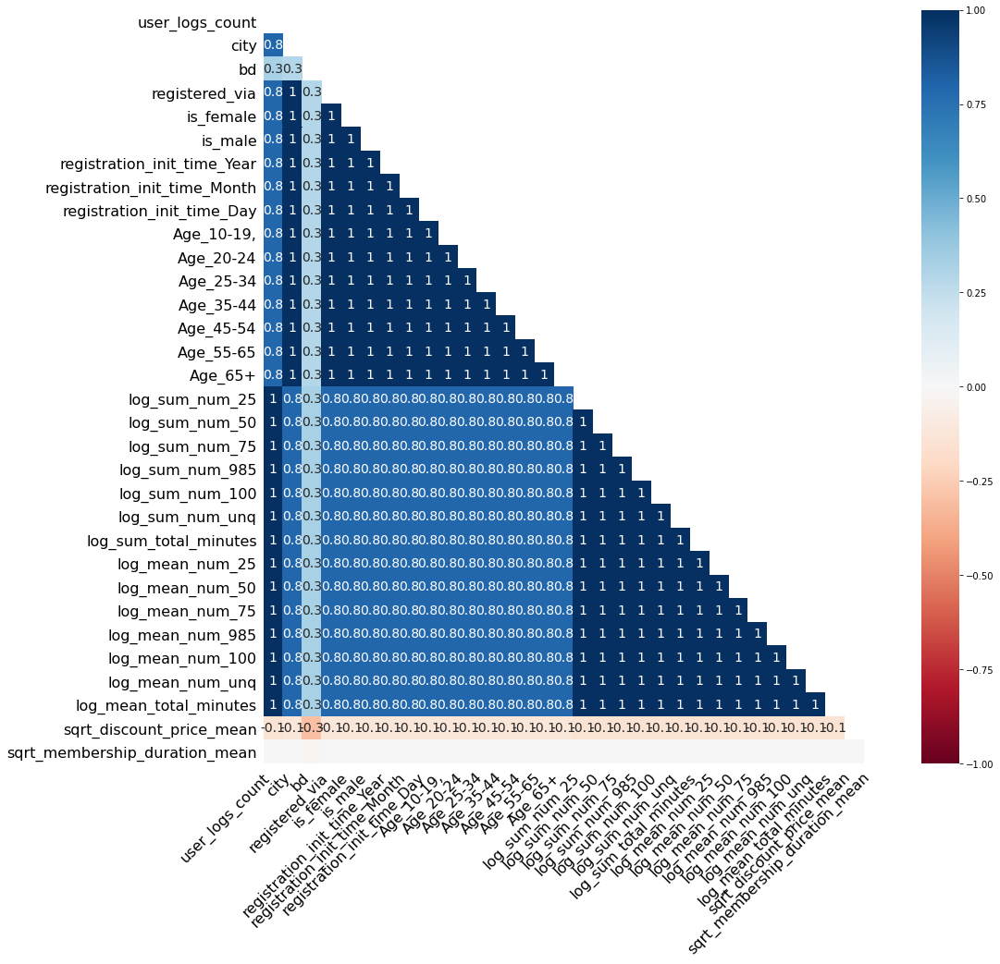

In [ ]:
## missingness correlation heatmap
msno.heatmap(train_flat_file_v1[missingdata_df], figsize=(15,15))

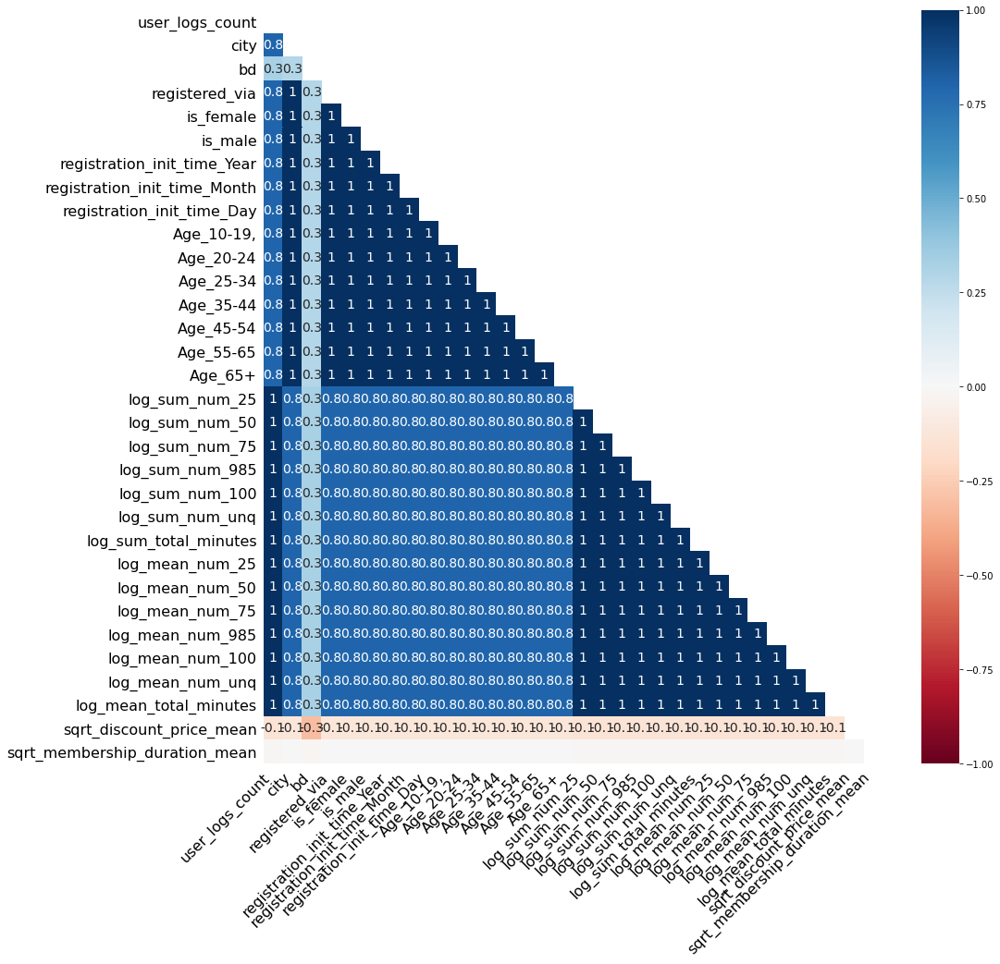

In [ ]:
## missingness correlation heatmap
msno.heatmap(test_flat_file_v1[missingdata_df_test], figsize=(15,15))

### Machine Learning imputation: KNN imputation (Numeric Variables)

In [ ]:
train_cols_names = list(train_flat_file_v1.columns)
cols_with_nulls = []

for value in train_cols_names:
  if train_flat_file_v1[value].isnull().any() :
    cols_with_nulls.append(value)

In [ ]:
test_cols_names = list(test_flat_file_v1.columns)
test_cols_with_nulls = []

for value in test_cols_names:
  if test_flat_file_v1[value].isnull().any() :
    test_cols_with_nulls.append(value)

In [ ]:
cols_with_nulls

['user_logs_count',
 'city',
 'bd',
 'registered_via',
 'is_female',
 'is_male',
 'registration_init_time_Year',
 'registration_init_time_Month',
 'registration_init_time_Day',
 'Age_10-19,',
 'Age_20-24',
 'Age_25-34',
 'Age_35-44',
 'Age_45-54',
 'Age_55-65',
 'Age_65+',
 'log_sum_num_25',
 'log_sum_num_50',
 'log_sum_num_75',
 'log_sum_num_985',
 'log_sum_num_100',
 'log_sum_num_unq',
 'log_sum_total_minutes',
 'log_mean_num_25',
 'log_mean_num_50',
 'log_mean_num_75',
 'log_mean_num_985',
 'log_mean_num_100',
 'log_mean_num_unq',
 'log_mean_total_minutes',
 'sqrt_discount_price_mean',
 'sqrt_membership_duration_mean',
 'city_freq_prcnt']

In [ ]:
test_cols_with_nulls

['user_logs_count',
 'city',
 'bd',
 'registered_via',
 'is_female',
 'is_male',
 'registration_init_time_Year',
 'registration_init_time_Month',
 'registration_init_time_Day',
 'Age_10-19,',
 'Age_20-24',
 'Age_25-34',
 'Age_35-44',
 'Age_45-54',
 'Age_55-65',
 'Age_65+',
 'log_sum_num_25',
 'log_sum_num_50',
 'log_sum_num_75',
 'log_sum_num_985',
 'log_sum_num_100',
 'log_sum_num_unq',
 'log_sum_total_minutes',
 'log_mean_num_25',
 'log_mean_num_50',
 'log_mean_num_75',
 'log_mean_num_985',
 'log_mean_num_100',
 'log_mean_num_unq',
 'log_mean_total_minutes',
 'sqrt_discount_price_mean',
 'sqrt_membership_duration_mean',
 'city_freq_prcnt']

In [ ]:
# Keep numerical columns only for the imputation
unwanted = { 'city','bd', 'is_female','is_male', 'Age_10-19,','Age_20-24','Age_25-34','Age_35-44','Age_45-54','Age_55-65','Age_65+'}
train_numerical_cols_with_nulls = [e for e in cols_with_nulls if e not in unwanted]

In [ ]:
# Keep numerical columns in test data set only for the imputation
unwanted_test = { 'city','bd', 'is_female','is_male', 'Age_10-19,','Age_20-24','Age_25-34','Age_35-44','Age_45-54','Age_55-65','Age_65+'}
test_numerical_cols_with_nulls = [e for e in test_cols_with_nulls if e not in unwanted_test]

In [ ]:
train_numerical_cols_with_nulls

['user_logs_count',
 'registered_via',
 'registration_init_time_Year',
 'registration_init_time_Month',
 'registration_init_time_Day',
 'log_sum_num_25',
 'log_sum_num_50',
 'log_sum_num_75',
 'log_sum_num_985',
 'log_sum_num_100',
 'log_sum_num_unq',
 'log_sum_total_minutes',
 'log_mean_num_25',
 'log_mean_num_50',
 'log_mean_num_75',
 'log_mean_num_985',
 'log_mean_num_100',
 'log_mean_num_unq',
 'log_mean_total_minutes',
 'sqrt_discount_price_mean',
 'sqrt_membership_duration_mean',
 'city_freq_prcnt']

In [ ]:
test_numerical_cols_with_nulls

['user_logs_count',
 'registered_via',
 'registration_init_time_Year',
 'registration_init_time_Month',
 'registration_init_time_Day',
 'log_sum_num_25',
 'log_sum_num_50',
 'log_sum_num_75',
 'log_sum_num_985',
 'log_sum_num_100',
 'log_sum_num_unq',
 'log_sum_total_minutes',
 'log_mean_num_25',
 'log_mean_num_50',
 'log_mean_num_75',
 'log_mean_num_985',
 'log_mean_num_100',
 'log_mean_num_unq',
 'log_mean_total_minutes',
 'sqrt_discount_price_mean',
 'sqrt_membership_duration_mean',
 'city_freq_prcnt']

In [ ]:
# Verify difference between 'train_numerical_cols_with_nulls' to 'test_numerical_cols_with_nulls' lists
list(set(train_numerical_cols_with_nulls) - set(test_numerical_cols_with_nulls))

[]

In [ ]:
# Add binary columns to indicate about the columns NAN(s)
binary_na_column(train = train_flat_file_v1,test=test_flat_file_v1,columns=test_numerical_cols_with_nulls)

In [ ]:
train_flat_file_v1.shape[1] == test_flat_file_v1.shape[1]

True

In [ ]:
train_flat_file_v1.iloc[:,43:]

,registered_via_na,registration_init_time_Year_na,registration_init_time_Month_na,registration_init_time_Day_na,log_sum_num_25_na,log_sum_num_50_na,log_sum_num_75_na,log_sum_num_985_na,log_sum_num_100_na,log_sum_num_unq_na,log_sum_total_minutes_na,log_mean_num_25_na,log_mean_num_50_na,log_mean_num_75_na,log_mean_num_985_na,log_mean_num_100_na,log_mean_num_unq_na,log_mean_total_minutes_na,sqrt_discount_price_mean_na,sqrt_membership_duration_mean_na,payment_plan_days_mean,city_freq_prcnt,city_freq_prcnt_na
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18.500000,0.916030,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30.000000,1.067367,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,283.333333,11.411531,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,97.222222,0.596715,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,21.818182,3.065743,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082185,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,29.037037,11.411531,0
1082186,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30.000000,50.683304,0
1082187,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30.000000,50.683304,0
1082188,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,28.714286,8.363159,0


In [ ]:
test_flat_file_v1.iloc[:,43:]

,registered_via_na,registration_init_time_Year_na,registration_init_time_Month_na,registration_init_time_Day_na,log_sum_num_25_na,log_sum_num_50_na,log_sum_num_75_na,log_sum_num_985_na,log_sum_num_100_na,log_sum_num_unq_na,log_sum_total_minutes_na,log_mean_num_25_na,log_mean_num_50_na,log_mean_num_75_na,log_mean_num_985_na,log_mean_num_100_na,log_mean_num_unq_na,log_mean_total_minutes_na,sqrt_discount_price_mean_na,sqrt_membership_duration_mean_na,payment_plan_days_mean,city_freq_prcnt,city_freq_prcnt_na
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,10.000000,8.281298,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,34.500000,11.294476,0
2,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,27.035714,51.222552,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,27.187500,11.294476,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,28.619048,4.899406,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1076936,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30.000000,51.222552,0
1076937,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,28.965517,51.222552,0
1076938,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30.000000,51.222552,0
1076939,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30.000000,51.222552,0


In [ ]:
non_numeric_columns_train = list(set(train_flat_file_v1.columns) - set(train_numerical_cols_with_nulls))

In [ ]:
non_numeric_columns_test = list(set(test_flat_file_v1.columns) - set(test_numerical_cols_with_nulls))

In [ ]:
non_numeric_columns_train

['city',
 'city_freq_prcnt_na',
 'is_female',
 'Age_35-44',
 'log_mean_num_100_na',
 'Age_65+',
 'log_sum_num_unq_na',
 'log_sum_num_75_na',
 'sqrt_membership_duration_mean_na',
 'registered_via_na',
 'log_mean_total_minutes_na',
 'Age_20-24',
 'Age_25-34',
 'log_mean_num_25_na',
 'log_mean_num_unq_na',
 'Age_10-19,',
 'is_cancel_mode',
 'log_mean_num_75_na',
 'Age_45-54',
 'bd',
 'amt_by_day_mean',
 'log_plan_list_price_mean',
 'log_sum_num_985_na',
 'log_mean_num_985_na',
 'transactions_count',
 'is_auto_renew_mode',
 'registration_init_time_Day_na',
 'registration_init_time_Month_na',
 'log_sum_num_50_na',
 'log_sum_num_100_na',
 'registration_init_time_Year_na',
 'is_male',
 'Age_55-65',
 'msno',
 'log_payment_method_id_mode',
 'user_logs_count_na',
 'payment_plan_days_mean',
 'log_sum_total_minutes_na',
 'log_mean_num_50_na',
 'log_actual_amount_paid_mean',
 'sqrt_discount_price_mean_na',
 'log_sum_num_25_na',
 'is_discount_mode',
 'is_churn']

In [ ]:
non_numeric_columns_test

['city',
 'city_freq_prcnt_na',
 'is_female',
 'Age_35-44',
 'log_mean_num_100_na',
 'Age_65+',
 'log_sum_num_unq_na',
 'log_sum_num_75_na',
 'sqrt_membership_duration_mean_na',
 'registered_via_na',
 'log_mean_total_minutes_na',
 'Age_20-24',
 'Age_25-34',
 'log_mean_num_25_na',
 'log_mean_num_unq_na',
 'Age_10-19,',
 'is_cancel_mode',
 'log_mean_num_75_na',
 'Age_45-54',
 'bd',
 'amt_by_day_mean',
 'log_plan_list_price_mean',
 'log_sum_num_985_na',
 'log_mean_num_985_na',
 'transactions_count',
 'is_auto_renew_mode',
 'registration_init_time_Day_na',
 'registration_init_time_Month_na',
 'log_sum_num_50_na',
 'log_sum_num_100_na',
 'registration_init_time_Year_na',
 'is_male',
 'Age_55-65',
 'msno',
 'log_payment_method_id_mode',
 'user_logs_count_na',
 'payment_plan_days_mean',
 'log_sum_total_minutes_na',
 'log_mean_num_50_na',
 'log_actual_amount_paid_mean',
 'sqrt_discount_price_mean_na',
 'log_sum_num_25_na',
 'is_discount_mode',
 'is_churn']

In [ ]:
X_train = train_flat_file_v1.copy()
X_train = X_train[train_numerical_cols_with_nulls]
X_train.head()

,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt
0,4.0,9.0,2005.0,4.0,6.0,0.845098,0.477121,0.602060,0.301030,1.875061,1.919078,2.531254,0.397940,0.176091,0.243038,0.096910,1.290035,1.332438,1.933011,0.0,4.301163,0.916030
1,15.0,9.0,2005.0,10.0,16.0,1.755875,1.113943,1.079181,1.431364,2.826723,2.807535,3.432473,0.675167,0.255273,0.238882,0.436693,1.659599,1.640813,2.258623,0.0,5.594640,1.067367
2,61.0,9.0,2005.0,11.0,2.0,2.721811,2.220108,2.181844,2.155336,3.105510,3.132580,3.779781,0.983308,0.568779,0.541006,0.522166,1.340151,1.366040,1.998756,0.0,12.165525,11.411531
3,77.0,9.0,2005.0,12.0,28.0,2.136721,1.690196,1.806180,2.436163,3.800373,3.819610,4.448471,0.441889,0.210419,0.259637,0.656335,1.919078,1.938091,2.563154,0.0,10.143416,0.596715
4,48.0,9.0,2006.0,3.0,31.0,1.929419,1.544068,1.322219,1.414973,2.885926,2.829304,3.524408,0.439333,0.232573,0.151268,0.182082,1.230449,1.177296,1.849227,NaN,5.389384,3.065743


In [ ]:
### MICE
X_train_imputed = fancyimpute.IterativeImputer().fit_transform(X_train)
X_train_imputed = pd.DataFrame(X_train_imputed,columns=X_train.columns)
X_train_imputed.head()

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarni

,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt
0,4.0,9.0,2005.0,4.0,6.0,0.845098,0.477121,0.602060,0.301030,1.875061,1.919078,2.531254,0.397940,0.176091,0.243038,0.096910,1.290035,1.332438,1.933011,0.000000,4.301163,0.916030
1,15.0,9.0,2005.0,10.0,16.0,1.755875,1.113943,1.079181,1.431364,2.826723,2.807535,3.432473,0.675167,0.255273,0.238882,0.436693,1.659599,1.640813,2.258623,0.000000,5.594640,1.067367
2,61.0,9.0,2005.0,11.0,2.0,2.721811,2.220108,2.181844,2.155336,3.105510,3.132580,3.779781,0.983308,0.568779,0.541006,0.522166,1.340151,1.366040,1.998756,0.000000,12.165525,11.411531
3,77.0,9.0,2005.0,12.0,28.0,2.136721,1.690196,1.806180,2.436163,3.800373,3.819610,4.448471,0.441889,0.210419,0.259637,0.656335,1.919078,1.938091,2.563154,0.000000,10.143416,0.596715
4,48.0,9.0,2006.0,3.0,31.0,1.929419,1.544068,1.322219,1.414973,2.885926,2.829304,3.524408,0.439333,0.232573,0.151268,0.182082,1.230449,1.177296,1.849227,0.615998,5.389384,3.065743


In [ ]:
X_test = test_flat_file_v1.copy()
X_test = X_test[test_numerical_cols_with_nulls]
X_test.head()

,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt
0,15.0,3.0,2013.0,12.0,23.0,2.285557,1.397940,1.146128,1.079181,2.910624,2.551450,3.464663,1.139879,0.414973,0.271067,0.238882,1.741939,1.392110,2.290652,NaN,5.016639,8.281298
1,45.0,3.0,2013.0,12.0,27.0,2.993877,2.029384,1.792392,1.672098,2.789581,3.159868,3.491144,1.359625,0.525764,0.372093,0.305829,1.166331,1.519682,1.844055,0.0,5.687706,11.294476
2,NaN,7.0,2014.0,1.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.774822,51.222552
3,30.0,7.0,2014.0,1.0,25.0,1.397940,1.301030,1.204120,1.146128,3.068928,2.904716,3.695176,0.255273,0.213075,0.176091,0.156347,1.602422,1.443002,2.220589,NaN,13.504629,11.294476
4,16.0,3.0,2014.0,1.0,26.0,1.568202,1.204120,0.903090,1.176091,2.365488,2.418301,3.023307,0.511883,0.287242,0.157608,0.273001,1.188577,1.238360,1.825318,NaN,5.140873,4.899406


In [ ]:
len(test_numerical_cols_with_nulls) + len(non_numeric_columns_test)

66

In [ ]:
len(train_numerical_cols_with_nulls) + len(non_numeric_columns_train)

66

In [ ]:
X_train_imputed = pd.concat([train_flat_file_v1[non_numeric_columns_train],X_train_imputed],axis=1)
X_train_imputed.head()

,city,city_freq_prcnt_na,is_female,Age_35-44,log_mean_num_100_na,Age_65+,log_sum_num_unq_na,log_sum_num_75_na,sqrt_membership_duration_mean_na,registered_via_na,log_mean_total_minutes_na,Age_20-24,Age_25-34,log_mean_num_25_na,log_mean_num_unq_na,"Age_10-19,",is_cancel_mode,log_mean_num_75_na,Age_45-54,bd,amt_by_day_mean,log_plan_list_price_mean,log_sum_num_985_na,log_mean_num_985_na,transactions_count,is_auto_renew_mode,registration_init_time_Day_na,registration_init_time_Month_na,log_sum_num_50_na,log_sum_num_100_na,registration_init_time_Year_na,is_male,Age_55-65,msno,log_payment_method_id_mode,user_logs_count_na,payment_plan_days_mean,log_sum_total_minutes_na,log_mean_num_50_na,log_actual_amount_paid_mean,...,registration_init_time_Month_na,log_sum_num_50_na,log_sum_num_100_na,registration_init_time_Year_na,is_male,Age_55-65,msno,log_payment_method_id_mode,user_logs_count_na,payment_plan_days_mean,log_sum_total_minutes_na,log_mean_num_50_na,log_actual_amount_paid_mean,sqrt_discount_price_mean_na,log_sum_num_25_na,is_discount_mode,is_churn,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt,city_freq_prcnt_na
0,18.0,0,1.0,1.0,0,0.0,0,0,0,0,0,0.0,0.0,0,0,0.0,0,0,0.0,36.0,2.483333,1.877947,0,0,2,0,0,0,0,0,0,0.0,0.0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1.591065,0,18.500000,0,0,1.877947,...,0,0,0,0,0.0,0.0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1.591065,0,18.500000,0,0,1.877947,0,0,0,1,4.0,9.0,2005.0,4.0,6.0,0.845098,0.477121,0.602060,0.301030,1.875061,1.919078,2.531254,0.397940,0.176091,0.243038,0.096910,1.290035,1.332438,1.933011,0.000000,4.301163,0.916030,0
1,11.0,0,1.0,0.0,0,0.0,0,0,0,0,0,0.0,1.0,0,0,0.0,0,0,0.0,27.0,4.973333,2.176670,0,0,10,1,0,0,0,0,0,0.0,0.0,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,1.602060,0,30.000000,0,0,2.176670,...,0,0,0,0,0.0,0.0,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,1.602060,0,30.000000,0,0,2.176670,0,0,0,1,15.0,9.0,2005.0,10.0,16.0,1.755875,1.113943,1.079181,1.431364,2.826723,2.807535,3.432473,0.675167,0.255273,0.238882,0.436693,1.659599,1.640813,2.258623,0.000000,5.594640,1.067367,0
2,13.0,0,1.0,0.0,0,0.0,0,0,0,0,0,1.0,0.0,0,0,0.0,0,0,0.0,23.0,3.109214,2.810680,0,0,3,0,0,0,0,0,0,0.0,0.0,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,1.255273,0,283.333333,0,0,2.810680,...,0,0,0,0,0.0,0.0,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,1.255273,0,283.333333,0,0,2.810680,0,0,0,1,61.0,9.0,2005.0,11.0,2.0,2.721811,2.220108,2.181844,2.155336,3.105510,3.132580,3.779781,0.983308,0.568779,0.541006,0.522166,1.340151,1.366040,1.998756,0.000000,12.165525,11.411531,0
3,3.0,0,0.0,0.0,0,0.0,0,0,0,0,0,0.0,1.0,0,0,0.0,0,0,0.0,27.0,4.893955,2.654497,0,0,9,0,0,0,0,0,0,1.0,0.0,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,1.591065,0,97.222222,0,0,2.654497,...,0,0,0,0,1.0,0.0,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,1.591065,0,97.222222,0,0,2.654497,0,0,0,1,77.0,9.0,2005.0,12.0,28.0,2.136721,1.690196,1.806180,2.436163,3.800373,3.819610,4.448471,0.441889,0.210419,0.259637,0.656335,1.919078,1.938091,2.563154,0.000000,10.143416,0.596715,0
4,6.0,0,1.0,0.0,0,0.0,0,0,0,0,0,1.0,0.0,0,0,0.0,0,0,0.0,23.0,0.000000,2.038873,0,0,22,1,0,0,0,0,0,0.0,0.0,GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=,1.531479,0,21.818182,0,0,2.176091,...,0,0,0,0,0.0,0.0,GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=,1.531479,0,21.818182,0,0,2.176091,1,0,0,1,48.0,9.0,2006.0,3.0,31.0,1.929419,1.544068,1.322219,1.414973,2.885926,2.829304,3.524408,0.439333,0.232573,0.151268,0.182082,1.230449,1.177296,1.849227,0.615998,5.389384,3.065743,0


In [ ]:
### MICE
X_test_imputed = fancyimpute.IterativeImputer().fit_transform(X_test)
X_test_imputed = pd.DataFrame(X_test_imputed,columns=X_test.columns)
X_test_imputed.head()

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarni

,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt
0,15.000000,3.0,2013.0,12.0,23.0,2.285557,1.397940,1.146128,1.079181,2.910624,2.551450,3.464663,1.139879,0.414973,0.271067,0.238882,1.741939,1.392110,2.290652,0.124890,5.016639,8.281298
1,45.000000,3.0,2013.0,12.0,27.0,2.993877,2.029384,1.792392,1.672098,2.789581,3.159868,3.491144,1.359625,0.525764,0.372093,0.305829,1.166331,1.519682,1.844055,0.000000,5.687706,11.294476
2,42.162142,7.0,2014.0,1.0,9.0,2.161749,1.538734,1.366638,1.402796,2.764778,2.805775,3.426628,0.760308,0.331059,0.254471,0.265147,1.298081,1.334824,1.937839,-0.105458,21.774822,51.222552
3,30.000000,7.0,2014.0,1.0,25.0,1.397940,1.301030,1.204120,1.146128,3.068928,2.904716,3.695176,0.255273,0.213075,0.176091,0.156347,1.602422,1.443002,2.220589,0.043621,13.504629,11.294476
4,16.000000,3.0,2014.0,1.0,26.0,1.568202,1.204120,0.903090,1.176091,2.365488,2.418301,3.023307,0.511883,0.287242,0.157608,0.273001,1.188577,1.238360,1.825318,0.064251,5.140873,4.899406


In [ ]:
print(list(set(X_train_imputed.columns) - set(X_test_imputed.columns)))

['log_mean_num_50_na', 'log_mean_num_25_na', 'transactions_count', 'amt_by_day_mean', 'log_mean_num_unq_na', 'log_mean_num_100_na', 'registered_via_na', 'log_sum_num_25_na', 'log_sum_num_75_na', 'log_mean_num_75_na', 'log_mean_total_minutes_na', 'sqrt_membership_duration_mean_na', 'registration_init_time_Day_na', 'log_sum_num_985_na', 'log_mean_num_985_na', 'payment_plan_days_mean', 'log_sum_total_minutes_na', 'registration_init_time_Month_na', 'log_sum_num_unq_na', 'sqrt_discount_price_mean_na', 'registration_init_time_Year_na', 'user_logs_count_na', 'log_sum_num_50_na', 'log_sum_num_100_na']


In [ ]:
X_test_imputed = pd.concat([X_test_imputed,test_flat_file_v1[non_numeric_columns_test]],axis=1)
X_test_imputed.head()

,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt,city,city_freq_prcnt_na,is_female,Age_35-44,log_mean_num_100_na,Age_65+,log_sum_num_unq_na,log_sum_num_75_na,sqrt_membership_duration_mean_na,registered_via_na,log_mean_total_minutes_na,Age_20-24,Age_25-34,log_mean_num_25_na,log_mean_num_unq_na,"Age_10-19,",is_cancel_mode,log_mean_num_75_na,Age_45-54,bd,amt_by_day_mean,log_plan_list_price_mean,log_sum_num_985_na,log_mean_num_985_na,transactions_count,is_auto_renew_mode,registration_init_time_Day_na,registration_init_time_Month_na,log_sum_num_50_na,log_sum_num_100_na,registration_init_time_Year_na,is_male,Age_55-65,msno,log_payment_method_id_mode,user_logs_count_na,payment_plan_days_mean,log_sum_total_minutes_na,log_mean_num_50_na,log_actual_amount_paid_mean,sqrt_discount_price_mean_na,log_sum_num_25_na,is_discount_mode,is_churn
0,15.000000,3.0,2013.0,12.0,23.0,2.285557,1.397940,1.146128,1.079181,2.910624,2.551450,3.464663,1.139879,0.414973,0.271067,0.238882,1.741939,1.392110,2.290652,0.124890,5.016639,8.281298,5.0,0,0.0,0.0,0,0.0,0,0,0,0,0,0.0,1.0,0,0,0.0,0,0,0.0,28.0,0.000000,1.704722,0,0,6,1,0,0,0,0,0,1.0,0.0,ugx0CjOMzazClkFzU2xasmDZaoIqOUAZPsH1q0teWCg=,1.505150,0,10.000000,0,0,2.176091,1,0,0,0
1,45.000000,3.0,2013.0,12.0,27.0,2.993877,2.029384,1.792392,1.672098,2.789581,3.159868,3.491144,1.359625,0.525764,0.372093,0.305829,1.166331,1.519682,1.844055,0.000000,5.687706,11.294476,13.0,0,0.0,0.0,0,0.0,0,0,0,0,0,0.0,0.0,0,0,1.0,0,0,0.0,18.0,4.636667,2.176381,0,0,20,0,0,0,0,0,0,1.0,0.0,zLo9f73nGGT1p21ltZC3ChiRnAVvgibMyazbCxvWPcg=,1.591065,0,34.500000,0,0,2.176381,0,0,0,0
2,42.162142,7.0,2014.0,1.0,9.0,2.161749,1.538734,1.366638,1.402796,2.764778,2.805775,3.426628,0.760308,0.331059,0.254471,0.265147,1.298081,1.334824,1.937839,-0.105458,21.774822,51.222552,1.0,0,0.0,0.0,1,0.0,1,1,0,0,1,0.0,0.0,1,1,0.0,0,1,0.0,NaN,0.000000,2.127221,1,1,28,1,0,0,1,1,0,0.0,0.0,8iF/+8HY8lJKFrTc7iR9ZYGCG2Ecrogbc2Vy5YhsfhQ=,1.623249,1,27.035714,1,1,2.160404,1,1,0,0
3,30.000000,7.0,2014.0,1.0,25.0,1.397940,1.301030,1.204120,1.146128,3.068928,2.904716,3.695176,0.255273,0.213075,0.176091,0.156347,1.602422,1.443002,2.220589,0.043621,13.504629,11.294476,13.0,0,1.0,1.0,0,0.0,0,0,0,0,0,0.0,0.0,0,0,0.0,0,0,0.0,35.0,0.000000,2.020284,0,0,32,1,0,0,0,0,0,0.0,0.0,K6fja4+jmoZ5xG6BypqX80Uw/XKpMgrEMdG2edFOxnA=,1.623249,0,27.187500,0,0,2.072342,1,0,0,0
4,16.000000,3.0,2014.0,1.0,26.0,1.568202,1.204120,0.903090,1.176091,2.365488,2.418301,3.023307,0.511883,0.287242,0.157608,0.273001,1.188577,1.238360,1.825318,0.064251,5.140873,4.899406,22.0,0,0.0,0.0,0,0.0,0,0,0,0,0,0.0,0.0,0,0,0.0,0,0,0.0,NaN,0.000000,2.155047,0,0,21,1,0,0,0,0,0,0.0,0.0,ibIHVYBqxGwrSExE63/omeDD99M5vYB3CN2HzkEY+eM=,1.612784,0,28.619048,0,0,2.176091,1,0,0,0


#### Plot before and after numeric columns imputation

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


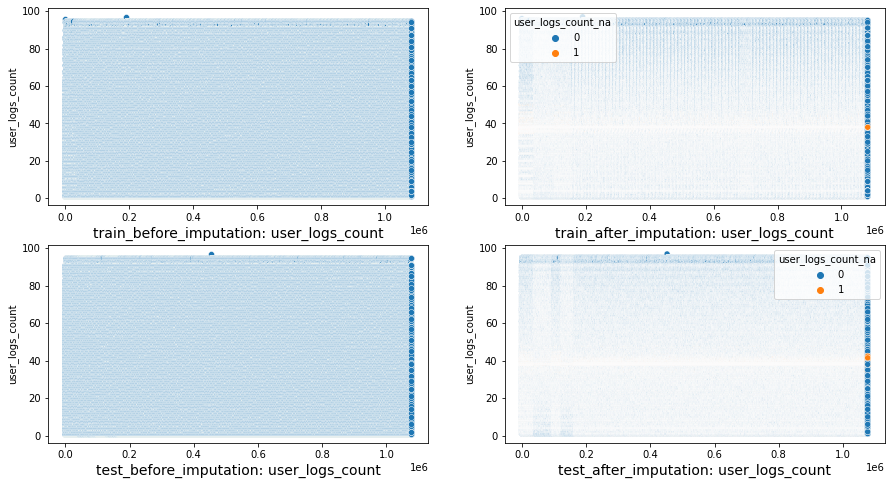

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='user_logs_count')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


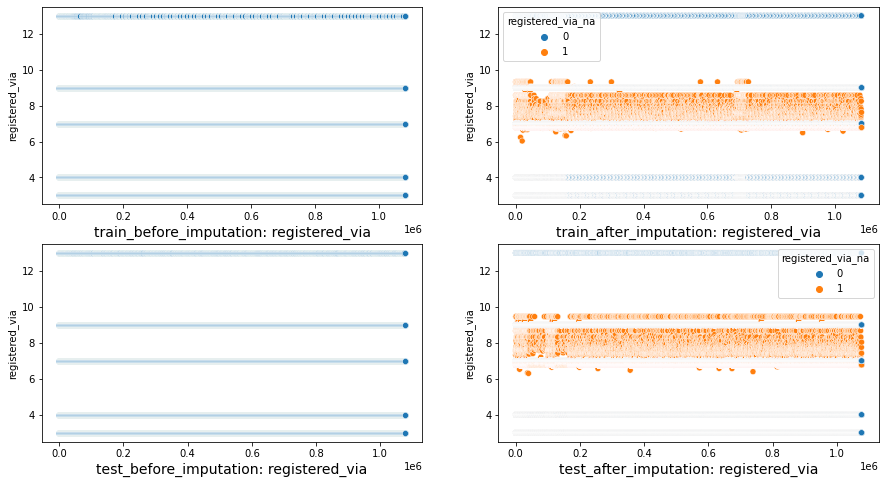

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='registered_via')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


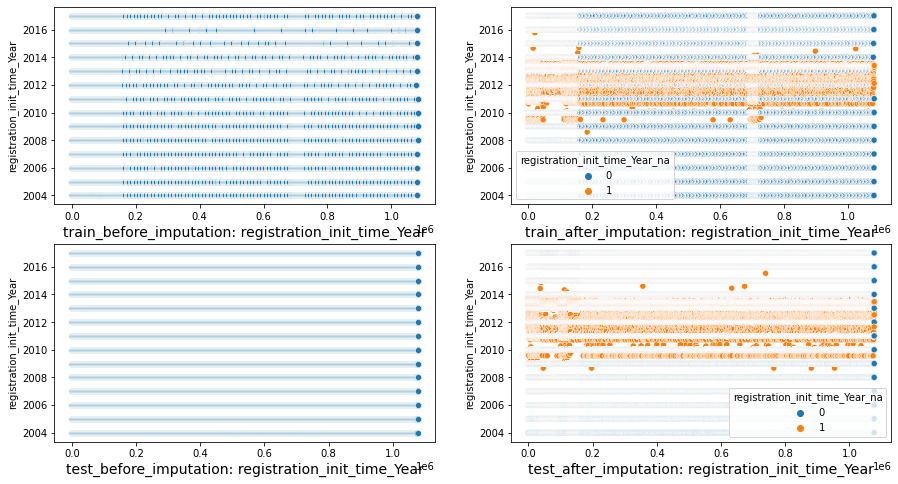

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='registration_init_time_Year')


/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


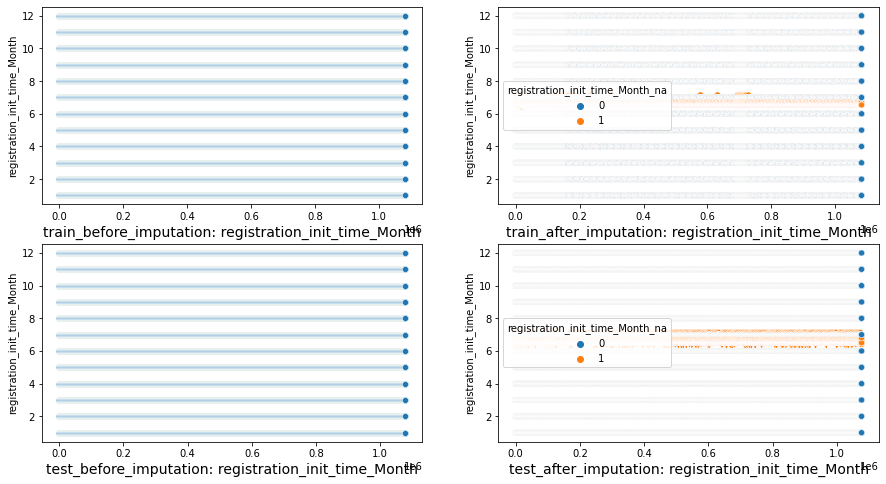

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='registration_init_time_Month')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


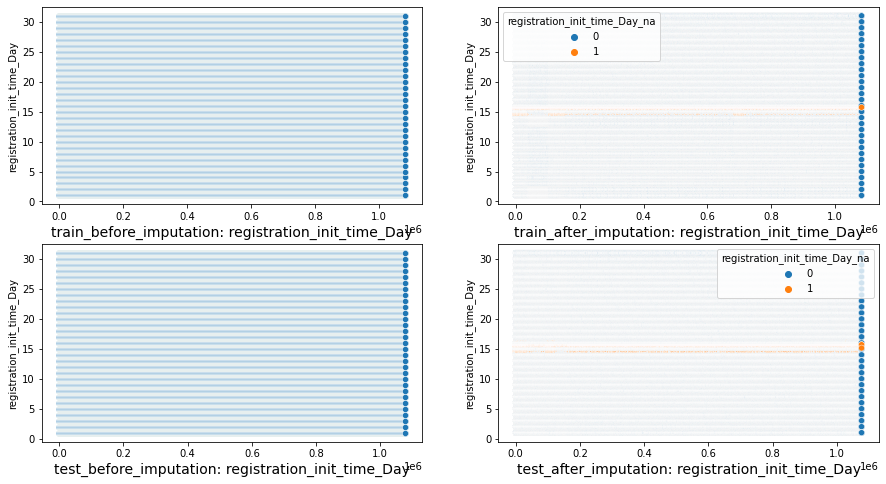

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='registration_init_time_Day')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


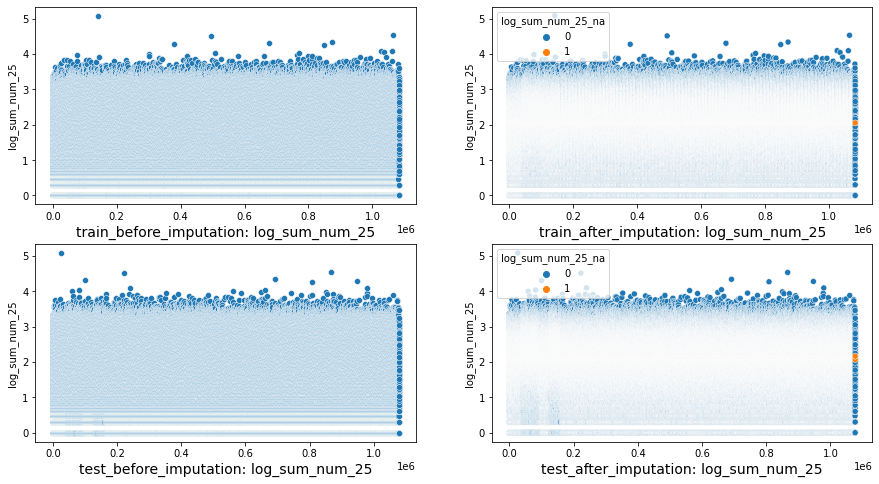

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_sum_num_25')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


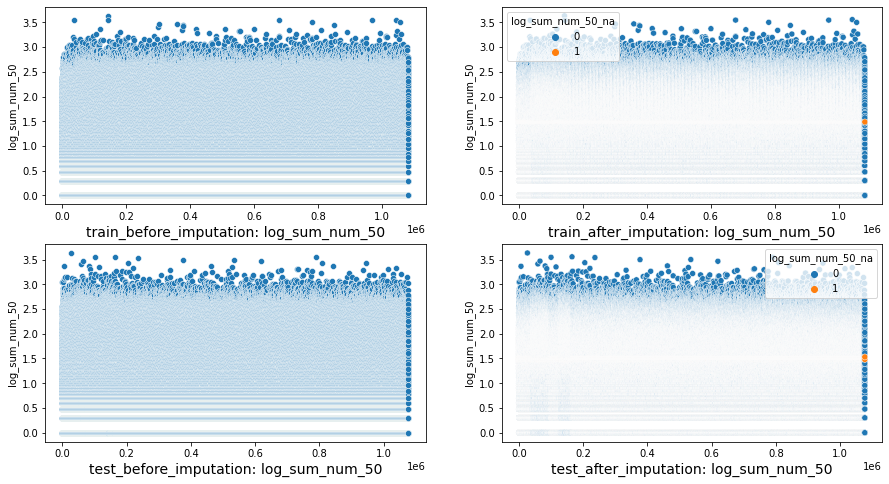

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_sum_num_50')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


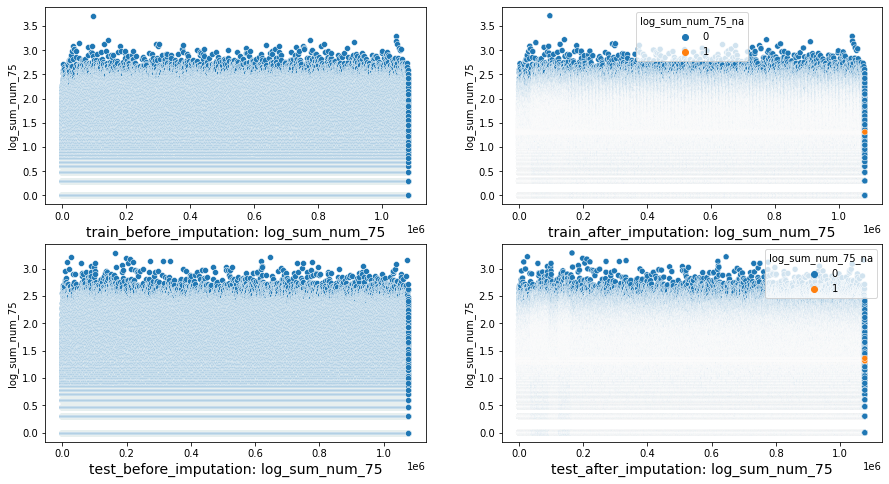

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_sum_num_75')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


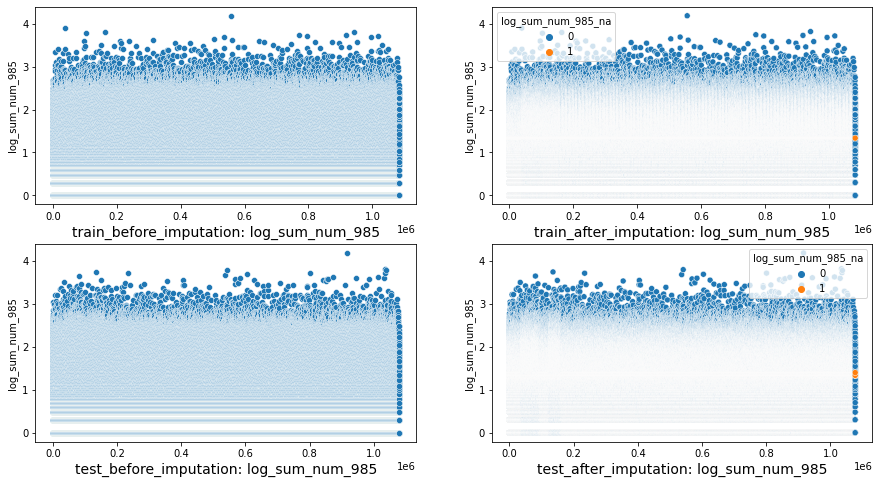

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_sum_num_985')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


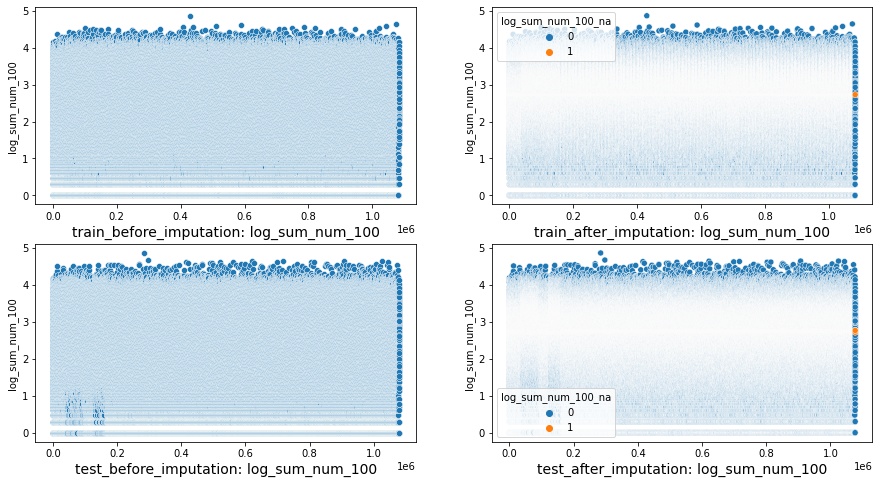

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_sum_num_100')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


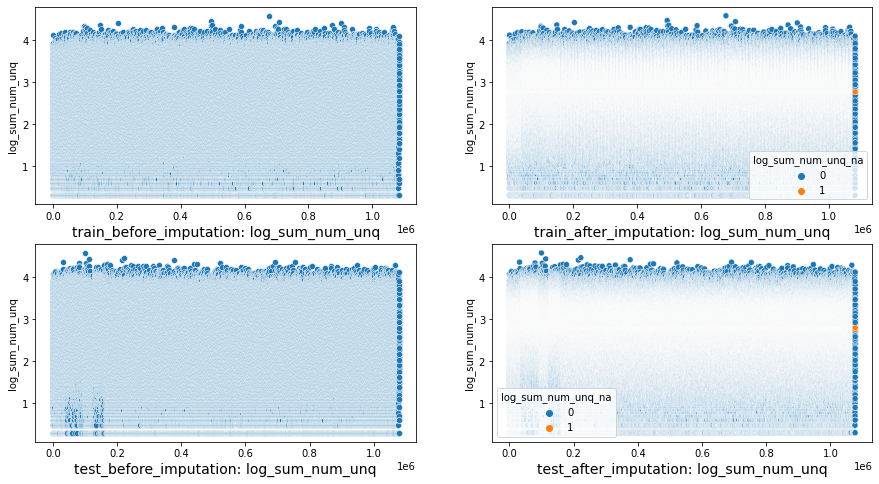

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_sum_num_unq')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


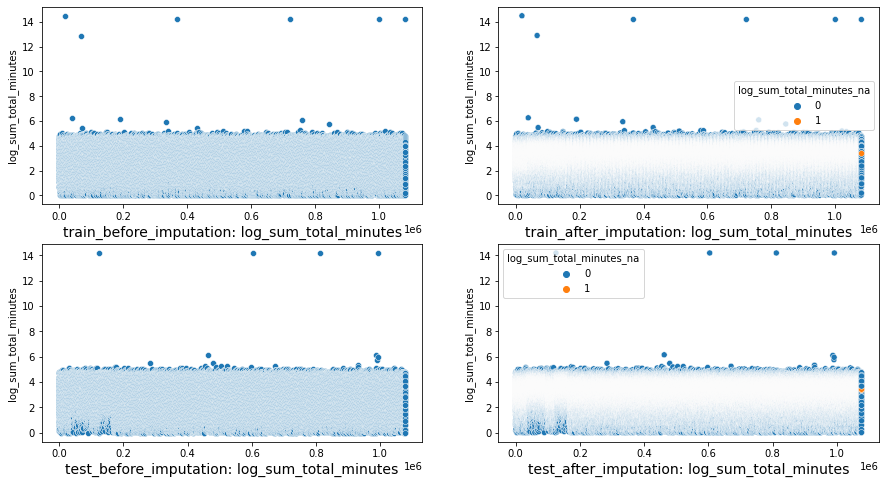

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_sum_total_minutes')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


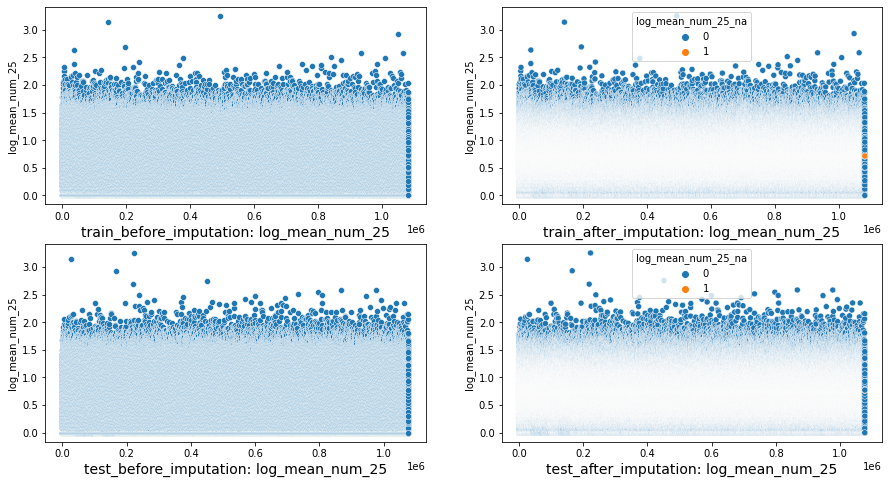

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_mean_num_25')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


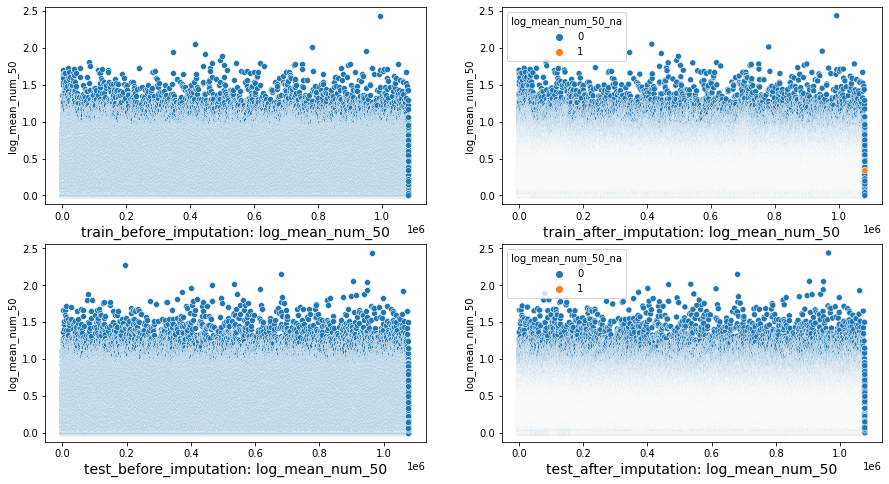

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_mean_num_50')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


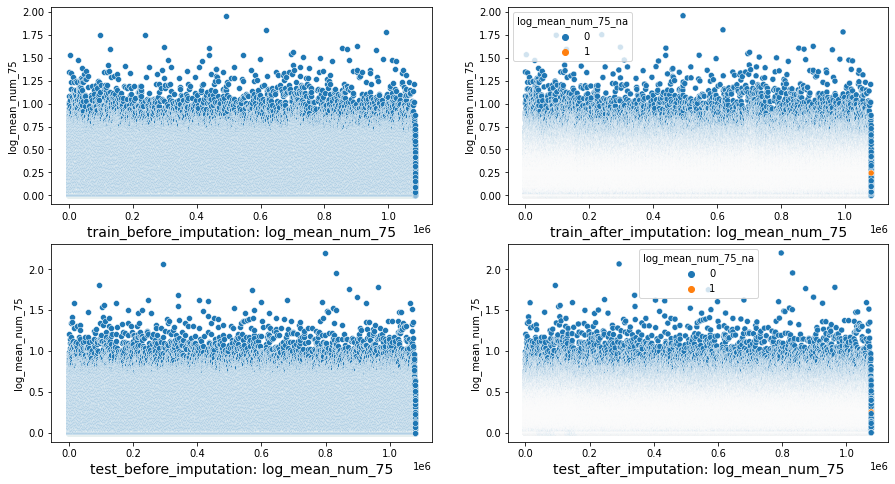

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_mean_num_75')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


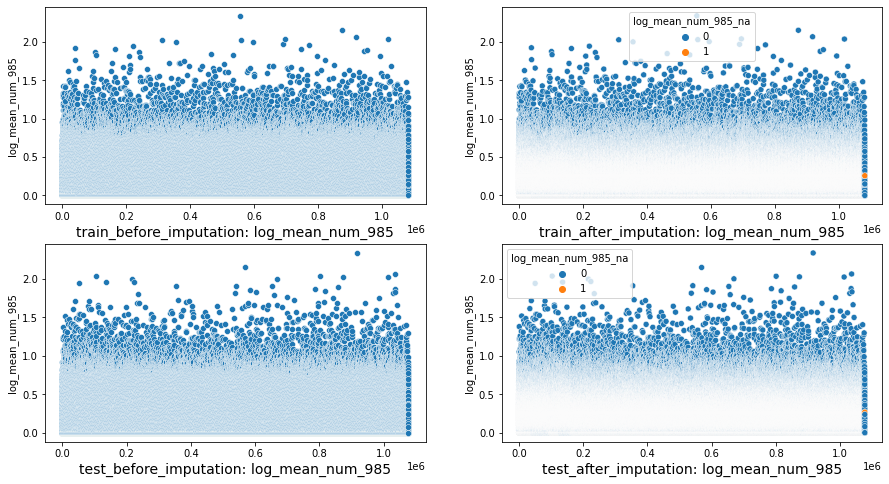

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_mean_num_985')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


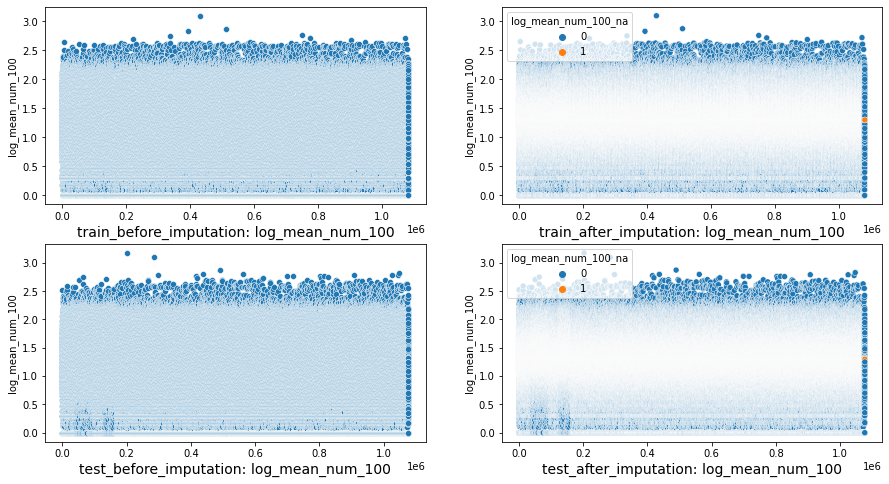

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_mean_num_100')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


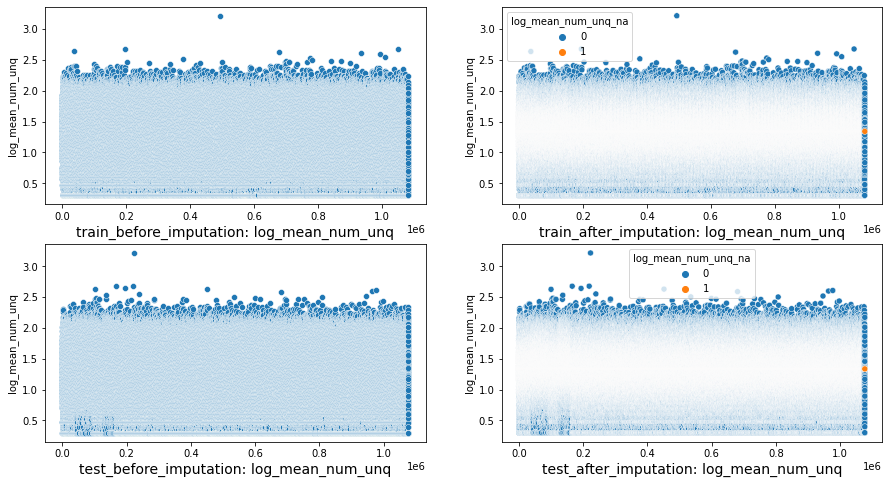

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_mean_num_unq')

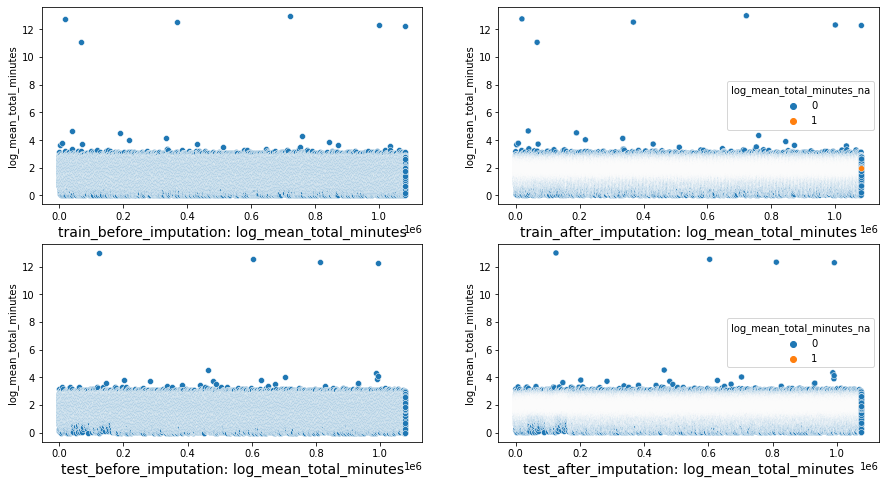

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='log_mean_total_minutes')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


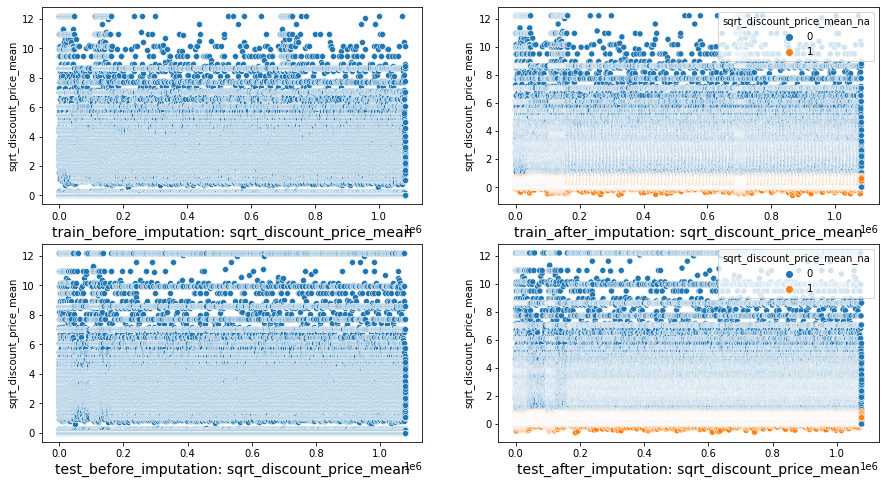

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='sqrt_discount_price_mean')

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


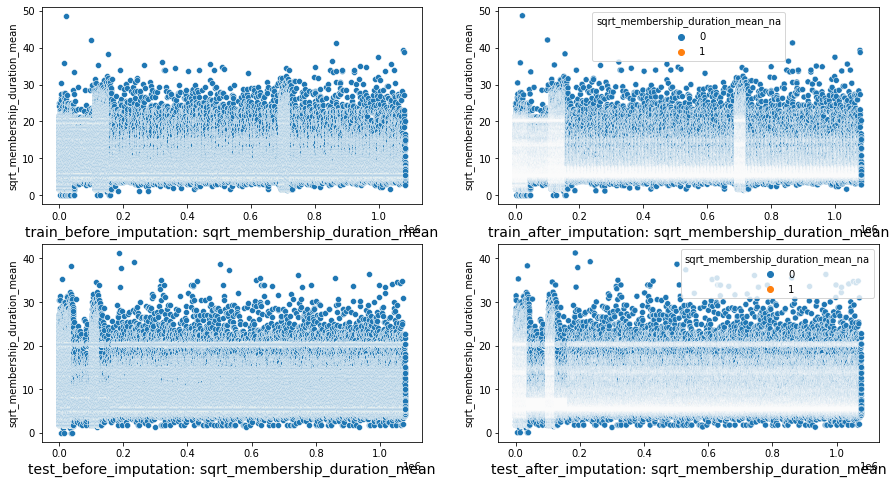

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='sqrt_membership_duration_mean')

In [ ]:
plt_scatterplot_missing_values_imputation(train_unimputed=train_flat_file_v1,train_imputed=X_train_imputed,
                                          test_unimputed=test_flat_file_v1,test_imputed=X_test_imputed,
                                          numerical_column='city_freq_prcnt')

In [ ]:
write_data(df=X_train_imputed, full_url=project_url+'Data/X_train_imputed.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/X_train_imputed.csv


In [ ]:
write_data(df=X_test_imputed, full_url=project_url+'Data/X_test_imputed.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/X_test_imputed.csv


In [17]:
X_train_imputed = read_data(full_url=project_url+'Data/X_train_imputed.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/X_train_imputed.csv


In [19]:
min(X_train_imputed.log_payment_method_id_mode)

0.6020599913279624

In [ ]:
# Frequency encoding using value_counts function 
city_freq_prcnt = X_train_imputed['city'].value_counts(normalize=True)*100

# Mapping the encoded values with original data 
X_train_imputed['city_freq_prcnt'] = X_train_imputed['city'].apply(lambda x : city_freq_prcnt[x] if pd.notnull(x) else x)

In [ ]:
# Frequency encoding using value_counts function 
city_freq_prcnt = test_flat_file_v1['city'].value_counts(normalize=True)*100

# Mapping the encoded values with original data 
test_flat_file_v1['city_freq_prcnt'] = test_flat_file_v1['city'].apply(lambda x : city_freq_prcnt[x] if pd.notnull(x) else x)

In [ ]:
X_train_imputed

,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,log_sum_num_100_na,msno,log_plan_list_price_mean,is_male,log_mean_num_25_na,amt_by_day_mean,Age_65+,log_mean_num_75_na,log_sum_num_50_na,log_payment_method_id_mode,log_sum_num_25_na,registration_init_time_Day_na,transactions_count,log_sum_num_unq_na,sqrt_membership_duration_mean_na,is_cancel_mode,bd,log_mean_total_minutes_na,Age_25-34,user_logs_count_na,registered_via_na,is_discount_mode,Age_20-24,is_female,log_mean_num_50_na,"Age_10-19,",Age_35-44,log_actual_amount_paid_mean,is_auto_renew_mode,registration_init_time_Month_na,log_sum_num_985_na,log_mean_num_985_na,log_mean_num_unq_na,is_churn,log_sum_total_minutes_na,Age_45-54,Age_55-65,log_mean_num_100_na,registration_init_time_Year_na,payment_plan_days_mean,sqrt_discount_price_mean_na,log_sum_num_75_na,city,city_freq_in_percent,city_freq_prcnt
0,4.000000,9.000000,2005.000000,4.000000,6.000000,0.845098,0.477121,0.602060,0.301030,1.875061,1.919078,2.531254,0.397940,0.176091,0.243038,0.096910,1.290035,1.332438,1.933011,0.000000,4.301163,0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1.877947,0.0,0,2.483333,0.0,0,0,1.591065,0,0,2,0,0,0,36.0,0,0.0,0,0,0,0.0,1.0,0,0.0,1.0,1.877947,0,0,0,0,0,1,0,0.0,0.0,0,0,18.500000,0,0,18.0,0.91603,0.916030
1,15.000000,9.000000,2005.000000,10.000000,16.000000,1.755875,1.113943,1.079181,1.431364,2.826723,2.807535,3.432473,0.675167,0.255273,0.238882,0.436693,1.659599,1.640813,2.258623,0.000000,5.594640,0,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,2.176670,0.0,0,4.973333,0.0,0,0,1.602060,0,0,10,0,0,0,27.0,0,1.0,0,0,0,0.0,1.0,0,0.0,0.0,2.176670,1,0,0,0,0,1,0,0.0,0.0,0,0,30.000000,0,0,11.0,1.06737,1.067367
2,61.000000,9.000000,2005.000000,11.000000,2.000000,2.721811,2.220108,2.181844,2.155336,3.105510,3.132580,3.779781,0.983308,0.568779,0.541006,0.522166,1.340151,1.366040,1.998756,0.000000,12.165525,0,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,2.810680,0.0,0,3.109214,0.0,0,0,1.255273,0,0,3,0,0,0,23.0,0,0.0,0,0,0,1.0,1.0,0,0.0,0.0,2.810680,0,0,0,0,0,1,0,0.0,0.0,0,0,283.333333,0,0,13.0,11.4115,11.411531
3,77.000000,9.000000,2005.000000,12.000000,28.000000,2.136721,1.690196,1.806180,2.436163,3.800373,3.819610,4.448471,0.441889,0.210419,0.259637,0.656335,1.919078,1.938091,2.563154,0.000000,10.143416,0,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,2.654497,1.0,0,4.893955,0.0,0,0,1.591065,0,0,9,0,0,0,27.0,0,1.0,0,0,0,0.0,0.0,0,0.0,0.0,2.654497,0,0,0,0,0,1,0,0.0,0.0,0,0,97.222222,0,0,3.0,0.596715,0.596715
4,48.000000,9.000000,2006.000000,3.000000,31.000000,1.929419,1.544068,1.322219,1.414973,2.885926,2.829304,3.524408,0.439333,0.232573,0.151268,0.182082,1.230449,1.177296,1.849227,0.622061,5.389384,0,GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=,2.038873,0.0,0,0.000000,0.0,0,0,1.531479,0,0,22,0,0,0,23.0,0,0.0,0,0,0,1.0,1.0,0,0.0,0.0,2.176091,1,0,0,0,0,1,0,0.0,0.0,0,0,21.818182,1,0,6.0,3.06574,3.065743
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082185,57.000000,7.000000,2011.000000,8.000000,31.000000,2.093422,1.602060,1.230449,1.361728,2.809560,2.799341,3.434739,0.499398,0.226396,0.107448,0.141752,1.089843,1.080449,1.687711,0.000000,5.426274,0,OHnZbu+EVaP+vN7Z+OfT5OMcp90MWFZonmM0o3pb8FY=,2.159812,1.0,0,0.000000,0.0,0,0,1.612784,0,0,27,0,0,0,28.0,0,1.0,0,0,0,0.0,0.0,0,0.0,0.0,2.159812,1,0,0,0,0,0,0,0.0,0.0,0,0,29.037037,0,0,13.0,11.4115,11.411531
1082186,9.000000,7.000000,2011.000000,9.000000,3.000000,1.716003,1.255273,1.041393,1.041393,

In [ ]:
train_flat_file_v1['city_freq_prcnt'] = X_train_imputed['city_freq_prcnt']

In [ ]:
X_test_imputed = read_data(full_url=project_url+'Data/X_test_imputed.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/X_test_imputed.csv


In [ ]:
X_train_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1082190 entries, 0 to 1082189
Data columns (total 66 columns):
 #   Column                            Non-Null Count    Dtype  
---  ------                            --------------    -----  
 0   city                              961431 non-null   float64
 1   city_freq_prcnt_na                1082190 non-null  int64  
 2   is_female                         961431 non-null   float64
 3   Age_35-44                         961431 non-null   float64
 4   log_mean_num_100_na               1082190 non-null  int64  
 5   Age_65+                           961431 non-null   float64
 6   log_sum_num_unq_na                1082190 non-null  int64  
 7   log_sum_num_75_na                 1082190 non-null  int64  
 8   sqrt_membership_duration_mean_na  1082190 non-null  int64  
 9   registered_via_na                 1082190 non-null  int64  
 10  log_mean_total_minutes_na         1082190 non-null  int64  
 11  Age_20-24                         961

In [ ]:
X_test_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1076941 entries, 0 to 1076940
Data columns (total 66 columns):
 #   Column                            Non-Null Count    Dtype  
---  ------                            --------------    -----  
 0   user_logs_count                   1076941 non-null  float64
 1   registered_via                    1076941 non-null  float64
 2   registration_init_time_Year       1076941 non-null  float64
 3   registration_init_time_Month      1076941 non-null  float64
 4   registration_init_time_Day        1076941 non-null  float64
 5   log_sum_num_25                    1076941 non-null  float64
 6   log_sum_num_50                    1076941 non-null  float64
 7   log_sum_num_75                    1076941 non-null  float64
 8   log_sum_num_985                   1076941 non-null  float64
 9   log_sum_num_100                   1076941 non-null  float64
 10  log_sum_num_unq                   1076941 non-null  float64
 11  log_sum_total_minutes             107

###Categorical One Hot Encoding Imputation 

In [ ]:
categ_cols = [ 'is_female','is_male', 'Age_10-19,','Age_20-24','Age_25-34','Age_35-44','Age_45-54','Age_55-65','Age_65+']
X_train_imputed[categ_cols].isnull().sum()

is_female     120759
is_male       120759
Age_10-19,    120759
Age_20-24     120759
Age_25-34     120759
Age_35-44     120759
Age_45-54     120759
Age_55-65     120759
Age_65+       120759
dtype: int64

In [ ]:
binary_na_column(train=X_train_imputed,test=X_test_imputed,columns=categ_cols)

In [ ]:
X_train_imputed[categ_cols] = X_train_imputed[categ_cols].fillna(0)

In [ ]:
X_test_imputed[categ_cols] = X_test_imputed[categ_cols].fillna(0)

In [ ]:
print(X_train_imputed.filter(like='na').columns)

Index(['city_freq_prcnt_na', 'log_mean_num_100_na', 'log_sum_num_unq_na',
       'log_sum_num_75_na', 'sqrt_membership_duration_mean_na',
       'registered_via_na', 'log_mean_total_minutes_na', 'log_mean_num_25_na',
       'log_mean_num_unq_na', 'log_mean_num_75_na', 'log_sum_num_985_na',
       'log_mean_num_985_na', 'registration_init_time_Day_na',
       'registration_init_time_Month_na', 'log_sum_num_50_na',
       'log_sum_num_100_na', 'registration_init_time_Year_na',
       'user_logs_count_na', 'log_sum_total_minutes_na', 'log_mean_num_50_na',
       'sqrt_discount_price_mean_na', 'log_sum_num_25_na', 'is_female_na',
       'is_male_na', 'Age_10-19,_na', 'Age_20-24_na', 'Age_25-34_na',
       'Age_35-44_na', 'Age_45-54_na', 'Age_55-65_na', 'Age_65+_na'],
      dtype='object')


In [ ]:
na_cols = {'city_freq_prcnt_na', 'log_mean_num_100_na', 'log_sum_num_unq_na',
       'log_sum_num_75_na', 'sqrt_membership_duration_mean_na',
       'registered_via_na', 'log_mean_total_minutes_na', 'log_mean_num_25_na',
       'log_mean_num_unq_na', 'log_mean_num_75_na', 'log_sum_num_985_na',
       'log_mean_num_985_na', 'registration_init_time_Day_na',
       'registration_init_time_Month_na', 'log_sum_num_50_na',
       'log_sum_num_100_na', 'registration_init_time_Year_na',
       'user_logs_count_na', 'log_sum_total_minutes_na', 'log_mean_num_50_na',
       'sqrt_discount_price_mean_na', 'log_sum_num_25_na', 'is_female_na',
       'is_male_na', 'Age_10-19,_na', 'Age_20-24_na', 'Age_25-34_na',
       'Age_35-44_na', 'Age_45-54_na', 'Age_55-65_na', 'Age_65+_na'}

In [ ]:
unwanted_na_cols = [ 'is_female_na','is_male_na', 'Age_10-19,_na','Age_20-24_na','Age_25-34_na','Age_35-44_na','Age_45-54_na','Age_55-65_na','Age_65+_na'] 
na_cols = [ele for ele in na_cols if ele not in unwanted_na_cols] 

In [ ]:
na_cols_to_drop = na_cols

In [ ]:
X_train_imputed.drop(na_cols_to_drop, axis = 1, inplace=True)
X_test_imputed.drop(na_cols_to_drop, axis = 1, inplace=True)

In [ ]:
# We replaced the 'bd' column with the ages columns (i.e drop 'bd' column)
X_train_imputed.drop('bd', axis = 1, inplace=True)
X_test_imputed.drop('bd', axis = 1, inplace=True)

In [ ]:
write_data(df=X_train_imputed, full_url=project_url+'Data/X_train_imputed.csv')
write_data(df=X_test_imputed, full_url=project_url+'Data/X_test_imputed.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/X_train_imputed.csv
Saved csv in drive/MyDrive/DataScience/project/Data/X_test_imputed.csv


In [18]:
X_train_imputed = read_data(full_url=project_url+'Data/X_train_imputed.csv')
X_test_imputed = read_data(full_url=project_url+'Data/X_test_imputed.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/X_train_imputed.csv
Upload csv from drive/MyDrive/DataScience/project/Data/X_test_imputed.csv


In [19]:
X_train_imputed.describe()

,city,is_female,Age_35-44,Age_65+,Age_20-24,Age_25-34,"Age_10-19,",is_cancel_mode,Age_45-54,amt_by_day_mean,log_plan_list_price_mean,transactions_count,is_auto_renew_mode,is_male,Age_55-65,log_payment_method_id_mode,payment_plan_days_mean,log_actual_amount_paid_mean,is_discount_mode,is_churn,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt,is_female_na,is_male_na,"Age_10-19,_na",Age_20-24_na,Age_25-34_na,Age_35-44_na,Age_45-54_na,Age_55-65_na,Age_65+_na
count,961431.000000,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06,1.082190e+06
mean,6.005729,1.934475e-01,6.813314e-02,1.550560e-03,9.482993e-02,1.827701e-01,3.206461e-02,3.234183e-05,2.249513e-02,2.870628e+00,2.132961e+00,1.629063e+01,8.472357e-01,2.150473e-01,5.285578e-03,1.596626e+00,3.699553e+01,2.140000e+00,1.177242e-03,1.242665e-01,3.844929e+01,6.855052e+00,2.013231e+03,6.560433e+00,1.568581e+01,2.054497e+00,1.488488e+00,1.313590e+00,1.334450e+00,2.726966e+00,2.769984e+00,3.387078e+00,7.176257e-01,3.363104e-01,2.448544e-01,2.561110e-01,1.302276e+00,1.340256e+00,1.940679e+00,3.542102e-01,6.103541e+00,2.882196e+01,1.115876e-01,1.115876e-01,1.115876e-01,1.115876e-01,1.115876e-01,1.115876e-01,1.115876e-01,1.115876e-01,1.115876e-01
std,6.458137,3.950009e-01,2.519743e-01,3.934662e-02,2.929800e-01,3.864781e-01,1.761718e-01,5.686898e-03,1.482873e-01,2.014508e+00,1.979930e-01,8.832994e+00,3.597603e-01,4.108553e-01,7.250963e-02,5.377652e-02,4.237035e+01,2.023529e-01,3.429078e-02,3.298855e-01,2.206804e+01,1.868996e+00,2.824007e+00,3.425209e+00,8.243932e+00,5.608514e-01,5.171719e-01,4.920368e-01,5.083978e-01,6.100157e-01,5.472950e-01,5.941314e-01,2.721541e-01,1.744702e-01,1.302101e-01,1.423967e-01,3.073945e-01,2.516815e-01,3.039912e-01,9.742736e-01,2.310769e+00,2.112417e+01,3.148586e-01,3.148586e-01,3.148586e-01,3.148586e-01,3.148586e-01,3.148586e-01,3.148586e-01,3.148586e-01,3.148586e-01
min,1.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.020600e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,3.000000e+00,2.004000e+03,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.010300e-01,4.991517e-04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.010300e-01,4.991517e-04,-5.915333e-01,0.000000e+00,-5.991461e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,9.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.591065e+00,2.896296e+01,2.000000e+00,0.000000e+00,0.000000e+00,2.200000e+01,6.781863e+00,2.012000e+03,4.000000e+00,9.000000e+00,1.806180e+00,1.255273e+00,1.079181e+00,1.079181e+00,2.525045e+00,2.572872e+00,3.187693e+00,5.528420e-01,2.236178e-01,1.648102e-01,1.679734e-01,1.167603e+00,1.221366e+00,1.809007e+00

In [25]:
3.010300e-01

0.30103

## Second EDA

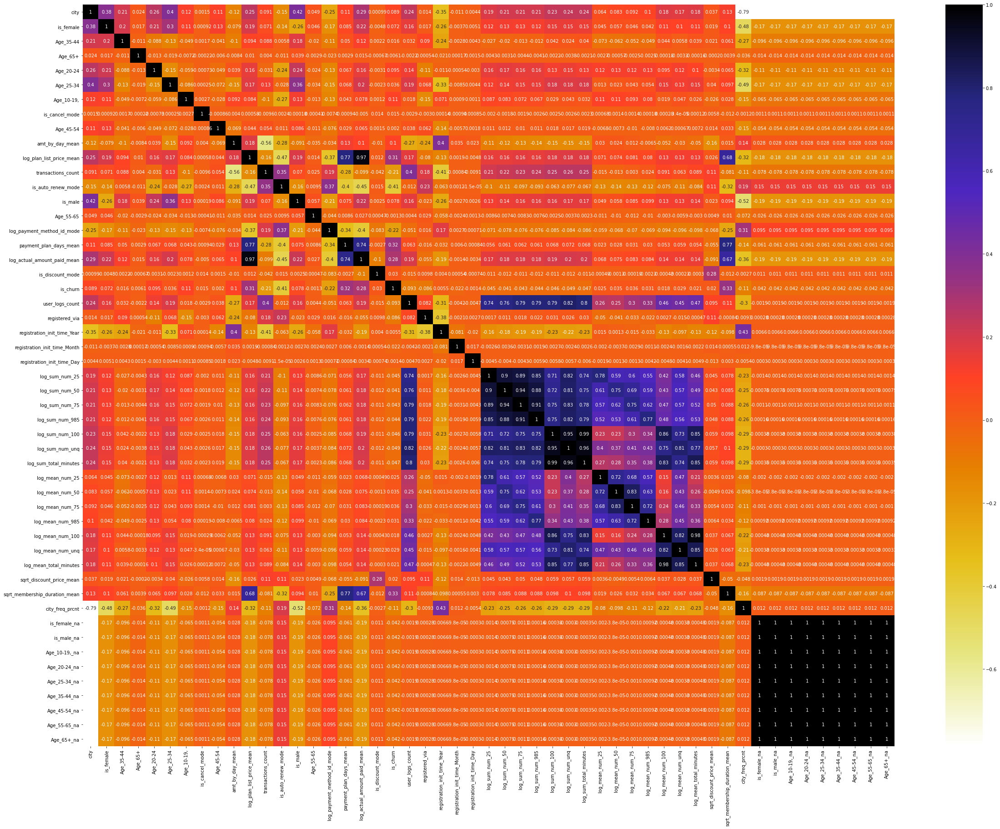

In [21]:
#Using Pearson Correlation
plt.figure(figsize=(40,30))
cor = X_train_imputed.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [22]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if corr_matrix.iloc[i, j] > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [23]:
corr_features = correlation(X_train_imputed, 0.7)
len(set(corr_features))

25

In [24]:
corr_features

{'Age_10-19,_na',
 'Age_20-24_na',
 'Age_25-34_na',
 'Age_35-44_na',
 'Age_45-54_na',
 'Age_55-65_na',
 'Age_65+_na',
 'is_male_na',
 'log_actual_amount_paid_mean',
 'log_mean_num_100',
 'log_mean_num_25',
 'log_mean_num_50',
 'log_mean_num_75',
 'log_mean_num_985',
 'log_mean_num_unq',
 'log_mean_total_minutes',
 'log_sum_num_100',
 'log_sum_num_25',
 'log_sum_num_50',
 'log_sum_num_75',
 'log_sum_num_985',
 'log_sum_num_unq',
 'log_sum_total_minutes',
 'payment_plan_days_mean',
 'sqrt_membership_duration_mean'}

In [41]:
selected_variables

['amt_by_day_mean',
 'log_plan_list_price_mean',
 'transactions_count',
 'is_auto_renew_mode',
 'log_payment_method_id_mode',
 'payment_plan_days_mean',
 'log_actual_amount_paid_mean',
 'user_logs_count',
 'registered_via',
 'registration_init_time_Month',
 'log_sum_num_25',
 'log_sum_num_50',
 'log_sum_num_75',
 'log_sum_num_985',
 'log_sum_num_100',
 'log_sum_num_unq',
 'log_sum_total_minutes',
 'log_mean_num_25',
 'log_mean_num_50',
 'log_mean_num_985',
 'log_mean_num_100',
 'log_mean_num_unq',
 'log_mean_total_minutes',
 'sqrt_discount_price_mean',
 'sqrt_membership_duration_mean',
 'city_freq_prcnt',
 'is_churn']

In [25]:
X_train_imputed.drop(corr_features,axis=1)

,city,is_female,Age_35-44,Age_65+,Age_20-24,Age_25-34,"Age_10-19,",is_cancel_mode,Age_45-54,amt_by_day_mean,log_plan_list_price_mean,transactions_count,is_auto_renew_mode,is_male,Age_55-65,msno,log_payment_method_id_mode,is_discount_mode,is_churn,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,sqrt_discount_price_mean,city_freq_prcnt,is_female_na
0,18.0,1.0,1.0,0.0,0.0,0.0,0.0,0,0.0,2.483333,1.877947,2,0,0.0,0.0,waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=,1.591065,0,1,4.000000,9.000000,2005.000000,4.000000,6.000000,0.000000,0.916030,0
1,11.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0.0,4.973333,2.176670,10,1,0.0,0.0,fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=,1.602060,0,1,15.000000,9.000000,2005.000000,10.000000,16.000000,0.000000,1.067367,0
2,13.0,1.0,0.0,0.0,1.0,0.0,0.0,0,0.0,3.109214,2.810680,3,0,0.0,0.0,mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=,1.255273,0,1,61.000000,9.000000,2005.000000,11.000000,2.000000,0.000000,11.411531,0
3,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0.0,4.893955,2.654497,9,0,1.0,0.0,XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=,1.591065,0,1,77.000000,9.000000,2005.000000,12.000000,28.000000,0.000000,0.596715,0
4,6.0,1.0,0.0,0.0,1.0,0.0,0.0,0,0.0,0.000000,2.038873,22,1,0.0,0.0,GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=,1.531479,0,1,48.000000,9.000000,2006.000000,3.000000,31.000000,0.615998,3.065743,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082185,13.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.000000,2.159812,27,1,1.0,0.0,OHnZbu+EVaP+vN7Z+OfT5OMcp90MWFZonmM0o3pb8FY=,1.612784,0,0,57.000000,7.000000,2011.000000,8.000000,31.000000,0.000000,11.411531,0
1082186,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,3.300000,2.000000,9,1,0.0,0.0,S92bDK//uI6hk3u1vuApro0qJBQOToBozZ7lL1yTC+w=,1.623249,0,0,9.000000,7.000000,2011.000000,9.000000,3.000000,0.000000,50.683304,0
1082187,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,3.300000,2.000000,20,1,0.0,0.0,eUa3xo16vpAjr43Cjlb6Kjf1NTILYyJIkBayJQdXWnw=,1.623249,0,0,4.000000,7.000000,2011.000000,9.000000,5.000000,0.000000,50.683304,0
1082188,5.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.000000,2.155047,21,1,0.0,0.0,iZE41tbAQ65rJq60olkJT4BJzuUAYgQdfbEemXe/TTk=,1.602060,0,0,63.000000,9.000000,2011.000000,9.000000,5.000000,0.609930,8.363159,0


In [28]:
X_train_imputed.drop(['city','msno'],axis=1)

,is_female,Age_35-44,Age_65+,Age_20-24,Age_25-34,"Age_10-19,",is_cancel_mode,Age_45-54,amt_by_day_mean,log_plan_list_price_mean,transactions_count,is_auto_renew_mode,is_male,Age_55-65,log_payment_method_id_mode,payment_plan_days_mean,log_actual_amount_paid_mean,is_discount_mode,is_churn,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt,is_female_na,is_male_na,"Age_10-19,_na",Age_20-24_na,Age_25-34_na,Age_35-44_na,Age_45-54_na,Age_55-65_na,Age_65+_na
0,1.0,1.0,0.0,0.0,0.0,0.0,0,0.0,2.483333,1.877947,2,0,0.0,0.0,1.591065,18.500000,1.877947,0,1,4.000000,9.000000,2005.000000,4.000000,6.000000,0.845098,0.477121,0.602060,0.301030,1.875061,1.919078,2.531254,0.397940,0.176091,0.243038,0.096910,1.290035,1.332438,1.933011,0.000000,4.301163,0.916030,0,0,0,0,0,0,0,0,0
1,1.0,0.0,0.0,0.0,1.0,0.0,0,0.0,4.973333,2.176670,10,1,0.0,0.0,1.602060,30.000000,2.176670,0,1,15.000000,9.000000,2005.000000,10.000000,16.000000,1.755875,1.113943,1.079181,1.431364,2.826723,2.807535,3.432473,0.675167,0.255273,0.238882,0.436693,1.659599,1.640813,2.258623,0.000000,5.594640,1.067367,0,0,0,0,0,0,0,0,0
2,1.0,0.0,0.0,1.0,0.0,0.0,0,0.0,3.109214,2.810680,3,0,0.0,0.0,1.255273,283.333333,2.810680,0,1,61.000000,9.000000,2005.000000,11.000000,2.000000,2.721811,2.220108,2.181844,2.155336,3.105510,3.132580,3.779781,0.983308,0.568779,0.541006,0.522166,1.340151,1.366040,1.998756,0.000000,12.165525,11.411531,0,0,0,0,0,0,0,0,0
3,0.0,0.0,0.0,0.0,1.0,0.0,0,0.0,4.893955,2.654497,9,0,1.0,0.0,1.591065,97.222222,2.654497,0,1,77.000000,9.000000,2005.000000,12.000000,28.000000,2.136721,1.690196,1.806180,2.436163,3.800373,3.819610,4.448471,0.441889,0.210419,0.259637,0.656335,1.919078,1.938091,2.563154,0.000000,10.143416,0.596715,0,0,0,0,0,0,0,0,0
4,1.0,0.0,0.0,1.0,0.0,0.0,0,0.0,0.000000,2.038873,22,1,0.0,0.0,1.531479,21.818182,2.176091,0,1,48.000000,9.000000,2006.000000,3.000000,31.000000,1.929419,1.544068,1.322219,1.414973,2.885926,2.829304,3.524408,0.439333,0.232573,0.151268,0.182082,1.230449,1.177296,1.849227,0.615998,5.389384,3.065743,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082185,0.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.000000,2.159812,27,1,1.0,0.0,1.612784,29.037037,2.159812,0,0,57.000000,7.000000,2011.000000,8.000000,31.000000,2.093422,1.602060,1.230449,1.361728,2.809560,2.799341,3.434739,0.499398,0.226396,0.107448,0.141752,1.089843,1.080449,1.687711,0.000000,5.426274,11.411531,0,0,0,0,0,0,0,0,0
1082186,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,3.300000,2.000000,9,1,0.0,0.0,1.623249,30.000000,2.000000,0,0,9.000000,7.000000,2011.000000,9.000000,3.000000,1.716003,1.255273,1.041393,1.041393,1.579784,1.924279,2.377473,0.823909,0.460731,0.324511,0.324511,0.708515,1.009545,1.437560,0.000000,5.517648,50.683304,0,0,0,0,0,0,0,0,0
1082187,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,3.300000,2.000000,20,1,0.0,0.0,1.623249,30.000000,2.000000,0,0,4.000000,7.000000,2011.000000,9.000000,5.000000,0.000000,0.000000,0.301030,0.000000,2.599883,2.555094,3.235588,0.000000,0.000000,0.096910,0.000000,2.001084,1.956649,2.634284,0.000000,5.518152,50.683304,0,0,0,0,0,0,0,0,0
1082188,1.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.000000,2.155047,21,1,0.0,0.0,1.602060,28.714286,2.176091,0,0,63.000000,9.000000,2011.000000,9.000000,5.000000,2.155336,1.568202,1.462398,1.431364,2.922725,2.942504,3.532258,0.512413,0.196295,0.159701,0.150049,1.154419,1.172862,1.740751,0.609930,6.513722,8.363159,0,0,0,0,0,0,0,0,0


### Dataset pre-processing

In [27]:
#!pip3 install pyMechkar
from pyMechkar.analysis import train_test

In [ ]:
selected_X_train_imputed_1 = X_train_imputed_v2[selected_variables_1]

In [32]:
X_train_imputed['is_churn']= train_flat_file['is_churn']

In [34]:
train_1, test_1 = train_test(data=X_train_imputed, prop=0.7, seed=53)
## with a seed of 2 we got unbalaced partition, we changed it to 53

Begining analysis...
Factorizing... please wait
[]****************************************************
['The variable msno is not well defined. This data type is not allowed in Table1... avoided']
[]*****************************************************
[]*****************************************************
['Unable to calcualte the Fisher exact test for variables msno and split... The p-value may be incorrect']
------ Finished in 447.0058925151825econds -----
 
You got a perfectly balanced training and test datasets
 


In [ ]:
write_data(df=train, full_url=project_url+'Data/Models/train.csv')
write_data(df=test, full_url=project_url+'Data/Models/test.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/Models/train.csv
Saved csv in drive/MyDrive/DataScience/project/Data/Models/test.csv


In [ ]:
train = read_data(full_url=project_url+'Data/Models/train.csv')
test = read_data(full_url=project_url+'Data/Models/test.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/Models/train.csv
Upload csv from drive/MyDrive/DataScience/project/Data/Models/test.csv


In [35]:
X_train_1 = train_1.iloc[:,:-2]
y_train_1 = train_1.is_churn
X_test_1 = test_1.iloc[:,:-2]
y_test_1 = test_1.is_churn

In [36]:
y_train_1.value_counts() / len(y_train_1)

0    0.875981
1    0.124019
Name: is_churn, dtype: float64

In [37]:
y_test_1.value_counts() / len(y_test_1)

0    0.875155
1    0.124845
Name: is_churn, dtype: float64

the proportion of “Churned” is similar in the training and validation sets. 

In [ ]:
X_train_1.head()

,amt_by_day_mean,log_plan_list_price_mean,transactions_count,is_auto_renew_mode,log_payment_method_id_mode,payment_plan_days_mean,log_actual_amount_paid_mean,user_logs_count,registered_via,registration_init_time_Month,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_75,log_mean_num_985,log_mean_num_unq,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt
603997,3.300000,2.000000,11,1,1.623249,30.0,2.000000,25.000000,7.000000,7.000000,2.557507,3.127695,0.623249,0.274158,0.146128,1.187521,0.000000,5.257030,50.683304
904319,3.300000,2.000000,13,1,1.623249,30.0,2.000000,37.984591,6.781832,6.541348,2.768873,3.385701,0.714845,0.244286,0.256797,1.339728,0.000000,5.519197,29.853872
395398,3.591304,2.061518,23,1,1.623249,30.0,2.036386,40.362896,7.311182,6.668978,2.772871,3.390576,0.722294,0.245187,0.254519,1.341508,2.545243,5.262666,28.059227
59280,5.483333,2.218798,2,0,1.477121,30.0,2.218798,4.000000,4.000000,9.000000,1.591065,2.045174,0.740363,0.096910,0.000000,1.021189,0.000000,5.522681,1.067367
171528,4.300000,2.113943,2,1,1.623249,30.0,2.113943,20.000000,7.000000,2.000000,2.367356,2.981873,0.633468,0.130334,0.255273,1.100371,0.000000,5.385165,50.683304


### Pairwise correlation

In [13]:
X_train_imputed.columns

Index(['city', 'is_female', 'Age_35-44', 'Age_65+', 'Age_20-24', 'Age_25-34',
       'Age_10-19,', 'is_cancel_mode', 'Age_45-54', 'amt_by_day_mean',
       'log_plan_list_price_mean', 'transactions_count', 'is_auto_renew_mode',
       'is_male', 'Age_55-65', 'msno', 'log_payment_method_id_mode',
       'payment_plan_days_mean', 'log_actual_amount_paid_mean',
       'is_discount_mode', 'is_churn', 'user_logs_count', 'registered_via',
       'registration_init_time_Year', 'registration_init_time_Month',
       'registration_init_time_Day', 'log_sum_num_25', 'log_sum_num_50',
       'log_sum_num_75', 'log_sum_num_985', 'log_sum_num_100',
       'log_sum_num_unq', 'log_sum_total_minutes', 'log_mean_num_25',
       'log_mean_num_50', 'log_mean_num_75', 'log_mean_num_985',
       'log_mean_num_100', 'log_mean_num_unq', 'log_mean_total_minutes',
       'sqrt_discount_price_mean', 'sqrt_membership_duration_mean',
       'city_freq_prcnt', 'is_female_na', 'is_male_na', 'Age_10-19,_na',
       '

In [29]:
num_cols_1 = ['amt_by_day_mean',
       'log_plan_list_price_mean', 'transactions_count', 'log_payment_method_id_mode',
       'payment_plan_days_mean', 'log_actual_amount_paid_mean','user_logs_count', 'registered_via',
       'registration_init_time_Day', 'log_sum_num_25', 'log_sum_num_50',
       'log_sum_num_75', 'log_sum_num_985', 'log_sum_num_100',
       'log_sum_num_unq', 'log_sum_total_minutes', 'log_mean_num_25',
       'log_mean_num_50', 'log_mean_num_75', 'log_mean_num_985',
       'log_mean_num_100', 'log_mean_num_unq', 'log_mean_total_minutes',
       'sqrt_discount_price_mean', 'sqrt_membership_duration_mean',
       'city_freq_prcnt']

In [30]:
# Calculate the pairwise Spearman correlation
corr = pg.pairwise_corr(X_train_imputed, columns=num_cols_1, method='spearman')
# Sort the correlation by p-values and display the first rows
corr.sort_values(by=['p-unc'])[['X', 'Y', 'n', 'r', 'p-unc']]

,X,Y,n,r,p-unc
0,amt_by_day_mean,log_plan_list_price_mean,1082190,0.384708,0.000000
223,log_sum_num_75,log_sum_total_minutes,1082190,0.766546,0.000000
222,log_sum_num_75,log_sum_num_unq,1082190,0.813645,0.000000
221,log_sum_num_75,log_sum_num_100,1082190,0.735343,0.000000
220,log_sum_num_75,log_sum_num_985,1082190,0.903087,0.000000
...,...,...,...,...,...
76,log_payment_method_id_mode,registration_init_time_Day,1082190,-0.001688,0.079166
294,log_mean_num_50,sqrt_discount_price_mean,1082190,-0.001566,0.103308
117,log_actual_amount_paid_mean,registration_init_time_Day,1082190,-0.001031,0.283433
181,registration_init_time_Day,log_mean_num_75,1082190,-0.000878,0.361321


In [31]:
higher_corr = corr[(corr['r'] >= 0.7) ]
higher_corr

,X,Y,method,tail,n,r,CI95%,r2,adj_r2,z,p-unc,power
28,log_plan_list_price_mean,log_actual_amount_paid_mean,spearman,two-sided,1082190,0.916949,"[0.92, 0.92]",0.840795,0.840795,1.569517,0.0,1.0
137,user_logs_count,log_sum_num_25,spearman,two-sided,1082190,0.745288,"[0.74, 0.75]",0.555454,0.555453,0.962270,0.0,1.0
138,user_logs_count,log_sum_num_50,spearman,two-sided,1082190,0.760913,"[0.76, 0.76]",0.578989,0.578988,0.998380,0.0,1.0
139,user_logs_count,log_sum_num_75,spearman,two-sided,1082190,0.795794,"[0.8, 0.8]",0.633289,0.633288,1.087038,0.0,1.0
140,user_logs_count,log_sum_num_985,spearman,two-sided,1082190,0.786838,"[0.79, 0.79]",0.619114,0.619114,1.063076,0.0,1.0
141,user_logs_count,log_sum_num_100,spearman,two-sided,1082190,0.837283,"[0.84, 0.84]",0.701043,0.701042,1.212015,0.0,1.0
142,user_logs_count,log_sum_num_unq,spearman,two-sided,1082190,0.856159,"[0.86, 0.86]",0.733008,0.733008,1.278778,0.0,1.0
143,user_logs_count,log_sum_total_minutes,spearman,two-sided,1082190,0.850179,"[0.85, 0.85]",0.722805,0.722804,1.256799,0.0,1.0
189,log_sum_num_25,log_sum_num_50,spearman,two-sided,1082190,0.891158,"[0.89, 0.89]",0.794163,0.794163,1.427526,0.0,1.0
190,log_sum_num_25,log_sum_num_75,spearman,two-sided,1082190,0.878514,"[0.88, 0.88]",0.771788,0.771787,1.369221,0.0,1.0


In [32]:
# Calculate the Pearson correlation between "is_churn" and the personality dimensions
corr = pg.pairwise_corr(X_train_imputed, columns=[["is_churn"], num_cols_1], method='pearson')
corr.sort_values(by=['p-unc'])[['X', 'Y', 'n', 'r', 'p-unc']]

,X,Y,n,r,p-unc
0,is_churn,amt_by_day_mean,1082190,0.104518,0.000000e+00
15,is_churn,log_sum_total_minutes,1082190,-0.046638,0.000000e+00
14,is_churn,log_sum_num_unq,1082190,-0.048546,0.000000e+00
13,is_churn,log_sum_num_100,1082190,-0.046187,0.000000e+00
24,is_churn,sqrt_membership_duration_mean,1082190,0.333911,0.000000e+00
11,is_churn,log_sum_num_75,1082190,-0.043413,0.000000e+00
10,is_churn,log_sum_num_50,1082190,-0.041361,0.000000e+00
9,is_churn,log_sum_num_25,1082190,-0.045018,0.000000e+00
12,is_churn,log_sum_num_985,1082190,-0.043688,0.000000e+00
7,is_churn,registered_via,1082190,-0.086467,0.000000e+00


In [35]:
high_cor_list = ['log_sum_num_25','log_sum_num_50','log_sum_num_75','log_sum_num_985','log_sum_num_100','log_mean_total_minutes','log_mean_num_50','log_mean_num_100']

# Feature Selection Strategy

In [15]:
X_train_imputed['msno'] = X_train_imputed['msno'].astype('|S')
X_train_imputed['city'] = X_train_imputed['city'].astype('category')
X_train_imputed['is_female'] = X_train_imputed['is_female'].astype('category')
X_train_imputed['Age_35-44'] = X_train_imputed['Age_35-44'].astype('category')
X_train_imputed['Age_65+'] = X_train_imputed['Age_65+'].astype('category')
X_train_imputed['Age_20-24'] = X_train_imputed['Age_20-24'].astype('category')
X_train_imputed['Age_25-34'] = X_train_imputed['Age_25-34'].astype('category')
X_train_imputed['Age_10-19,'] = X_train_imputed['Age_10-19,'].astype('category')
X_train_imputed['Age_45-54'] = X_train_imputed['Age_45-54'].astype('category')
X_train_imputed['is_male'] = X_train_imputed['is_male'].astype('category')
X_train_imputed['Age_55-65'] = X_train_imputed['Age_55-65'].astype('category')
X_train_imputed['is_female_na'] = X_train_imputed['is_female_na'].astype('category')
X_train_imputed['is_male_na'] = X_train_imputed['is_male_na'].astype('category')
X_train_imputed['Age_10-19,_na'] = X_train_imputed['Age_10-19,_na'].astype('category')
X_train_imputed['Age_20-24_na'] = X_train_imputed['Age_20-24_na'].astype('category')
X_train_imputed['Age_25-34_na'] = X_train_imputed['Age_25-34_na'].astype('category')
X_train_imputed['Age_35-44_na'] = X_train_imputed['Age_35-44_na'].astype('category')
X_train_imputed['Age_45-54_na'] = X_train_imputed['Age_45-54_na'].astype('category')
X_train_imputed['Age_55-65_na'] = X_train_imputed['Age_55-65_na'].astype('category')
X_train_imputed['Age_65+_na'] = X_train_imputed['Age_65+_na'].astype('category')
X_train_imputed['is_churn'] = X_train_imputed['is_churn'].astype('category')
X_train_imputed['is_cancel_mode'] = X_train_imputed['is_cancel_mode'].astype('category')
X_train_imputed['is_auto_renew_mode'] = X_train_imputed['is_auto_renew_mode'].astype('category')
X_train_imputed['is_discount_mode'] = X_train_imputed['is_discount_mode'].astype('category')

print( '########### train data types ###########')
display(X_train_imputed.dtypes)

'''X_test_imputed['msno'] = X_test_imputed['msno'].astype('|S')
X_test_imputed['city'] = X_test_imputed['city'].astype('category')
X_test_imputed['is_female'] = X_test_imputed['is_female'].astype('category')
X_test_imputed['Age_35-44'] = X_test_imputed['Age_35-44'].astype('category')
X_test_imputed['Age_65+'] = X_test_imputed['Age_65+'].astype('category')
X_test_imputed['Age_20-24'] = X_test_imputed['Age_20-24'].astype('category')
X_test_imputed['Age_25-34'] = X_test_imputed['Age_25-34'].astype('category')
X_test_imputed['Age_10-19,'] = X_test_imputed['Age_10-19,'].astype('category')
X_test_imputed['Age_45-54'] = X_test_imputed['Age_45-54'].astype('category')
X_test_imputed['is_male'] = X_test_imputed['is_male'].astype('category')
X_test_imputed['Age_55-65'] = X_test_imputed['Age_55-65'].astype('category')
X_test_imputed['is_female_na'] = X_test_imputed['is_female_na'].astype('category')
X_test_imputed['is_male_na'] = X_test_imputed['is_male_na'].astype('category')
X_test_imputed['Age_10-19,_na'] = X_test_imputed['Age_10-19,_na'].astype('category')
X_test_imputed['Age_20-24_na'] = X_test_imputed['Age_20-24_na'].astype('category')
X_test_imputed['Age_25-34_na'] = X_test_imputed['Age_25-34_na'].astype('category')
X_test_imputed['Age_35-44_na'] = X_test_imputed['Age_35-44_na'].astype('category')
X_test_imputed['Age_45-54_na'] = X_test_imputed['Age_45-54_na'].astype('category')
X_test_imputed['Age_55-65_na'] = X_test_imputed['Age_55-65_na'].astype('category')
X_test_imputed['Age_65+_na'] = X_test_imputed['Age_65+_na'].astype('category')
X_test_imputed['is_churn'] = X_test_imputed['is_churn'].astype('category')
X_test_imputed['is_cancel_mode'] = X_test_imputed['is_cancel_mode'].astype('category')
X_test_imputed['is_auto_renew_mode'] = X_test_imputed['is_auto_renew_mode'].astype('category')
X_test_imputed['is_discount_mode'] = X_test_imputed['is_discount_mode'].astype('category')'''

print('########### test data types ###########')
display(X_test_imputed.dtypes) 

########### train data types ###########


city                             category
is_female                        category
Age_35-44                        category
Age_65+                          category
Age_20-24                        category
Age_25-34                        category
Age_10-19,                       category
is_cancel_mode                   category
Age_45-54                        category
amt_by_day_mean                   float64
log_plan_list_price_mean          float64
transactions_count                  int64
is_auto_renew_mode               category
is_male                          category
Age_55-65                        category
msno                                 |S44
log_payment_method_id_mode        float64
payment_plan_days_mean            float64
log_actual_amount_paid_mean       float64
is_discount_mode                 category
is_churn                         category
user_logs_count                   float64
registered_via                    float64
registration_init_time_Year       

########### test data types ###########


user_logs_count                  float64
registered_via                   float64
registration_init_time_Year      float64
registration_init_time_Month     float64
registration_init_time_Day       float64
log_sum_num_25                   float64
log_sum_num_50                   float64
log_sum_num_75                   float64
log_sum_num_985                  float64
log_sum_num_100                  float64
log_sum_num_unq                  float64
log_sum_total_minutes            float64
log_mean_num_25                  float64
log_mean_num_50                  float64
log_mean_num_75                  float64
log_mean_num_985                 float64
log_mean_num_100                 float64
log_mean_num_unq                 float64
log_mean_total_minutes           float64
sqrt_discount_price_mean         float64
sqrt_membership_duration_mean    float64
city_freq_prcnt                  float64
city                             float64
is_female                        float64
Age_35-44       

In [27]:
varSel = pd.DataFrame({'Variable': X_train_imputed.columns})
varSel.head()

,Variable
0,city
1,is_female
2,Age_35-44
3,Age_65+
4,Age_20-24


### Univariable Analysis

In [31]:
nm = X_train_imputed.columns
nm

Index(['city', 'is_female', 'Age_35-44', 'Age_65+', 'Age_20-24', 'Age_25-34',
       'Age_10-19,', 'is_cancel_mode', 'Age_45-54', 'amt_by_day_mean',
       'log_plan_list_price_mean', 'transactions_count', 'is_auto_renew_mode',
       'is_male', 'Age_55-65', 'msno', 'log_payment_method_id_mode',
       'payment_plan_days_mean', 'log_actual_amount_paid_mean',
       'is_discount_mode', 'is_churn', 'user_logs_count', 'registered_via',
       'registration_init_time_Year', 'registration_init_time_Month',
       'registration_init_time_Day', 'log_sum_num_25', 'log_sum_num_50',
       'log_sum_num_75', 'log_sum_num_985', 'log_sum_num_100',
       'log_sum_num_unq', 'log_sum_total_minutes', 'log_mean_num_25',
       'log_mean_num_50', 'log_mean_num_75', 'log_mean_num_985',
       'log_mean_num_100', 'log_mean_num_unq', 'log_mean_total_minutes',
       'sqrt_discount_price_mean', 'sqrt_membership_duration_mean',
       'city_freq_prcnt', 'is_female_na', 'is_male_na', 'Age_10-19,_na',
       '

In [32]:
X_train_imputed_v2 = X_train_imputed[nm]
X_train_imputed_v2.head()

,city,is_female,Age_35-44,Age_65+,Age_20-24,Age_25-34,"Age_10-19,",is_cancel_mode,Age_45-54,amt_by_day_mean,log_plan_list_price_mean,transactions_count,is_auto_renew_mode,is_male,Age_55-65,msno,log_payment_method_id_mode,payment_plan_days_mean,log_actual_amount_paid_mean,is_discount_mode,is_churn,user_logs_count,registered_via,registration_init_time_Year,registration_init_time_Month,registration_init_time_Day,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_75,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt,is_female_na,is_male_na,"Age_10-19,_na",Age_20-24_na,Age_25-34_na,Age_35-44_na,Age_45-54_na,Age_55-65_na,Age_65+_na
0,18.0,1.0,1.0,0.0,0.0,0.0,0.0,0,0.0,2.483333,1.877947,2,0,0.0,0.0,b'waLDQMmcOu2jLDaV1ddDkgCrB/jl6sD66Xzs0Vqax1Y=',1.591065,18.500000,1.877947,0,1,4.0,9.0,2005.0,4.0,6.0,0.845098,0.477121,0.602060,0.301030,1.875061,1.919078,2.531254,0.397940,0.176091,0.243038,0.096910,1.290035,1.332438,1.933011,0.000000,4.301163,0.916030,0,0,0,0,0,0,0,0,0
1,11.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0.0,4.973333,2.176670,10,1,0.0,0.0,b'fGwBva6hikQmTJzrbz/2Ezjm5Cth5jZUNvXigKK2AFA=',1.602060,30.000000,2.176670,0,1,15.0,9.0,2005.0,10.0,16.0,1.755875,1.113943,1.079181,1.431364,2.826723,2.807535,3.432473,0.675167,0.255273,0.238882,0.436693,1.659599,1.640813,2.258623,0.000000,5.594640,1.067367,0,0,0,0,0,0,0,0,0
2,13.0,1.0,0.0,0.0,1.0,0.0,0.0,0,0.0,3.109214,2.810680,3,0,0.0,0.0,b'mT5V8rEpa+8wuqi6x0DoVd3H5icMKkE9Prt49UlmK+4=',1.255273,283.333333,2.810680,0,1,61.0,9.0,2005.0,11.0,2.0,2.721811,2.220108,2.181844,2.155336,3.105510,3.132580,3.779781,0.983308,0.568779,0.541006,0.522166,1.340151,1.366040,1.998756,0.000000,12.165525,11.411531,0,0,0,0,0,0,0,0,0
3,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0.0,4.893955,2.654497,9,0,1.0,0.0,b'XaPhtGLk/5UvvOYHcONTwsnH97P4eGECeq+BARGItRw=',1.591065,97.222222,2.654497,0,1,77.0,9.0,2005.0,12.0,28.0,2.136721,1.690196,1.806180,2.436163,3.800373,3.819610,4.448471,0.441889,0.210419,0.259637,0.656335,1.919078,1.938091,2.563154,0.000000,10.143416,0.596715,0,0,0,0,0,0,0,0,0
4,6.0,1.0,0.0,0.0,1.0,0.0,0.0,0,0.0,0.000000,2.038873,22,1,0.0,0.0,b'GBy8qSz16X5iYWD+3CMxv/Hm6OPSrXBYtmbnlRtknW0=',1.531479,21.818182,2.176091,0,1,48.0,9.0,2006.0,3.0,31.0,1.929419,1.544068,1.322219,1.414973,2.885926,2.829304,3.524408,0.439333,0.232573,0.151268,0.182082,1.230449,1.177296,1.849227,0.615998,5.389384,3.065743,0,0,0,0,0,0,0,0,0


In [33]:
tab1 = Table1(data=X_train_imputed_v2, y="is_churn")

Begining analysis...
Factorizing... please wait
[]***************************************************
["The variable msno doesn't exists in the dataset... avoiding"]
[]****************************************************
[]****************************************************
['Unable to calcualte the Fisher exact test for variables msno and is_churn... The p-value may be incorrect']
------ Finished in 813.6210103034973econds -----


In [34]:
tab1

,Variables,Categories,Population,Category_1,Category_0,p_value
0,Individuals,n,1082190,134480,947710,NaN
1,city,1,"487,285.00 ( 45.00%)","43,828.00 ( 32.60%)","443,457.00 ( 46.80%)",NaN
2,city,NaN,"120,759.00 ( 11.20%)","10,268.00 ( 7.60%)","110,491.00 ( 11.70%)",0.0
3,city,13,"109,714.00 ( 10.10%)","17,893.00 ( 13.30%)","91,821.00 ( 9.70%)",NaN
4,city,5,"80,406.00 ( 7.40%)","14,142.00 ( 10.50%)","66,264.00 ( 7.00%)",NaN
...,...,...,...,...,...,...
129,Age_45-54_na,1,"120,759.00 ( 11.20%)","10,268.00 ( 7.60%)","110,491.00 ( 11.70%)",0.0
130,Age_55-65_na,0,"961,431.00 ( 88.80%)","124,212.00 ( 92.40%)","837,219.00 ( 88.30%)",NaN
131,Age_55-65_na,1,"120,759.00 ( 11.20%)","10,268.00 ( 7.60%)","110,491.00 ( 11.70%)",0.0
132,Age_65+_na,0,"961,431.00 ( 88.80%)","124,212.00 ( 92.40%)","837,219.00 ( 88.30%)",NaN


In [35]:
tab1[tab1['p_value']<0.05]

,Variables,Categories,Population,Category_1,Category_0,p_value
2,city,NaN,"120,759.00 ( 11.20%)","10,268.00 ( 7.60%)","110,491.00 ( 11.70%)",0.000
9,is_female,1,"209,347.00 ( 19.30%)","36,200.00 ( 26.90%)","173,147.00 ( 18.30%)",0.000
11,Age_35-44,1,"73,733.00 ( 6.80%)","10,646.00 ( 7.90%)","63,087.00 ( 6.70%)",0.000
13,Age_65+,1,"1,678.00 ( 0.20%)",294.00 ( 0.20%),"1,384.00 ( 0.10%)",0.000
15,Age_20-24,1,"102,624.00 ( 9.50%)","22,647.00 ( 16.80%)","79,977.00 ( 8.40%)",0.000
17,Age_25-34,1,"197,792.00 ( 18.30%)","29,565.00 ( 22.00%)","168,227.00 ( 17.80%)",0.000
19,"Age_10-19,",1,"34,700.00 ( 3.20%)","10,971.00 ( 8.20%)","23,729.00 ( 2.50%)",0.000
23,Age_45-54,1,"24,344.00 ( 2.20%)","3,133.00 ( 2.30%)","21,211.00 ( 2.20%)",0.035
24,amt_by_day_mean,Mean (SD),2.90 ( 2.00),3.40 ( 2.00),2.80 ( 2.00),0.000
27,log_plan_list_price_mean,Mean (SD),2.10 ( 0.20),2.30 ( 0.40),2.10 ( 0.10),0.000


In [36]:
vn1 = tab1.loc[tab1['p_value']<0.05,'Variables'].unique()
print(len(vn1))
vn1

47


array(['city', 'is_female', 'Age_35-44', 'Age_65+', 'Age_20-24',
       'Age_25-34', 'Age_10-19,', 'Age_45-54', 'amt_by_day_mean',
       'log_plan_list_price_mean', 'transactions_count',
       'is_auto_renew_mode', 'is_male', 'log_payment_method_id_mode',
       'payment_plan_days_mean', 'log_actual_amount_paid_mean',
       'is_discount_mode', 'user_logs_count', 'registered_via',
       'registration_init_time_Year', 'registration_init_time_Month',
       'log_sum_num_25', 'log_sum_num_50', 'log_sum_num_75',
       'log_sum_num_985', 'log_sum_num_100', 'log_sum_num_unq',
       'log_sum_total_minutes', 'log_mean_num_25', 'log_mean_num_50',
       'log_mean_num_75', 'log_mean_num_985', 'log_mean_num_100',
       'log_mean_num_unq', 'log_mean_total_minutes',
       'sqrt_discount_price_mean', 'sqrt_membership_duration_mean',
       'city_freq_prcnt', 'is_female_na', 'is_male_na', 'Age_10-19,_na',
       'Age_20-24_na', 'Age_25-34_na', 'Age_35-44_na', 'Age_45-54_na',
       'Age_55-65_

We will add these variables to our variable selection table

In [37]:
varSel['Univarable'] = 0
varSel.loc[varSel['Variable'].isin(vn1), 'Univarable'] = 1
varSel

,Variable,Univarable
0,city,1
1,is_female,1
2,Age_35-44,1
3,Age_65+,1
4,Age_20-24,1
5,Age_25-34,1
6,"Age_10-19,",1
7,is_cancel_mode,0
8,Age_45-54,1
9,amt_by_day_mean,1


### Multivariable Analysis

In [64]:
## remove unnecessary vars
X = X_train_imputed_v2.copy()
y = X_train_imputed_v2['is_churn']
X = X.drop(['city', 'msno','is_churn'], axis = 1) 
X.head()
varSel.drop(varSel[varSel['Variable']=='city'].index, inplace = True) 
varSel.drop(varSel[varSel['Variable']=='msno'].index, inplace = True) 
varSel.drop(varSel[varSel['Variable']=='is_churn'].index, inplace = True) 
varSel

,Variable,Univarable
1,is_female,1
2,Age_35-44,1
3,Age_65+,1
4,Age_20-24,1
5,Age_25-34,1
6,"Age_10-19,",1
7,is_cancel_mode,0
8,Age_45-54,1
9,amt_by_day_mean,1
10,log_plan_list_price_mean,1


In [65]:
print([X.shape,y.shape])

[(1082190, 49), (1082190,)]


### Variable Selection using LASSO

In [51]:
lassomod = Lasso(alpha=0.01).fit(X, y)

In [52]:
model = SelectFromModel(lassomod, prefit=True)
model.get_support()

array([False, False, False, False, False, False, False, False, False,
       False,  True,  True, False, False, False,  True, False, False,
        True,  True,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True,  True, False, False, False, False, False,
       False, False, False, False])

In [66]:
len(varSel)

49

In [67]:
varSel['Lasso'] = model.get_support().astype('int64')
varSel

,Variable,Univarable,Lasso
1,is_female,1,0
2,Age_35-44,1,0
3,Age_65+,1,0
4,Age_20-24,1,0
5,Age_25-34,1,0
6,"Age_10-19,",1,0
7,is_cancel_mode,0,0
8,Age_45-54,1,0
9,amt_by_day_mean,1,0
10,log_plan_list_price_mean,1,0


### Variable Selection using Random Forest

In [69]:
rfmod = RandomForestClassifier().fit(X, y)

In [70]:
model = SelectFromModel(rfmod, prefit=True)
model.get_support()

array([False, False, False, False, False, False, False, False,  True,
        True,  True,  True, False, False,  True,  True,  True, False,
        True, False, False, False, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True, False, False, False, False, False, False,
       False, False, False, False])

In [71]:
varSel['RandomForest'] = model.get_support().astype('int64')
varSel

,Variable,Univarable,Lasso,RandomForest
1,is_female,1,0,0
2,Age_35-44,1,0,0
3,Age_65+,1,0,0
4,Age_20-24,1,0,0
5,Age_25-34,1,0,0
6,"Age_10-19,",1,0,0
7,is_cancel_mode,0,0,0
8,Age_45-54,1,0,0
9,amt_by_day_mean,1,0,1
10,log_plan_list_price_mean,1,0,1


### Variable Selection using Gradient Boosting classification

In [74]:
gbmod = GradientBoostingClassifier().fit(X, y)

In [75]:
model = SelectFromModel(gbmod, prefit=True)
model.get_support()

array([False, False, False, False, False, False, False, False, False,
        True,  True,  True, False, False, False,  True, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False])

In [76]:
varSel['GradientBoost'] = model.get_support().astype('int64')
varSel

,Variable,Univarable,Lasso,RandomForest,GradientBoost
1,is_female,1,0,0,0
2,Age_35-44,1,0,0,0
3,Age_65+,1,0,0,0
4,Age_20-24,1,0,0,0
5,Age_25-34,1,0,0,0
6,"Age_10-19,",1,0,0,0
7,is_cancel_mode,0,0,0,0
8,Age_45-54,1,0,0,0
9,amt_by_day_mean,1,0,1,0
10,log_plan_list_price_mean,1,0,1,1


### Variable Selection using SVM classification

In [77]:
from sklearn.svm import LinearSVC

svmmod = LinearSVC(C=0.01, penalty="l1",dual=False).fit(X, y)

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [78]:
model = SelectFromModel(svmmod, prefit=True)
model.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False,  True,  True,  True,
        True,  True,  True,  True, False,  True, False, False, False,
        True,  True, False, False])

In [79]:
varSel['SVM'] = model.get_support().astype('int64')
varSel

,Variable,Univarable,Lasso,RandomForest,GradientBoost,SVM
1,is_female,1,0,0,0,1
2,Age_35-44,1,0,0,0,1
3,Age_65+,1,0,0,0,1
4,Age_20-24,1,0,0,0,1
5,Age_25-34,1,0,0,0,1
6,"Age_10-19,",1,0,0,0,1
7,is_cancel_mode,0,0,0,0,1
8,Age_45-54,1,0,0,0,1
9,amt_by_day_mean,1,0,1,0,1
10,log_plan_list_price_mean,1,0,1,1,0


### Summarization and Selection of Variables 

In [80]:
varSel['Sum'] =  np.sum(varSel,axis=1)
varSel

,Variable,Univarable,Lasso,RandomForest,GradientBoost,SVM,Sum
1,is_female,1,0,0,0,1,2
2,Age_35-44,1,0,0,0,1,2
3,Age_65+,1,0,0,0,1,2
4,Age_20-24,1,0,0,0,1,2
5,Age_25-34,1,0,0,0,1,2
6,"Age_10-19,",1,0,0,0,1,2
7,is_cancel_mode,0,0,0,0,1,1
8,Age_45-54,1,0,0,0,1,2
9,amt_by_day_mean,1,0,1,0,1,3
10,log_plan_list_price_mean,1,0,1,1,0,3


In [81]:
varSel.groupby('Sum')['Variable'].count()

Sum
0     1
1     8
2    13
3    22
5     5
Name: Variable, dtype: int64

We can now decide a threshold for selecting our variables!

In [82]:
varSel[varSel['Sum']==5]

,Variable,Univarable,Lasso,RandomForest,GradientBoost,SVM,Sum
11,transactions_count,1,1,1,1,1,5
12,is_auto_renew_mode,1,1,1,1,1,5
17,payment_plan_days_mean,1,1,1,1,1,5
21,user_logs_count,1,1,1,1,1,5
41,sqrt_membership_duration_mean,1,1,1,1,1,5


In [83]:
varSel[varSel['Sum']>=4]

,Variable,Univarable,Lasso,RandomForest,GradientBoost,SVM,Sum
11,transactions_count,1,1,1,1,1,5
12,is_auto_renew_mode,1,1,1,1,1,5
17,payment_plan_days_mean,1,1,1,1,1,5
21,user_logs_count,1,1,1,1,1,5
41,sqrt_membership_duration_mean,1,1,1,1,1,5


In [84]:
varSel[varSel['Sum']>=3]

,Variable,Univarable,Lasso,RandomForest,GradientBoost,SVM,Sum
9,amt_by_day_mean,1,0,1,0,1,3
10,log_plan_list_price_mean,1,0,1,1,0,3
11,transactions_count,1,1,1,1,1,5
12,is_auto_renew_mode,1,1,1,1,1,5
16,log_payment_method_id_mode,1,0,1,0,1,3
17,payment_plan_days_mean,1,1,1,1,1,5
18,log_actual_amount_paid_mean,1,0,1,0,1,3
21,user_logs_count,1,1,1,1,1,5
22,registered_via,1,1,0,0,1,3
23,registration_init_time_Year,1,1,0,0,1,3


In [40]:
selected_variables = ['amt_by_day_mean','log_plan_list_price_mean','transactions_count','is_auto_renew_mode','log_payment_method_id_mode','payment_plan_days_mean','log_actual_amount_paid_mean','user_logs_count','registered_via','registration_init_time_Month','log_sum_num_25','log_sum_num_50','log_sum_num_75','log_sum_num_985','log_sum_num_100','log_sum_num_unq','log_sum_total_minutes','log_mean_num_25','log_mean_num_50','log_mean_num_985','log_mean_num_100','log_mean_num_unq','log_mean_total_minutes','sqrt_discount_price_mean','sqrt_membership_duration_mean',	'city_freq_prcnt','is_churn']

# Dataset pre-processing

In [11]:
#!pip3 install pyMechkar
from pyMechkar.analysis import train_test

In [114]:
X_train_imputed = X_train_imputed.drop(['city','msno'],axis = 1)
X_test_imputed = X_test_imputed.drop(['city','msno'],axis = 1)

In [115]:
selected_X_train_imputed = X_train_imputed[selected_variables]

In [116]:
train, test = train_test(data=selected_X_train_imputed, prop=0.7, seed=53)
## with a seed of 2 we got unbalaced partition, we changed it to 53

Begining analysis...
Factorizing... please wait
[]***************************
[]
[]****************************
[]****************************
[]
------ Finished in 35.80681538581848econds -----
 
You got a perfectly balanced training and test datasets
 


In [21]:
write_data(df=train, full_url=project_url+'Data/Models/train.csv')
write_data(df=test, full_url=project_url+'Data/Models/test.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/Models/train.csv
Saved csv in drive/MyDrive/DataScience/project/Data/Models/test.csv


In [7]:
train = read_data(full_url=project_url+'Data/Models/train.csv')
test = read_data(full_url=project_url+'Data/Models/test.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/Models/train.csv
Upload csv from drive/MyDrive/DataScience/project/Data/Models/test.csv


In [10]:
X_train = train.iloc[:,:-2]
y_train = train.is_churn
X_test = test.iloc[:,:-2]
y_test = test.is_churn

In [46]:
y_train.value_counts() / len(y_train)

0    0.875981
1    0.124019
Name: is_churn, dtype: float64

In [47]:
y_test.value_counts() / len(y_test)

0    0.875155
1    0.124845
Name: is_churn, dtype: float64

the proportion of “Churned” is similar in the training and validation sets. 

In [48]:
X_train.head()

,amt_by_day_mean,log_plan_list_price_mean,transactions_count,is_auto_renew_mode,log_payment_method_id_mode,payment_plan_days_mean,log_actual_amount_paid_mean,user_logs_count,registered_via,registration_init_time_Month,log_sum_num_25,log_sum_num_50,log_sum_num_75,log_sum_num_985,log_sum_num_100,log_sum_num_unq,log_sum_total_minutes,log_mean_num_25,log_mean_num_50,log_mean_num_985,log_mean_num_100,log_mean_num_unq,log_mean_total_minutes,sqrt_discount_price_mean,sqrt_membership_duration_mean,city_freq_prcnt
0,3.300000,2.000000,11,1,1.623249,30.0,2.000000,25.000000,7.000000,7.000000,1.908485,1.342423,1.361728,1.041393,2.474216,2.557507,3.127695,0.623249,0.264818,0.146128,1.109916,1.187521,1.737455,0.000000,5.257030,50.683304
1,3.300000,2.000000,13,1,1.623249,30.0,2.000000,37.984591,6.781832,6.541348,2.050173,1.486545,1.310405,1.334353,2.725515,2.768873,3.385701,0.714845,0.336628,0.256797,1.301404,1.339728,1.939751,0.000000,5.519197,29.853872
2,3.591304,2.061518,23,1,1.623249,30.0,2.036386,40.362896,7.311182,6.668978,2.063714,1.491417,1.320561,1.336238,2.730413,2.772871,3.390576,0.722294,0.334008,0.254519,1.304145,1.341508,1.942922,2.545243,5.262666,28.059227
3,5.483333,2.218798,2,0,1.477121,30.0,2.218798,4.000000,4.000000,9.000000,1.278754,0.000000,0.301030,0.000000,1.397940,1.591065,2.045174,0.740363,0.000000,0.000000,0.845098,1.021189,1.454700,0.000000,5.522681,1.067367
4,4.300000,2.113943,2,1,1.623249,30.0,2.113943,20.000000,7.000000,2.000000,1.826075,1.255273,0.903090,1.230449,2.285557,2.367356,2.981873,0.633468,0.267172,0.255273,1.025306,1.100371,1.689362,0.000000,5.385165,50.683304


# Models

## Logistic Regression

In [52]:
mod1 = LogisticRegression(random_state=1,max_iter=10000)
mod1.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [53]:
yhat1_tr = mod1.predict(X_train)
yhat1_tr

array([0, 0, 0, ..., 0, 0, 0])

In [54]:
pd.crosstab(y_train,yhat1_tr,normalize=True)

col_0,0,1
is_churn,,
0,0.860604,0.015378
1,0.084196,0.039823


In [55]:
### Train
mod1.score(X_train,y_train)
yprob1_tr = mod1.predict_proba(X_train)
print(roc_auc_score(y_train, yprob1_tr[:,1]))

0.8123936733250181


In [56]:
yhat1_ts = mod1.predict(X_test)
print(mod1.score(X_test,y_test))
print(pd.crosstab(y_test,yhat1_ts))
yprob1_ts = mod1.predict_proba(X_test)
print(roc_auc_score(y_test, yprob1_ts[:,1]))

0.9000517467612071
col_0          0      1
is_churn               
0         279179   4947
1          27502  13030
0.8114588692735157


In [110]:
res = {1:{'model':'Logistic Regression',
           'AUC-train':roc_auc_score(y_train, yprob1_tr[:,1]),
           'AUC-test':roc_auc_score(y_test, yprob1_ts[:,1])
      }}

In [111]:
res

{1: {'AUC-test': 0.8114588692735157,
  'AUC-train': 0.8123936733250181,
  'model': 'Logistic Regression'}}

## Decision Tree Model

In [59]:
mod2 = DecisionTreeClassifier(random_state=1)
mod2.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=1, splitter='best')

In [60]:
yhat2_tr = mod2.predict(X_train)
print(pd.crosstab(y_train,yhat2_tr))
yprob2_tr = mod2.predict_proba(X_train)
print('---------------')
print(roc_auc_score(y_train, yprob2_tr[:,1]))

col_0          0      1
is_churn               
0         663207    377
1            330  93618
---------------
0.9999910894015568


In [61]:
yhat2_ts = mod2.predict(X_test)
print(pd.crosstab(y_test,yhat2_ts))
yprob2_ts = mod2.predict_proba(X_test)
print('---------------')
print(roc_auc_score(y_test, yprob2_ts[:,1]))

col_0          0      1
is_churn               
0         268794  15332
1          14524  26008
---------------
0.7925696252657907


In [112]:
res[2] = {'model':'Decision Tree',
           'AUC-train':roc_auc_score(y_train, yprob2_tr[:,1]),
           'AUC-test':roc_auc_score(y_test, yprob2_ts[:,1])
         }

In [113]:
res[2]

{'AUC-test': 0.7925696252657907,
 'AUC-train': 0.9999910894015568,
 'model': 'Decision Tree'}

## Random Forest Model

In [16]:
mod3 = RandomForestClassifier(max_depth=3,max_leaf_nodes=4,criterion='entropy',random_state=34)
mod3.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=3, max_features='auto',
                       max_leaf_nodes=4, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=34, verbose=0,
                       warm_start=False)

In [65]:
yhat3_tr = mod3.predict(X_train)
print(pd.crosstab(y_train,yhat3_tr))
yprob3_tr = mod3.predict_proba(X_train)
print('---------------')
print(roc_auc_score(y_train, yprob3_tr[:,1]))

col_0          0      1
is_churn               
0         657273   6311
1          77145  16803
---------------
0.8748675834444471


In [66]:
yhat3_ts = mod3.predict(X_test)
print(pd.crosstab(y_test,yhat3_ts))
yprob3_ts = mod3.predict_proba(X_test)
print('---------------')
print(roc_auc_score(y_test, yprob3_ts[:,1]))

col_0          0     1
is_churn              
0         281483  2643
1          33241  7291
---------------
0.8745590778042669


In [114]:
res[3] = {'model':'Random Forest',
           'AUC-train':roc_auc_score(y_train, yprob3_tr[:,1]),
           'AUC-test':roc_auc_score(y_test, yprob3_ts[:,1])
         }

In [115]:
res[3]

{'AUC-test': 0.8745590778042669,
 'AUC-train': 0.8748675834444471,
 'model': 'Random Forest'}

## KNN

In [69]:
from sklearn.neighbors import KNeighborsClassifier

In [70]:
mod4 = KNeighborsClassifier()
mod4.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [71]:
yhat4_tr = mod4.predict(X_train)
print(pd.crosstab(y_train,yhat4_tr))
yprob4_tr = mod4.predict_proba(X_train)
print('---------------')
print(roc_auc_score(y_train, yprob4_tr[:,1]))

col_0          0      1
is_churn               
0         651689  11895
1          40366  53582
---------------
0.9635330593851178


In [72]:
yhat4_ts = mod4.predict(X_test)
print(pd.crosstab(y_test,yhat4_ts))
yprob4_ts = mod4.predict_proba(X_test)
print('---------------')
print(roc_auc_score(y_test, yprob4_ts[:,1]))

col_0          0      1
is_churn               
0         276350   7776
1          20797  19735
---------------
0.8370653946215663


In [116]:
res[4] = {'model':'kNN',
           'AUC-train':roc_auc_score(y_train,yprob4_tr[:,1]),
           'AUC-test':roc_auc_score(y_test,yprob4_ts[:,1])
         }

In [117]:
res[4]

{'AUC-test': 0.8370653946215663,
 'AUC-train': 0.9635330593851178,
 'model': 'kNN'}

## AdaBoost

In [75]:
from sklearn.ensemble import AdaBoostClassifier

In [76]:
mod5 = AdaBoostClassifier()
mod5.fit(X_train,y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=None)

In [77]:
yhat5_tr = mod5.predict(X_train)
print(pd.crosstab(y_train,yhat5_tr))
yprob5_tr = mod5.predict_proba(X_train)
print('---------------')
print(roc_auc_score(y_train, yprob5_tr[:,1]))

col_0          0      1
is_churn               
0         643526  20058
1          55876  38072
---------------
0.9141853838683474


In [78]:
yhat5_ts = mod5.predict(X_test)
print(pd.crosstab(y_test,yhat5_ts))
yprob5_ts = mod5.predict_proba(X_test)
print('---------------')
print(mod5.score(X_test,y_test))
print(roc_auc_score(y_test, yprob5_ts[:,1]))

col_0          0      1
is_churn               
0         275525   8601
1          24156  16376
---------------
0.8991030561390756
0.9136241250920141


In [118]:
res[5] = {'model':'AdaBoost',
           'AUC-train':roc_auc_score(y_train, yprob5_tr[:,1]),
           'AUC-test':roc_auc_score(y_test, yprob5_ts[:,1])
         }

In [119]:
res[5]

{'AUC-test': 0.9136241250920141,
 'AUC-train': 0.9141853838683474,
 'model': 'AdaBoost'}

## XGBoost

In [82]:
mod6 = XGBClassifier(learning_rate =0.1, n_estimators=100 , random_state=42) 
mod6.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [83]:
yhat6_tr = mod6.predict(X_train)
print(pd.crosstab(y_train,yhat6_tr))
yprob6_tr = mod6.predict_proba(X_train)
print('---------------')
print(roc_auc_score(y_train, yprob6_tr[:,1]))

col_0          0      1
is_churn               
0         648526  15058
1          43412  50536
---------------
0.9391817596842034


In [84]:
yhat6_ts = mod6.predict(X_test)
print(pd.crosstab(y_test,yhat6_ts))
yprob6_ts = mod6.predict_proba(X_test)
print('---------------')
print(roc_auc_score(y_test, yprob6_ts[:,1]))

col_0          0      1
is_churn               
0         277672   6454
1          18869  21663
---------------
0.938625817812565


In [120]:
res[6] = {'model':'XGBoost',
           'AUC-train':roc_auc_score(y_train, yprob6_tr[:,1]),
           'AUC-test':roc_auc_score(y_test, yprob6_ts[:,1])
      }

In [122]:
res[6]

{'AUC-test': 0.938625817812565,
 'AUC-train': 0.9391817596842034,
 'model': 'XGBoost'}

## Model Selection

In [123]:
models_result = pd.DataFrame.from_dict(res,orient='index').sort_values(by='AUC-test',ascending=False)

In [124]:
models_result

,model,AUC-train,AUC-test
6,XGBoost,0.939182,0.938626
5,AdaBoost,0.914185,0.913624
3,Random Forest,0.874868,0.874559
4,kNN,0.963533,0.837065
1,Logistic Regression,0.812394,0.811459
2,Decision Tree,0.999991,0.792570


In [125]:
write_data(df=models_result, full_url=project_url+'Data/Models/models_result.csv')

Saved csv in drive/MyDrive/DataScience/project/Data/Models/models_result.csv


In [49]:
models_result = read_data(full_url=project_url+'Data/Models/models_result.csv')

Upload csv from drive/MyDrive/DataScience/project/Data/Models/models_result.csv


In [50]:
models_result

,model,AUC-train,AUC-test
0,AdaBoost,0.914185,0.913624
1,Random Forest,0.874868,0.874559
2,kNN,0.963533,0.837065
3,Logistic Regression,0.812394,0.811459
4,Decision Tree,0.999991,0.792570


In [142]:
eta = [x for x in np.round(np.linspace(start = 0.01, stop = 0.3, num = 8),2)]

# Grid Search Hyperparameters Finetuning

In [9]:
def grid_search_per_estimator(x_train, y_train, estimator, param_grid, cv, scoring, stratified=False):
    if stratified:
        kfolds = StratifiedKFold(cv)
    else:
        kfolds = cv
    grid_search_cv = GridSearchCV(estimator, param_grid=param_grid, cv=kfolds, refit=True, verbose=3, scoring=scoring)

    grid_search_cv.fit(x_train, y_train)
    print('Best Estimator: ' + str(grid_search_cv.best_estimator_))
    print("CV " + str(scoring) + " best score for the train set: " + str(grid_search_cv.best_score_))

    # Refit to all train:
    best_estimator = grid_search_cv.best_estimator_.fit(x_train, y_train)

    return best_estimator

In [10]:
max_depth = [2,3,4,5,6,7,8,9,10,11,12,13]
learning_rate = [0.01,0.03,0.05,0.1,0.15,0.2,0.3,0.5,0.8,1]
subsample = [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
colsample_bytree = [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
n_estimators = [50,75,100,150,200,250,300,400,500,700,800]

## Config

In [18]:
# Config:
grid_search_cv = 10
gris_search_scoring = 'roc_auc'
count = Counter(y_train)
scale_pos_weight = round(count[0] / count[1],2)
print(scale_pos_weight)

7.06


In [96]:
# Train the model first time:
xgboost_param_grid = {
    'max_depth': [3,4,5,6],
    #'min_child_weight': [1],
    'n_estimators': [50, 100],
    'objective': ['binary:logistic'],
    #'gamma': [0],
    #'learning_rate': [0.1],
    #'max_delta_step': [0.1],
    'subsample': [0.8],
    #'colsample_bytree': [0.8],
    #'reg_alpha': [0.1],
    #'reg_lambda': [0.1],
    #'nthread'= [4],
    'scale_pos_weight': scale_pos_weight,
}

estimator = XGBClassifier()
XGB_best_estimator = grid_search_per_estimator(x_train=X_train, y_train=y_train, estimator=estimator,
                                               param_grid=xgboost_param_grid, cv=grid_search_cv, scoring=gris_search_scoring, stratified=True)

Fitting 10 folds for each of 8 candidates, totalling 80 fits
[CV] max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8, score=0.928, total=  50.8s
[CV] max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   50.8s remaining:    0.0s


[CV]  max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8, score=0.932, total=  51.5s
[CV] max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  1.7min remaining:    0.0s


[CV]  max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8, score=0.928, total=  51.4s
[CV] max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8 
[CV]  max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8, score=0.929, total=  50.3s
[CV] max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8 
[CV]  max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8, score=0.929, total=  50.5s
[CV] max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8 
[CV]  max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8, score=0.927, total=  51.5s
[CV] max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, subsample=0.8 
[CV]  max_depth=3, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, su

[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed: 149.0min finished


Best Estimator: XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=7.06, seed=None,
              silent=None, subsample=0.8, verbosity=1)
CV roc_auc best score for the train set: 0.9569313296599573


In [22]:
# Train the model second time:
xgboost_param_grid = {
    'max_depth': [6,7,8,9],
    'n_estimators': [50, 100],
    'objective': ['binary:logistic'],
    'subsample': [0.8],
    'scale_pos_weight': [scale_pos_weight],
    'seed': [123]
}

estimator = XGBClassifier()
XGB_best_estimator = grid_search_per_estimator(x_train=X_train, y_train=y_train, estimator=estimator,
                                               param_grid=xgboost_param_grid, cv=grid_search_cv, scoring=gris_search_scoring, stratified=True)

Fitting 10 folds for each of 8 candidates, totalling 80 fits
[CV] max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8, score=0.952, total= 2.2min
[CV] max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  2.2min remaining:    0.0s


[CV]  max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8, score=0.954, total= 2.2min
[CV] max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  4.3min remaining:    0.0s


[CV]  max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8, score=0.952, total= 2.1min
[CV] max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8 
[CV]  max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8, score=0.953, total= 2.3min
[CV] max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8 
[CV]  max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8, score=0.952, total= 2.3min
[CV] max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8 
[CV]  max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8, score=0.951, total= 2.3min
[CV] max_depth=6, n_estimators=50, objective=binary:logistic, scale_pos_weight=7.06, seed=123, subsample=0.8 
[CV]  ma

[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed: 351.8min finished


Best Estimator: XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=9,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=7.06, seed=123,
              silent=None, subsample=0.8, verbosity=1)
CV roc_auc best score for the train set: 0.9623617470987942


In [23]:
import sklearn
y_train_predicted = XGB_best_estimator.predict(X_train)
confusion_matrix = sklearn.metrics.confusion_matrix(y_train, y_train_predicted)
print(confusion_matrix[1][0]/sum(confusion_matrix[1]))
print(confusion_matrix[0][1]/sum(confusion_matrix[0]))

0.07428577510963512
0.10016817765346965


In [39]:
XGB_best_estimator

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=9,
              min_child_weight=1, missing=nan, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=7.06, seed=123,
              silent=None, subsample=0.8, verbosity=1)

In [ ]:
    'max_depth': [6,7,8,9],
    'n_estimators': [50, 100],
    'objective': ['binary:logistic'],
    'subsample': [0.8],
    'scale_pos_weight': [scale_pos_weight],
    'seed': [123]

In [40]:
best_mod = XGBClassifier(max_depth =9, n_estimators=100 , objective='binary:logistic',subsample=0.8,scale_pos_weight=scale_pos_weight,seed=123) 
best_mod.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=9,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=7.06, seed=123,
              silent=None, subsample=0.8, verbosity=1)

In [41]:
yhat_tr = best_mod.predict(X_train)
print(pd.crosstab(y_train,yhat_tr))
yprob_tr = best_mod.predict_proba(X_train)
print('---------------')
print(roc_auc_score(y_train, yprob_tr[:,1]))

col_0          0      1
is_churn               
0         597114  66470
1           6979  86969
---------------
0.9729544172199242


In [30]:
import sklearn
y_test_predicted = XGB_best_estimator.predict(X_test)
confusion_matrix = sklearn.metrics.confusion_matrix(y_test, y_test_predicted)
print(confusion_matrix[1][0]/sum(confusion_matrix[1]))
print(confusion_matrix[0][1]/sum(confusion_matrix[0]))

0.10914832724760683
0.10440790353575527


In [31]:
print(pd.crosstab(y_test,y_test_predicted))
yprob_ts = XGB_best_estimator.predict_proba(X_test)
print('---------------')
print(roc_auc_score(y_test, yprob_ts[:,1]))

col_0          0      1
is_churn               
0         254461  29665
1           4424  36108
---------------
0.9624433032960813


In [27]:
from sklearn.externals import joblib
joblib.dump(XGB_best_estimator, project_url+'Data/Models/best_grid.pkl', compress = 1)

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


['drive/MyDrive/DataScience/project/Data/Models/best_grid.pkl']

#### Compare fine-tunned model


In [28]:
base_accuracy=0.938625817812565
grid_accuracy = 0.9624433032960813

In [30]:
print('Improvement of {:0.2f}%.'.format( 100 * (grid_accuracy - base_accuracy) / base_accuracy))

Improvement of 2.54%.
